> **Active MLP configuration.** The AMN/MINN reservoir workflow uses a one-hidden-layer width-512 ReLU front MLP with raw Huber loss and evaluates both measured and predicted glucose/oxygen context modes.

# FluxTransformer Reservoir Experiments on E. coli iML1515

This notebook evaluates a pretrained FluxTransformer model on E. coli iML1515 metabolism and adapts it for MINN-style experimental omics-to-flux benchmarking.

The first sections load the pretrained FluxTransformer and inspect its behavior with loss curves, diagnostic flux plots, flux-distribution checks, and flux-level metrics. The later sections train a front MLP on experimental transcriptomics, proteomics, and glucose/oxygen uptake inputs, then use the frozen FluxTransformer as a reservoir for MINN-style flux prediction.

The current experimental comparison focuses on a Tazza et al. Table 4-style pFBA workflow adapted to iML1515. It reports baseline pFBA, FluxTransformer-to-pFBA variants with measured versus predicted glucose/O2 reservoir context, CO2/ethanol/acetate secretion caps, and per-sample cap-binding diagnostics for difficult samples. The notebook no longer runs the former Table 2-style TabPFN or Goncalves/ML2Flux benchmark sections.


In [1]:
import os
from dotenv import load_dotenv

load_dotenv()
hf_token = os.getenv("HFTOKEN")

In [2]:
from datetime import date

import torch
from torch import nn
import torch.nn.functional as F
import numpy as np
import pandas as pd
from IPython.display import display, Image

from sklearn.manifold import TSNE
from sklearn.decomposition import PCA
from sklearn.metrics import r2_score, mean_absolute_error, root_mean_squared_error

import matplotlib.pyplot as plt
from matplotlib.colors import ListedColormap
import matplotlib.patches as mpatches
import seaborn as sns
from matplotlib.animation import FuncAnimation, PillowWriter
from openTSNE import TSNEEmbedding, affinity, initialization

from train_flux_transformer import load_data, prepare_tensors, set_seed

%matplotlib inline
pd.set_option('display.max_rows', None)

In [3]:
class AttentionBlock(nn.Module):
    """Custom multi-head attention block for metabolic modeling"""
    def __init__(self, d_model=128, n_heads=8, dropout=0.05):
        super().__init__()
        assert d_model % n_heads == 0, "d_model must be divisible by n_heads"

        self.d_model = d_model
        self.n_heads = n_heads
        self.layer_norm = nn.LayerNorm(d_model)

        self.mha = nn.MultiheadAttention(
            embed_dim=d_model,
            num_heads=n_heads,
            dropout=dropout,
            batch_first=True
        )

        self.head_scores = nn.Parameter(torch.zeros(n_heads))

    def forward(self, x, c):
        # x: (batch, seq_len, d_model)
        # c: (batch, seq_len, 1)
        x_norm = self.layer_norm(x) # pre-norm
        attn_out, attn_weights = self.mha(x_norm, x_norm, x_norm, need_weights=True, average_attn_weights=False)

        x_out = attn_out + x

        # Per-head diffusion of c:
        c_heads = torch.matmul(attn_weights, c.unsqueeze(1))
        alpha = F.softmax(self.head_scores, dim=0).view(1, self.n_heads, 1, 1)  # (1,H,1,1)
        c_att = (c_heads * alpha).sum(dim=1)  # (B, S, 1)

        c_out = c_att + c

        return x_out, c_out

In [4]:
class FeedForwardBlock(nn.Module):
    def __init__(self, d_model, d_ff, dropout=0.05):
        super().__init__()

        self.d_model = d_model + 1
        self.d_ff = d_ff

        self.layer_norm = nn.LayerNorm(self.d_model)
        self.linear1 = nn.Linear(self.d_model, self.d_ff)
        self.activation = nn.GELU()
        self.linear2 = nn.Linear(self.d_ff, self.d_model)
        self.dropout = nn.Dropout(dropout)
    
    def forward(self, x, c):
        y = torch.cat((x, c), dim=2)
        
        norm_y = self.layer_norm(y)
        hidden = self.linear1(norm_y)
        hidden = self.activation(hidden)
        hidden = self.dropout(hidden)
        output = self.linear2(hidden)

        return output + y

In [5]:
class FluxTransformerLayer(nn.Module):
    """Single transformer block without embedding layer"""
    def __init__(self, d_model=128, n_heads=8, d_ff=1024, dropout=0.05):
        super().__init__()
        self.d_model = d_model
        
        self.attention_block = AttentionBlock(d_model, n_heads, dropout)
        self.feedforward_block = FeedForwardBlock(d_model, d_ff, dropout)
        
        self.apply(self._init_weights)
    
    def _init_weights(self, module):
        if isinstance(module, nn.Linear):
            torch.nn.init.normal_(module.weight, mean=0.0, std=0.02)
            if module.bias is not None:
                torch.nn.init.zeros_(module.bias)
    
    def forward(self, x, c):
        attn_x, attn_c = self.attention_block(x, c)
        ff_output = self.feedforward_block(attn_x, attn_c)
        
        # Split the concatenated output
        updated_x = ff_output[:, :, :-1]
        updated_c = ff_output[:, :, -1:]
        
        return updated_x, updated_c
        
class FluxTransformer(nn.Module):
    def __init__(
        self,
        vocab_size: int,
        input_token_indices,          # list[int] or 1D tensor[int64]
        d_model=128,
        n_heads=8,
        n_layers=3,
        d_ff=1024,
        dropout=0.05,
    ):
        super().__init__()
        if vocab_size is None:
            raise ValueError("vocab_size must be provided explicitly.")
        self.vocab_size = int(vocab_size)
        self.d_model = d_model

        idx = torch.as_tensor(input_token_indices, dtype=torch.long)
        if idx.ndim != 1:
            raise ValueError("input_token_indices must be 1D.")
        if (idx < 0).any() or (idx >= self.vocab_size).any():
            raise ValueError("input_token_indices contains out-of-range indices.")
        # Register as buffer so it moves with .to(device)
        self.register_buffer("input_token_indices", idx, persistent=True)

        self.input_embedding = nn.Embedding(self.vocab_size, d_model)

        self.layers = nn.ModuleList([
            FluxTransformerLayer(d_model=d_model, n_heads=n_heads, d_ff=d_ff, dropout=dropout)
            for _ in range(n_layers)
        ])

    def forward(self, c, output_subset=None, return_embedding=False):
        """
        c: (batch, vocab_size, 1)
        output_subset: 1D tensor of token indices to train on (typically excludes injected tokens)
        """
        batch_size = c.size(0)

        always = self.input_token_indices  # (n_injected,)

        if output_subset is None:
            selected_indices = torch.arange(self.vocab_size, device=c.device)
        else:
            output_subset = output_subset.to(c.device).long()
            selected_indices = torch.unique(torch.cat([always, output_subset]), sorted=True)

        y = selected_indices.unsqueeze(0).expand(batch_size, -1)      # (B, S)
        x = self.input_embedding(y)                                    # (B, S, d_model)

        c_subset = c[:, selected_indices, :]                           # (B, S, 1)
        c_subset_all_layers = torch.zeros(batch_size, c_subset.size(1), len(self.layers), device=c.device)

        for e, layer in enumerate(self.layers):
            x, c_subset = layer(x, c_subset)
            c_subset_all_layers[:, :, e] = c_subset.squeeze(-1)

        if return_embedding:
            return x, selected_indices

        return c_subset_all_layers, selected_indices

In [6]:
def _infer_config_from_state_dict(state_dict):
    """Infer FluxTransformer architecture from a temporary best checkpoint."""
    embedding = state_dict["input_embedding.weight"]
    vocab_size, d_model = embedding.shape
    layer_ids = sorted({int(k.split(".")[1]) for k in state_dict if k.startswith("layers.")})
    n_layers = len(layer_ids)
    d_ff = int(state_dict["layers.0.feedforward_block.linear1.weight"].shape[0])
    in_proj = state_dict["layers.0.attention_block.mha.in_proj_weight"]
    if in_proj.shape[0] != 3 * d_model:
        raise ValueError(f"Unexpected attention in_proj shape: {tuple(in_proj.shape)}")

    input_token_indices = state_dict.get("input_token_indices")
    if input_token_indices is None:
        raise KeyError("Temporary checkpoint is missing input_token_indices; cannot reconstruct model.")

    # n_heads is not uniquely encoded in MultiheadAttention weights. It is fixed by this run name/script.
    return {
        "vocab_size": int(vocab_size),
        "input_token_indices": [int(i) for i in input_token_indices.detach().cpu().tolist()],
        "d_model": int(d_model),
        "n_heads": 8,
        "n_layers": int(n_layers),
        "d_ff": int(d_ff),
        "dropout": 0.0,
        "temporary_checkpoint_inferred_config": True,
    }


def load_pretrained_model(checkpoint_path, device='cuda' if torch.cuda.is_available() else 'cpu'):
    """
    Load a pretrained model from either a full checkpoint or a temporary best checkpoint.
    """
    checkpoint = torch.load(checkpoint_path, map_location=device, weights_only=False)
    if "model_state_dict" not in checkpoint:
        raise KeyError(f"Checkpoint {checkpoint_path} is missing 'model_state_dict'.")

    state_dict = checkpoint["model_state_dict"]

    if "config" in checkpoint:
        config = checkpoint["config"]
        checkpoint_kind = "full"
    else:
        config = _infer_config_from_state_dict(state_dict)
        checkpoint_kind = "temporary best"
        print(
            "Loaded a temporary best checkpoint without config/data_info; "
            "architecture was inferred from model_state_dict."
        )

    train_losses = checkpoint.get('train_losses', [])
    test_losses = checkpoint.get('test_losses', [])
    data_info = checkpoint.get('data_info', {})

    model = FluxTransformer(
        vocab_size=config['vocab_size'],
        input_token_indices=config['input_token_indices'],
        d_model=config['d_model'],
        n_heads=config['n_heads'],
        n_layers=config['n_layers'],
        d_ff=config['d_ff'],
        dropout=config.get('dropout', 0.0)
    ).to(device)

    model.load_state_dict(state_dict)
    model.eval()

    print(f"Loaded {checkpoint_kind} model from {checkpoint_path}")
    print(f"Configuration: d_model={config['d_model']}, "
          f"n_heads={config['n_heads']}, n_layers={config['n_layers']}, d_ff={config['d_ff']}")
    print(f"Checkpoint epoch: {checkpoint.get('model_epoch', checkpoint.get('epoch', 'n/a'))}")
    print(f"Best epoch: {checkpoint.get('best_epoch', 'n/a')}")
    print(f"Best test loss: {checkpoint.get('best_test_loss', 'n/a')}")

    return model, config, train_losses, test_losses, data_info


### Plotting Functions

In [7]:
def plot_loss_curves(train_losses, test_losses, d_model, n_heads, n_layers, d_ff, save_path=None, log_scale=True):
    import os
    plt.figure(figsize=(14, 10))
    plt.xticks(fontsize=16)
    plt.yticks(fontsize=16)
    train_epochs = np.arange(1, len(train_losses) + 1)
    test_epochs = np.arange(1, len(test_losses) + 1)
    plt.plot(train_epochs, train_losses, label="Training Loss")
    plt.plot(test_epochs, test_losses, label="Test Loss")
    if log_scale:
        plt.yscale('log')
    plt.xlabel("Epoch", fontsize=18)
    plt.ylabel("Loss", fontsize=18)
    plt.title(f"Loss Curves (d={d_model}, h={n_heads}, l={n_layers}, ff={d_ff})", fontsize=20)
    plt.grid(True)
    plt.legend(fontsize=16)
    if save_path:
        save_dir = os.path.dirname(save_path)
        if save_dir:
            os.makedirs(save_dir, exist_ok=True)
        plt.savefig(save_path)
        plt.show()
        print(f"\nTraining curve saved to {save_path}")
    else:
        plt.show()

In [8]:
def plot_diagnostics_2x2(y_true, y_pred, label, save_path=None):
    import os
    """Creates a 2x2 matrix of plots: true vs predicted, residuals, error distribution, and histogram of samples."""
    y_true = np.asarray(y_true).ravel()
    y_pred = np.asarray(y_pred).ravel()
    residuals = y_true - y_pred
    display_label = str(label)
    if display_label.endswith('_flux'):
        display_label = display_label[:-5]
    if display_label.upper().startswith('BIOMASS'):
        display_label = 'MINN iML1515 Biomass'

    title_fs = 15
    label_fs = 13
    tick_fs = 11

    fig, axs = plt.subplots(2, 2, figsize=(12, 10))

    # True vs Predicted
    axs[0, 0].scatter(y_true, y_pred, alpha=0.2, s=5, color='royalblue')
    lo = min(y_true.min(), y_pred.min())
    hi = max(y_true.max(), y_pred.max())
    axs[0, 0].plot([lo, hi], [lo, hi], 'k--', lw=2)
    axs[0, 0].set_title(f'True vs Predicted: {display_label}', fontsize=title_fs)
    axs[0, 0].set_xlabel('True value', fontsize=label_fs)
    axs[0, 0].set_ylabel('Predicted', fontsize=label_fs)
    axs[0, 0].grid(True)

    # Residuals plot
    axs[0, 1].scatter(y_true, residuals, alpha=0.15, color='darkorange')
    axs[0, 1].axhline(y=0, color='r', linestyle='-')
    axs[0, 1].set_title(f'Residuals: {display_label}', fontsize=title_fs)
    axs[0, 1].set_xlabel('True value', fontsize=label_fs)
    axs[0, 1].set_ylabel('Residuals', fontsize=label_fs)
    if str(label).upper().startswith('BIOMASS'):
        axs[0, 1].set_ylim(-0.05, 0.05)
    else:
        res_abs_max = float(np.nanmax(np.abs(residuals))) if residuals.size else 1.0
        if (not np.isfinite(res_abs_max)) or (res_abs_max == 0.0):
            res_abs_max = 1.0
        axs[0, 1].set_ylim(-res_abs_max, res_abs_max)
    axs[0, 1].grid(True)

    # Error distribution
    sns.histplot(residuals, kde=True, ax=axs[1, 0], legend=False, color='indianred')
    axs[1, 0].set_title(f'Prediction Error Distribution: {display_label}', fontsize=title_fs)
    axs[1, 0].set_xlabel('Prediction Error', fontsize=label_fs)
    axs[1, 0].set_ylabel('Frequency', fontsize=label_fs)
    axs[1, 0].grid(True)

    # Histogram of actual values
    sns.histplot(y_true, kde=True, bins=100, ax=axs[1, 1], legend=False, color='mediumseagreen')
    axs[1, 1].set_title(f'True Value Distribution: {display_label}', fontsize=title_fs)
    axs[1, 1].set_xlabel('True Value', fontsize=label_fs)
    axs[1, 1].set_ylabel('Frequency', fontsize=label_fs)
    axs[1, 1].grid(True)

    for ax in axs.ravel():
        ax.tick_params(labelsize=tick_fs)

    plt.tight_layout()
    if save_path:
        save_dir = os.path.dirname(save_path)
        if save_dir:
            os.makedirs(save_dir, exist_ok=True)
        plt.savefig(save_path, bbox_inches='tight', dpi=300)
        plt.show()
        plt.close(fig)
    else:
        plt.show()
        plt.close(fig)

In [9]:
def plot_flux(
    model,
    X_test,
    y_test,
    outputs,
    flux_name: str,
    save_path=None,
    batch_size: int = 16,
    device: str | torch.device | None = None,
):
    """
    Plot diagnostics for a token name in `outputs`.

    Assumptions:
      - outputs defines token order, len(outputs) == model.vocab_size
      - X_test is (N, vocab_size) and contains medium constraints only at injected token indices
      - y_test is (N, vocab_size) and contains realized fluxes for all tokens
      - model forward returns (preds_all_layers, selected_indices)
        where preds_all_layers is (B, S, n_layers) and selected_indices are token indices
    """
    if device is None:
        device = "cuda" if torch.cuda.is_available() else "cpu"
    device = torch.device(device)

    model = model.to(device).eval()

    # Basic sanity checks
    if len(outputs) != getattr(model, "vocab_size", None):
        raise ValueError(f"len(outputs)={len(outputs)} does not match model.vocab_size={model.vocab_size}")

    if X_test.ndim != 2 or y_test.ndim != 2:
        raise ValueError(f"Expected X_test and y_test as 2D tensors (N, vocab_size). Got {X_test.shape=}, {y_test.shape=}")

    if X_test.shape[1] != model.vocab_size or y_test.shape[1] != model.vocab_size:
        raise ValueError(
            f"Feature dim mismatch. Expected vocab_size={model.vocab_size}. "
            f"Got X_test.shape[1]={X_test.shape[1]}, y_test.shape[1]={y_test.shape[1]}"
        )

    if flux_name not in outputs:
        raise ValueError(f"Flux '{flux_name}' not in outputs (len={len(outputs)}).")

    token_idx = outputs.index(flux_name)

    pred_vals = []
    true_vals = []
    pos = None
    use_amp = device.type == "cuda"

    # Diagnostics use full-context forward (output_subset=None), which can be memory-heavy on CUDA.
    # Use a conservative default batch size on GPU unless user explicitly asks for <=2.
    if device.type == "cuda" and batch_size > 2:
        batch_size = 2

    with torch.inference_mode():
        for i in range(0, X_test.shape[0], batch_size):
            xb = X_test[i:i + batch_size].to(device)          # [B, vocab_size]
            yb_true = y_test[i:i + batch_size]                # [B, vocab_size]
            c = xb.unsqueeze(-1)                              # [B, vocab_size, 1]

            if use_amp:
                with torch.autocast(device_type="cuda", dtype=torch.float16):
                    preds_all_layers, selected_indices = model(c, output_subset=None)
            else:
                preds_all_layers, selected_indices = model(c, output_subset=None)

            # Map token_idx -> its position inside selected_indices (once is enough)
            if pos is None:
                selected_indices_np = selected_indices.detach().cpu().numpy()
                if selected_indices_np.ndim > 1:
                    selected_indices_np = selected_indices_np[0]
                hit = np.where(selected_indices_np == token_idx)[0]
                if hit.size == 0:
                    raise RuntimeError(
                        f"Token index {token_idx} for '{flux_name}' was not produced by the model forward pass. "
                        "This should not happen when output_subset=None."
                    )
                pos = int(hit[0])

            yb_pred_flux = preds_all_layers[:, pos, -1].detach().cpu().numpy()
            yb_true_flux = yb_true[:, token_idx].detach().cpu().numpy()

            pred_vals.append(yb_pred_flux)
            true_vals.append(yb_true_flux)

            if device.type == "cuda":
                torch.cuda.empty_cache()

    y_pred = np.concatenate(pred_vals, axis=0)
    y_true = np.concatenate(true_vals, axis=0)

    # Is this an injected (medium constraint) token slot?
    injected = False
    if hasattr(model, "input_token_indices") and model.input_token_indices is not None:
        injected = bool((model.input_token_indices.detach().cpu() == token_idx).any().item())

    print(f"{flux_name} token index: {token_idx}")
    print(f"injected medium slot: {injected}")
    print("y_true range:", float(y_true.min()), "to", float(y_true.max()))
    print("y_pred range:", float(y_pred.min()), "to", float(y_pred.max()))

    # Per-flux metrics for the currently plotted token
    print(f"Metrics computed for: {flux_name}")
    try:
        r2 = r2_score(y_true, y_pred)
    except Exception:
        r2 = float("nan")
    mae = mean_absolute_error(y_true, y_pred)
    rmse = root_mean_squared_error(y_true, y_pred)
    print(f"R2: {r2:.4f}")
    print(f"MAE: {mae:.6f}")
    print(f"RMSE: {rmse:.6f}")

    plot_diagnostics_2x2(
        y_true=y_true,
        y_pred=y_pred,
        label=flux_name,
        save_path=save_path
    )

    return {
        "flux": flux_name,
        "token_idx": int(token_idx),
        "injected_medium_slot": bool(injected),
        "n": int(y_true.size),
        "R2": float(r2),
        "MAE": float(mae),
        "RMSE": float(rmse),
    }


### Load model

In [10]:
# Set device
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(f"Using device: {device}")

Using device: cuda


In [11]:
model_name = "AMN_MINN_500k_d256_h8_l3_ff1024"
checkpoint_path = f"./models/{model_name}/{model_name}_checkpoint.pth"

# Load the model
model, config, train_losses, test_losses, data_info = load_pretrained_model(checkpoint_path, device)

total_params = sum(p.numel() for p in model.parameters() if p.requires_grad)
print(f"\nTotal number of parameters: {total_params:,}")

# Print data information when it is present. Temporary best checkpoints do not contain this metadata.
print("\nData information:")
if data_info:
    print(f"Dataset: {data_info.get('dataset', 'n/a')}")
    print(f"Training samples: {data_info.get('n_train', 'n/a')}")
    print(f"Test samples: {data_info.get('n_test', 'n/a')}")
else:
    print("No data_info in checkpoint; it will be populated from the loaded CSV below.")


Loaded a temporary best checkpoint without config/data_info; architecture was inferred from model_state_dict.
Loaded temporary best model from ./models/AMN_MINN_500k_d256_h8_l3_ff1024/AMN_MINN_500k_d256_h8_l3_ff1024_checkpoint.pth
Configuration: d_model=256, n_heads=8, n_layers=3, d_ff=1024
Checkpoint epoch: 4
Best epoch: 4
Best test loss: 0.0003954428785899654

Total number of parameters: 3,069,729

Data information:
No data_info in checkpoint; it will be populated from the loaded CSV below.


### Load data

In [12]:
# Load data using the same function as during training
#set_seed()

DATA_PATH = f"./data/iML1515_AMN_MINN_test_data_50000_samples.csv"
N_EVAL_SAMPLES = 50_000

X, y, inputs, outputs, input_token_indices, out_indices = load_data(DATA_PATH)
if X.shape[0] > N_EVAL_SAMPLES:
    rng = np.random.default_rng(10)
    eval_idx = rng.choice(X.shape[0], size=N_EVAL_SAMPLES, replace=False)
    X = X[eval_idx]
    y = y[eval_idx]
    print(f"Using {N_EVAL_SAMPLES:,} sampled rows from {DATA_PATH} for diagnostics.")

if len(outputs) != config["vocab_size"]:
    raise ValueError(
        f"Loaded data has {len(outputs)} output tokens, but checkpoint expects {config['vocab_size']}."
    )

loaded_input_indices = [int(i) for i in input_token_indices]
checkpoint_input_indices = [int(i) for i in config["input_token_indices"]]
if loaded_input_indices != checkpoint_input_indices:
    raise ValueError(
        "Loaded CSV input-token mapping does not match checkpoint input_token_indices.\n"
        f"Loaded: {loaded_input_indices}\n"
        f"Checkpoint: {checkpoint_input_indices}"
    )

checkpoint_inputs = list(data_info.get("input_cols", []))
if checkpoint_inputs:
    loaded_input_set = set(inputs)
    checkpoint_input_set = set(checkpoint_inputs)
    missing_from_loaded = sorted(checkpoint_input_set - loaded_input_set)
    extra_in_loaded = sorted(loaded_input_set - checkpoint_input_set)
    assert loaded_input_set == checkpoint_input_set, (
        "Loaded CSV input set does not match checkpoint data_info['input_cols'].\n"
        f"Missing from loaded CSV: {missing_from_loaded}\n"
        f"Extra in loaded CSV: {extra_in_loaded}"
    )
    if list(inputs) != checkpoint_inputs:
        print("Warning: loaded CSV input order differs from checkpoint input_cols; continuing because inputs are mapped by token name.")
else:
    print("Checkpoint has no input column metadata; using input columns from loaded CSV.")

if not data_info:
    data_info = {
        "dataset": DATA_PATH,
        "input_cols": list(inputs),
        "output_cols": list(outputs),
        "n_train": "unknown temporary checkpoint",
        "n_test": int(X.shape[0]),
        "input_token_indices": loaded_input_indices,
        "out_indices": [int(i) for i in out_indices],
        "temporary_checkpoint_metadata_from_csv": True,
    }

X_train, X_test, y_train, y_test = prepare_tensors(X, y, device=device)

model.eval()



Loaded data with 50000 samples from ./data/iML1515_AMN_MINN_test_data_50000_samples.csv
Extracted input columns count:  40
Extracted output columns count: 2712
Medium constraints are injected into these token indices (in outputs order):
[180, 1981, 45, 1525, 106, 40, 86, 92, 104, 164, 304, 621, 700, 859, 913, 934, 970, 1424, 1478, 1485, 1500, 1534, 1535, 1836, 2243, 2320, 99, 108, 98, 1490, 217, 114, 1439, 288, 303, 206, 209, 347, 112, 111]
Checkpoint has no input column metadata; using input columns from loaded CSV.
Training samples: 40000
Test samples: 10000


FluxTransformer(
  (input_embedding): Embedding(2712, 256)
  (layers): ModuleList(
    (0-2): 3 x FluxTransformerLayer(
      (attention_block): AttentionBlock(
        (layer_norm): LayerNorm((256,), eps=1e-05, elementwise_affine=True)
        (mha): MultiheadAttention(
          (out_proj): NonDynamicallyQuantizableLinear(in_features=256, out_features=256, bias=True)
        )
      )
      (feedforward_block): FeedForwardBlock(
        (layer_norm): LayerNorm((257,), eps=1e-05, elementwise_affine=True)
        (linear1): Linear(in_features=257, out_features=1024, bias=True)
        (activation): GELU(approximate='none')
        (linear2): Linear(in_features=1024, out_features=257, bias=True)
        (dropout): Dropout(p=0.0, inplace=False)
      )
    )
  )
)

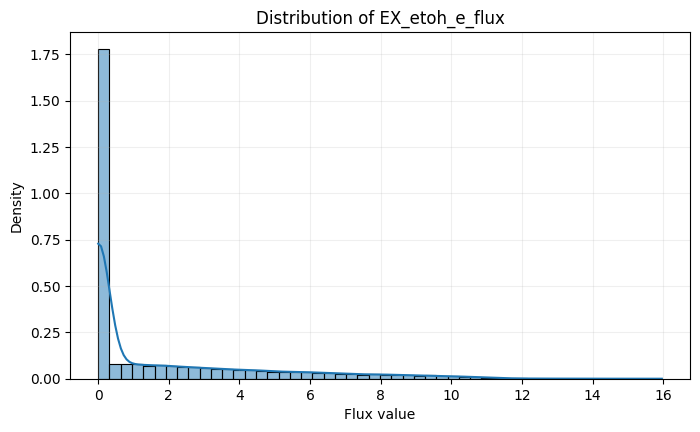

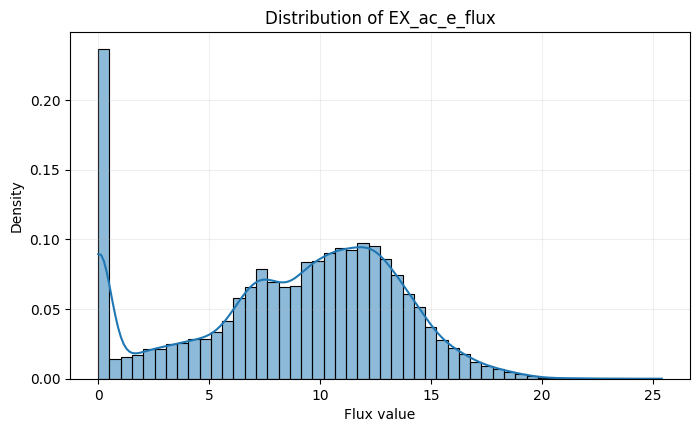

In [13]:
def plot_flux_distribution(y, outputs, flux_name, bins=50, figsize=(8, 4.5)):
    """Plot the distribution of a selected output flux from target tensor y."""
    if flux_name not in outputs:
        raise ValueError(f"{flux_name} not found in outputs.")
    flux_idx = outputs.index(flux_name)
    flux_values = y[:, flux_idx]
    if isinstance(flux_values, torch.Tensor):
        flux_values = flux_values.detach().cpu().numpy()
    else:
        flux_values = np.asarray(flux_values)

    plt.figure(figsize=figsize)
    sns.histplot(flux_values, bins=bins, kde=True, stat="density", color="tab:blue")
    plt.title(f"Distribution of {flux_name}")
    plt.xlabel("Flux value")
    plt.ylabel("Density")
    plt.grid(alpha=0.2)
    plt.show()

#plot_flux_distribution(y, outputs, "BIOMASS_Ec_iML1515_core_75p37M_flux")
plot_flux_distribution(y, outputs, "EX_etoh_e_flux")
plot_flux_distribution(y, outputs, "EX_ac_e_flux")

### Plot Results

In [14]:
today = date.today().isoformat()
pic_dir = f"./pics/{today}/{model_name}"

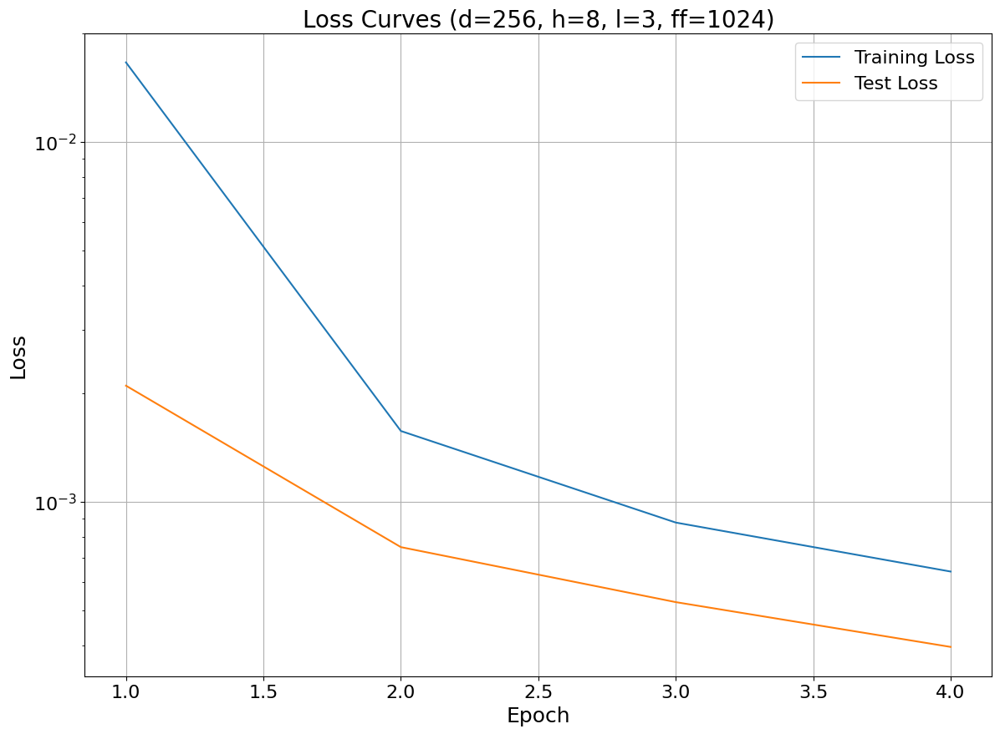

In [15]:
plot_loss_curves(
    train_losses,
    test_losses,
    d_model=config['d_model'],
    n_heads=config['n_heads'],
    n_layers=config['n_layers'],
    d_ff=config['d_ff']
)

BIOMASS_Ec_iML1515_core_75p37M_flux:
------------------------------------------------------------
BIOMASS_Ec_iML1515_core_75p37M_flux token index: 2668
injected medium slot: False
y_true range: 0.0026933022309094667 to 1.3314992189407349
y_pred range: 0.03281140327453613 to 1.2156956195831299
Metrics computed for: BIOMASS_Ec_iML1515_core_75p37M_flux
R2: 0.9953
MAE: 0.010146
RMSE: 0.014231


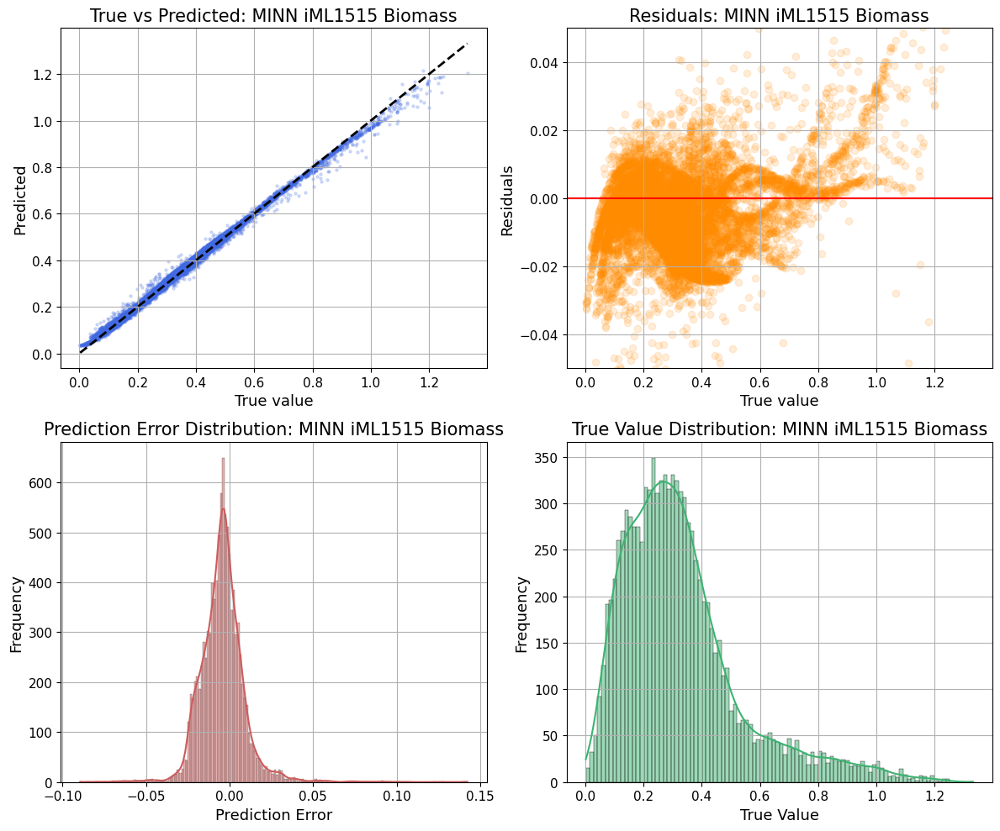

In [16]:
diagnostic_metric_rows = []
diagnostics_to_plot = ['BIOMASS_Ec_iML1515_core_75p37M_flux']
#diagnostics_to_plot = ["BIOMASS_Ec_iML1515_WT_75p37M_flux"]

for flux_name in diagnostics_to_plot:
    save_path = f"{pic_dir}/{flux_name}"
    print(f'{flux_name}:')
    print(60 * '-')
    diagnostic_metric_rows.append(plot_flux(model, X_test, y_test, outputs, flux_name, save_path=save_path))


Plotting 46 diagnostic fluxes
GLCptspp_flux:
------------------------------------------------------------
GLCptspp_flux token index: 1414
injected medium slot: False
y_true range: -7.965681006854284e-16 to 18.68000030517578
y_pred range: -0.1321006417274475 to 18.35219383239746
Metrics computed for: GLCptspp_flux
R2: 0.9979
MAE: 0.070155
RMSE: 0.225444


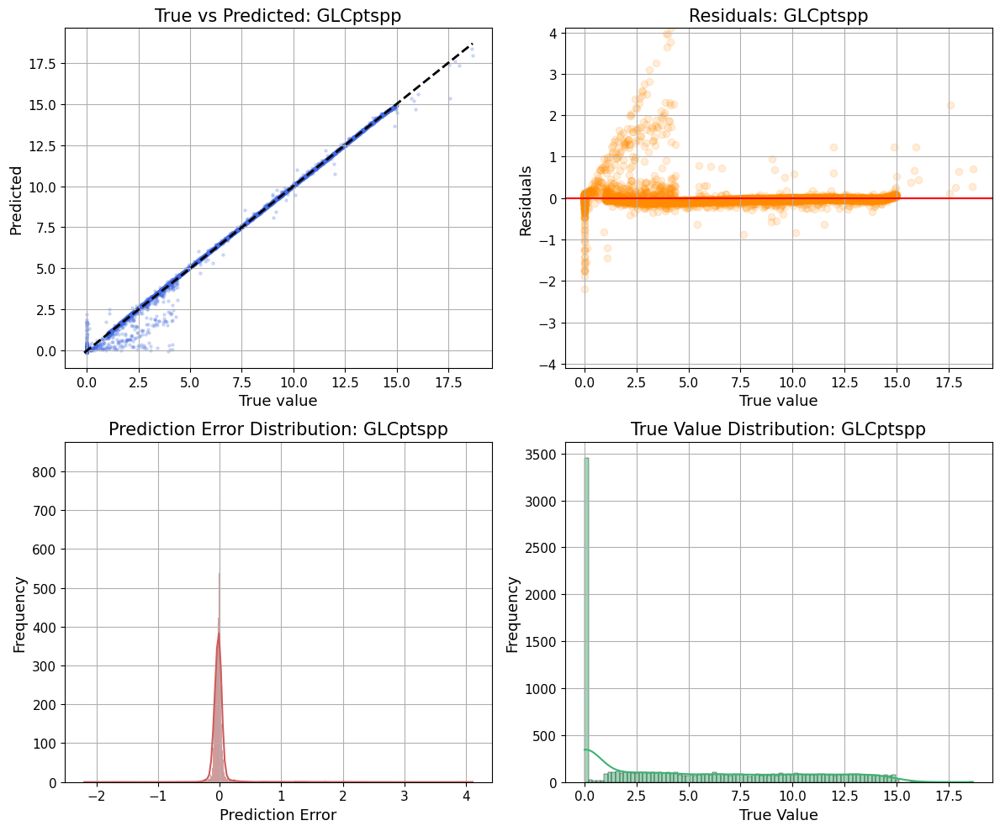

PGI_flux:
------------------------------------------------------------
PGI_flux token index: 137
injected medium slot: False
y_true range: -5.3642194208964895e-15 to 18.68000030517578
y_pred range: -0.130601167678833 to 19.101484298706055
Metrics computed for: PGI_flux
R2: 0.9983
MAE: 0.129454
RMSE: 0.176110


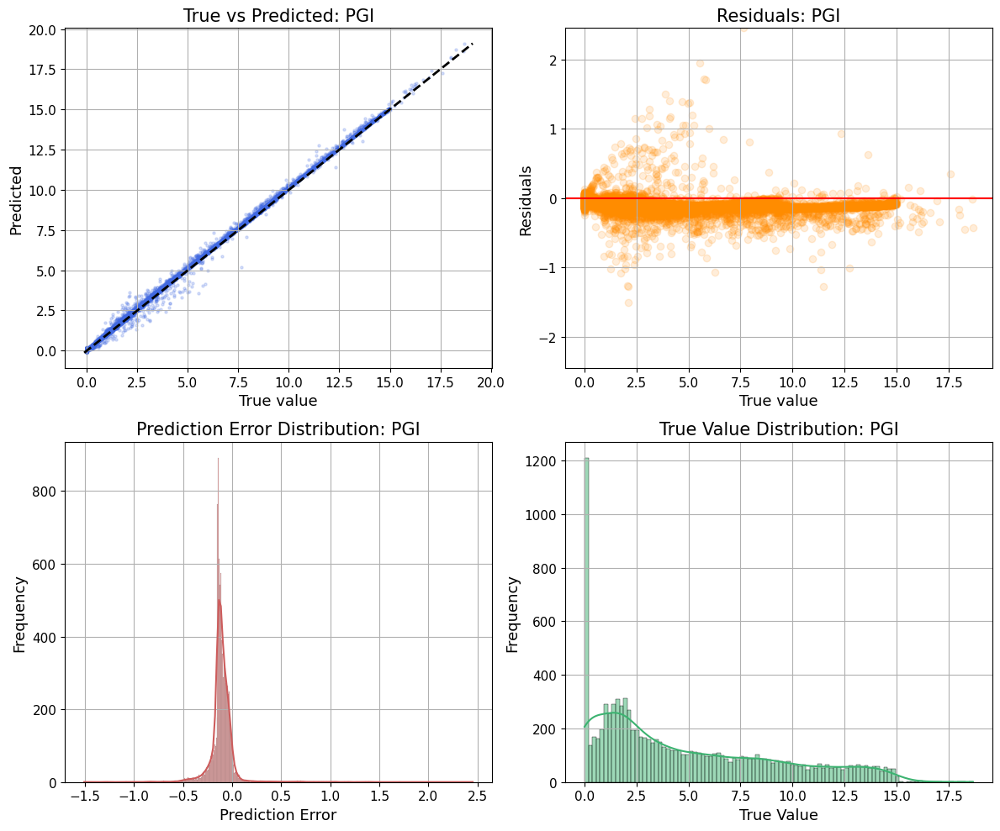

PFK_flux:
------------------------------------------------------------
PFK_flux token index: 1861
injected medium slot: False
y_true range: -2.182975588488345e-12 to 9.2516450881958
y_pred range: -0.10489796847105026 to 9.264556884765625
Metrics computed for: PFK_flux
R2: 0.9970
MAE: 0.060000
RMSE: 0.097501


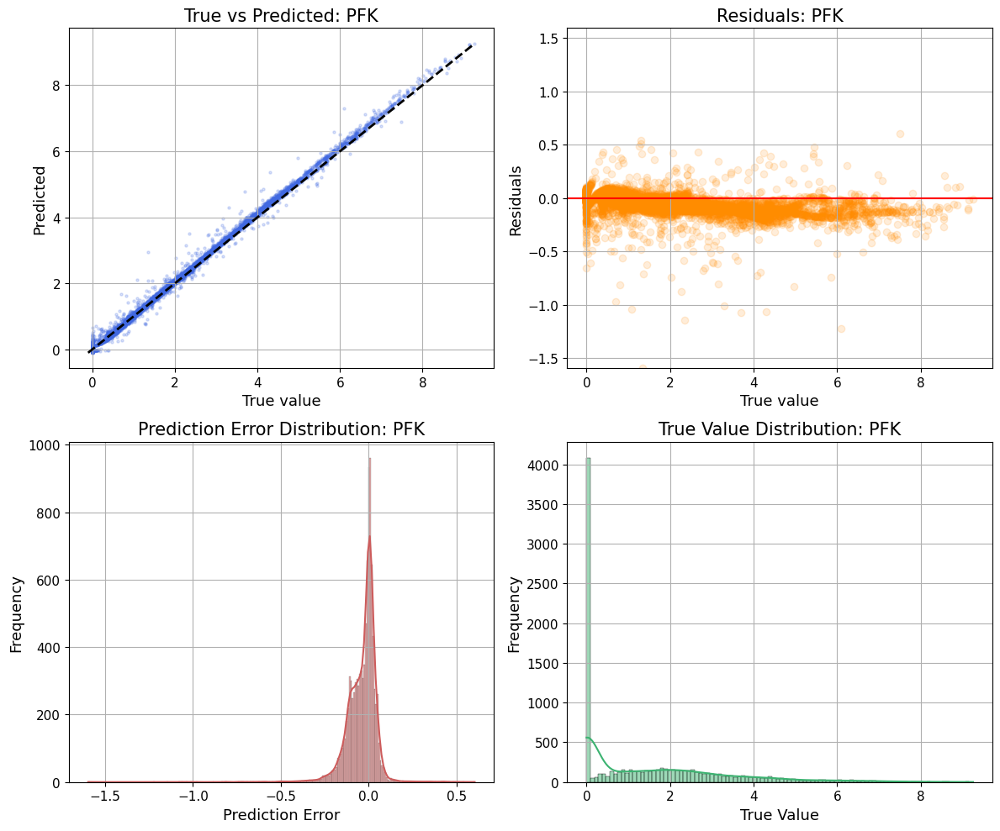

FBA_flux:
------------------------------------------------------------
FBA_flux token index: 127
injected medium slot: False
y_true range: -5.884358755467445e-13 to 9.2516450881958
y_pred range: -0.11382192373275757 to 9.141670227050781
Metrics computed for: FBA_flux
R2: 0.9971
MAE: 0.058295
RMSE: 0.096091


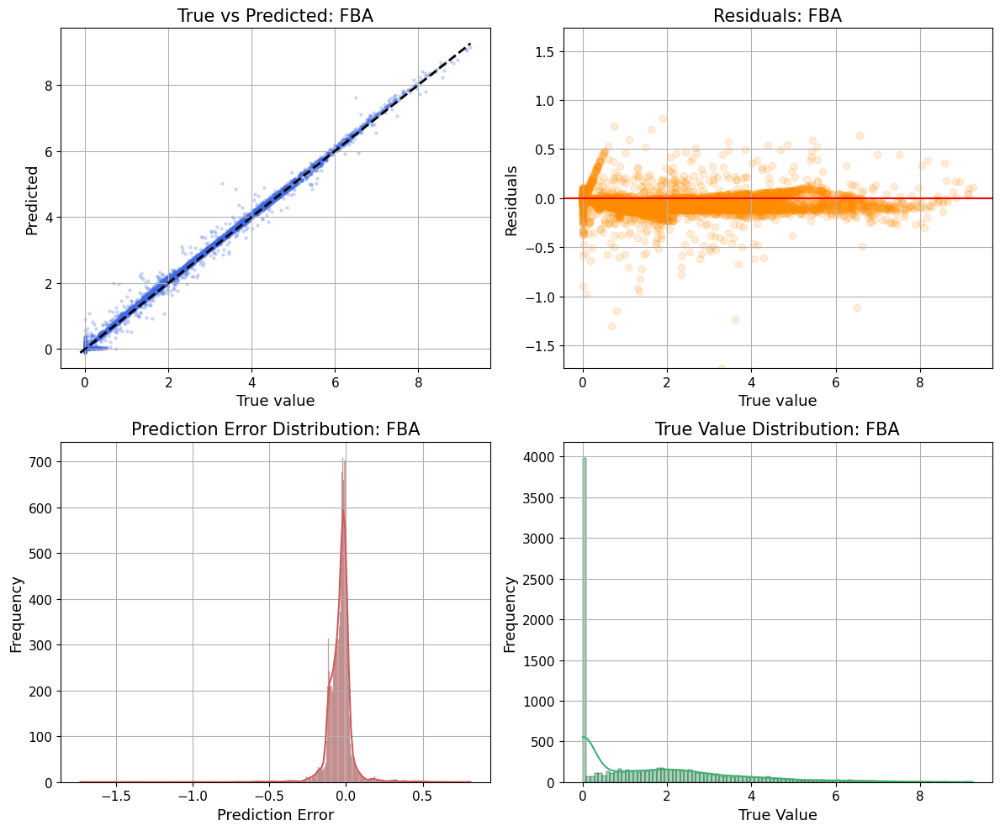

TPI_flux:
------------------------------------------------------------
TPI_flux token index: 1878
injected medium slot: False
y_true range: 0.8646648526191711 to 19.535673141479492
y_pred range: 0.8746604919433594 to 19.84623146057129
Metrics computed for: TPI_flux
R2: 0.9994
MAE: 0.071767
RMSE: 0.086885


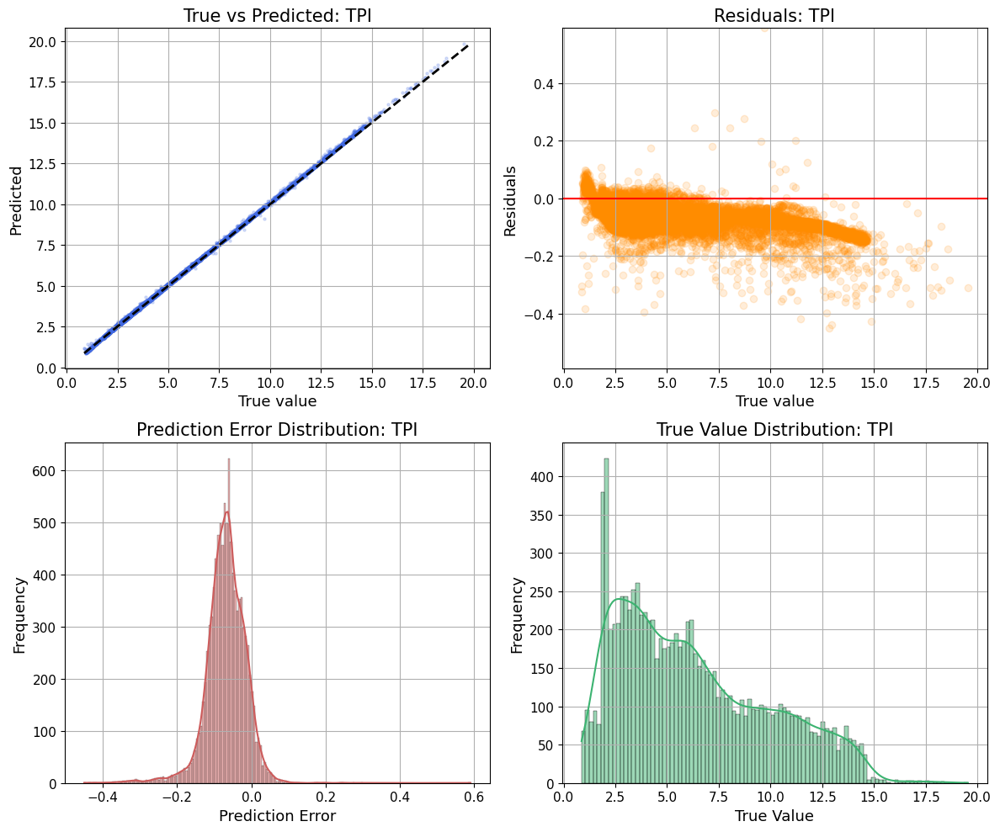

PGK_flux:
------------------------------------------------------------
PGK_flux token index: 140
injected medium slot: False
y_true range: -41.13023376464844 to -1.2997182607650757
y_pred range: -39.961788177490234 to -1.353129506111145
Metrics computed for: PGK_flux
R2: 0.9998
MAE: 0.094891
RMSE: 0.110027


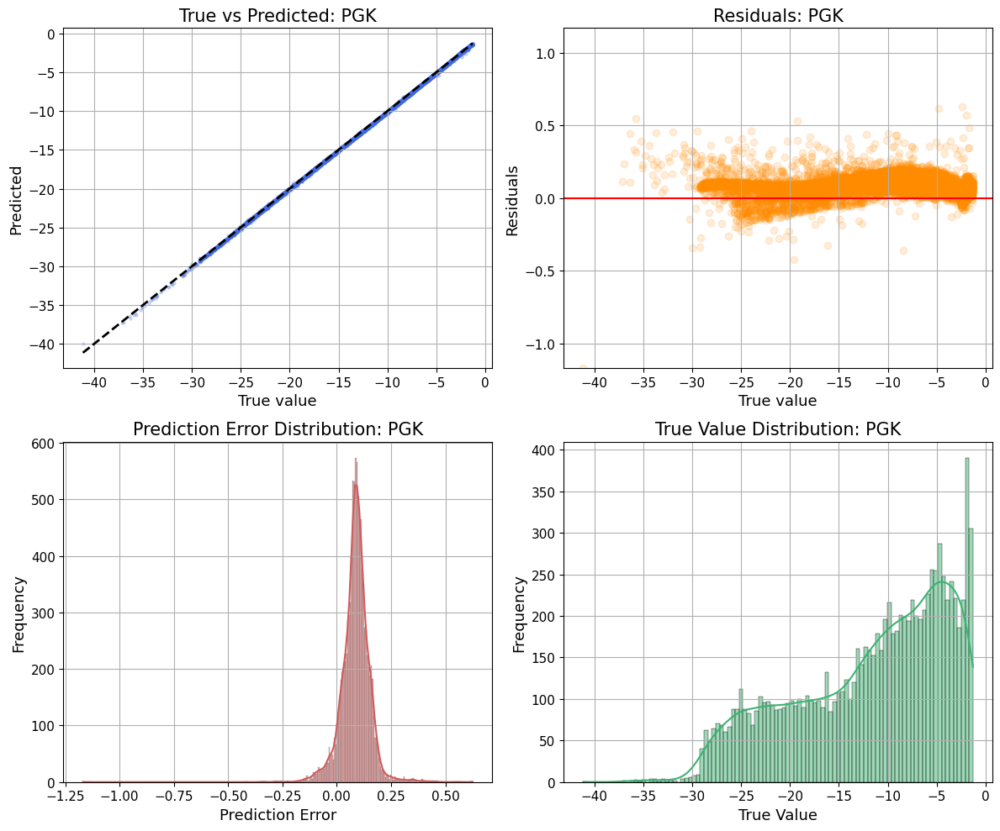

GAPD_flux:
------------------------------------------------------------
GAPD_flux token index: 601
injected medium slot: False
y_true range: 1.2997182607650757 to 41.13023376464844
y_pred range: 1.363110065460205 to 40.45555877685547
Metrics computed for: GAPD_flux
R2: 0.9996
MAE: 0.122394
RMSE: 0.147862


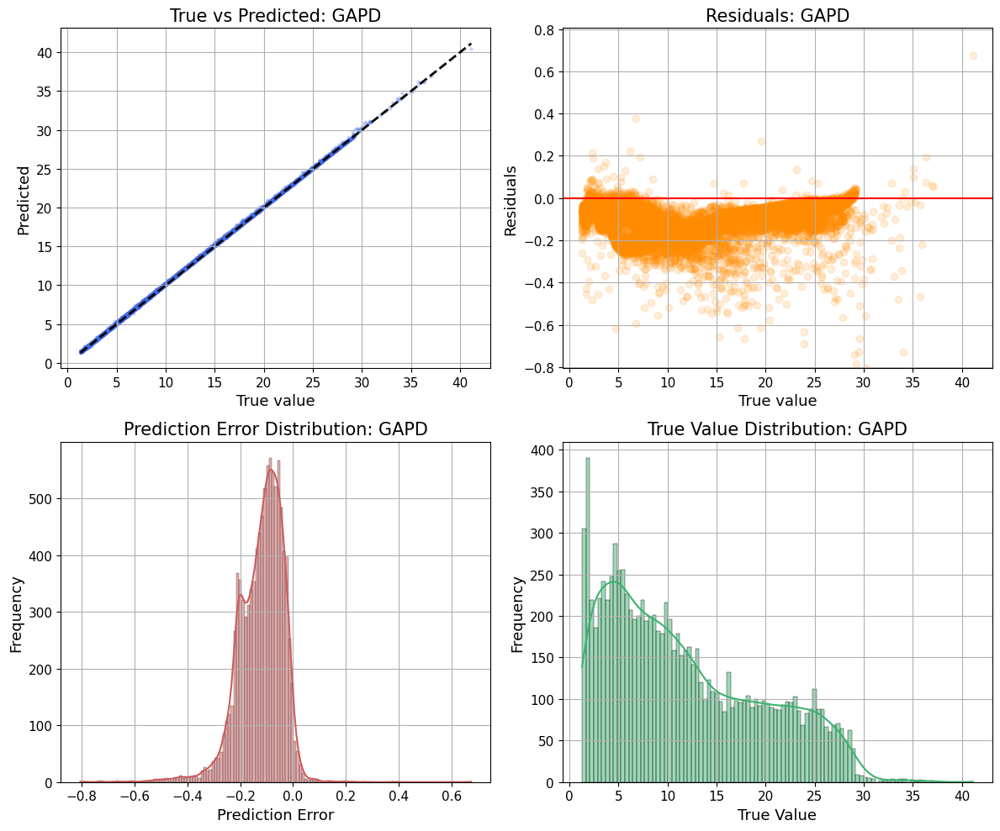

ENO_flux:
------------------------------------------------------------
ENO_flux token index: 126
injected medium slot: False
y_true range: 1.2997182607650757 to 39.0612907409668
y_pred range: 1.3284509181976318 to 38.87205505371094
Metrics computed for: ENO_flux
R2: 0.9998
MAE: 0.091583
RMSE: 0.113387


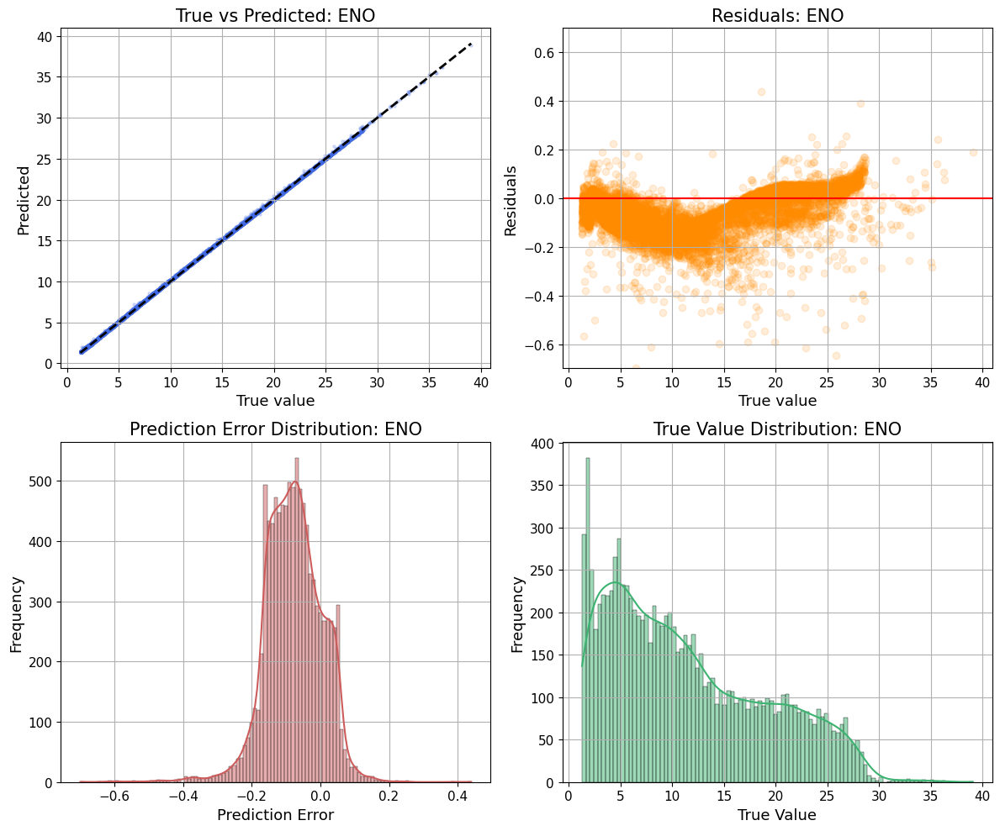

PGM_flux:
------------------------------------------------------------
PGM_flux token index: 1868
injected medium slot: False
y_true range: -39.0612907409668 to -1.2997182607650757
y_pred range: -38.062557220458984 to -1.3973231315612793
Metrics computed for: PGM_flux
R2: 0.9998
MAE: 0.079166
RMSE: 0.098214


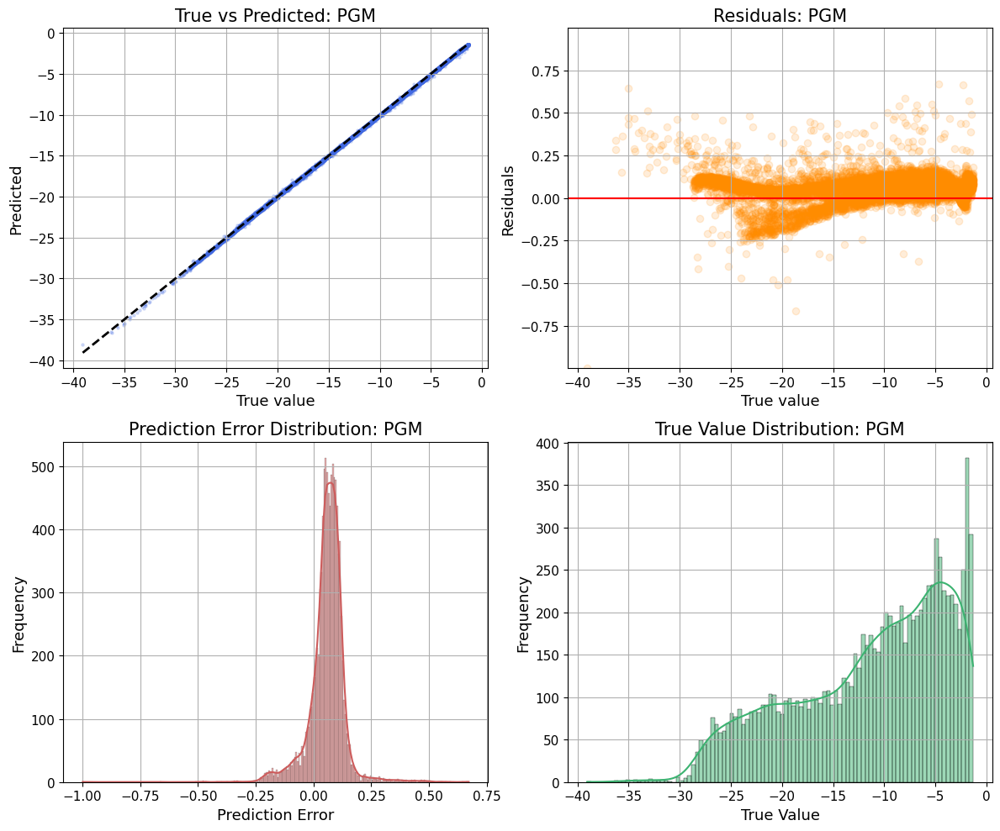

PYK_flux:
------------------------------------------------------------
PYK_flux token index: 43
injected medium slot: False
y_true range: 0.0 to 10.05357551574707
y_pred range: -0.08695077896118164 to 10.053226470947266
Metrics computed for: PYK_flux
R2: 0.9756
MAE: 0.116349
RMSE: 0.249772


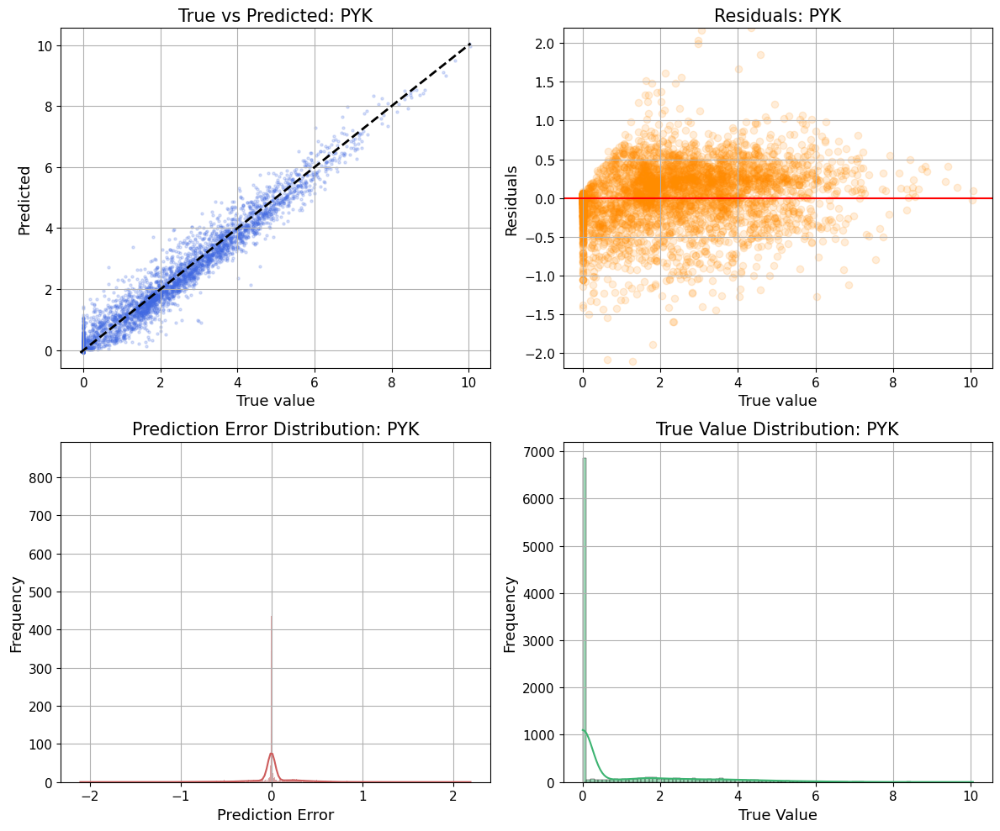

PDH_flux:
------------------------------------------------------------
PDH_flux token index: 1496
injected medium slot: False
y_true range: 0.0 to 18.62244415283203
y_pred range: -0.09765040874481201 to 19.587371826171875
Metrics computed for: PDH_flux
R2: 0.9985
MAE: 0.064651
RMSE: 0.132844


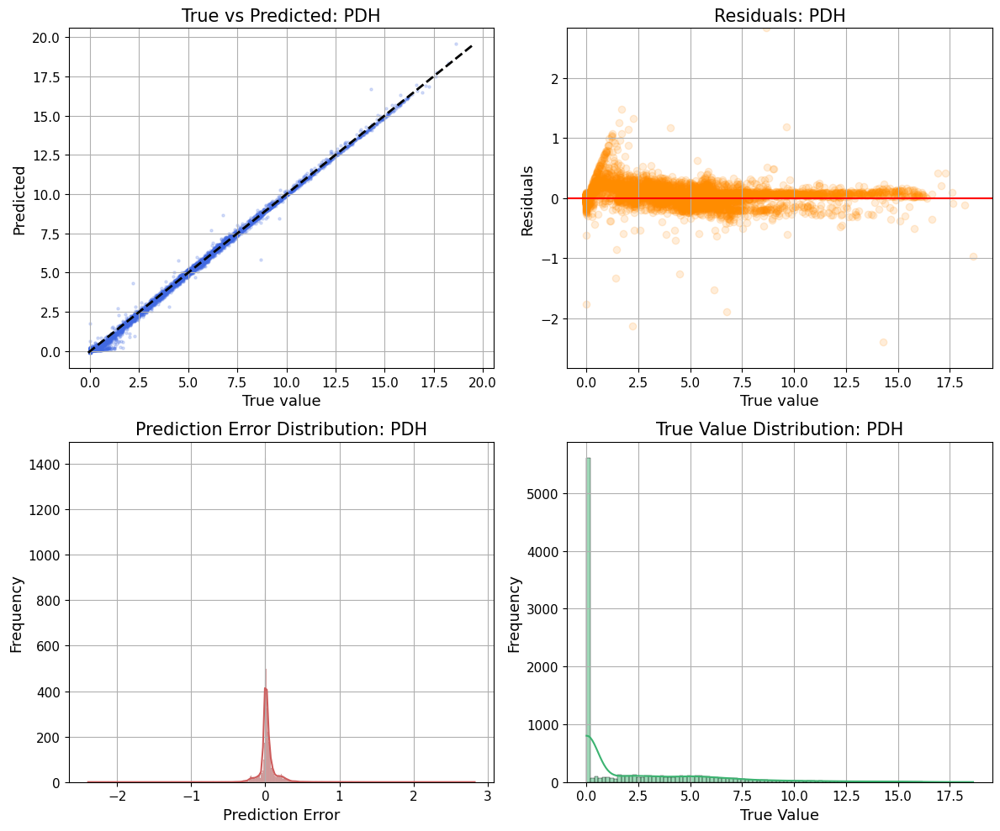

G6PDH2r_flux:
------------------------------------------------------------
G6PDH2r_flux token index: 615
injected medium slot: False
y_true range: -1.089749245673285e-18 to 7.606715202331543
y_pred range: -0.07390075922012329 to 7.115884780883789
Metrics computed for: G6PDH2r_flux
R2: 0.9977
MAE: 0.021799
RMSE: 0.058739


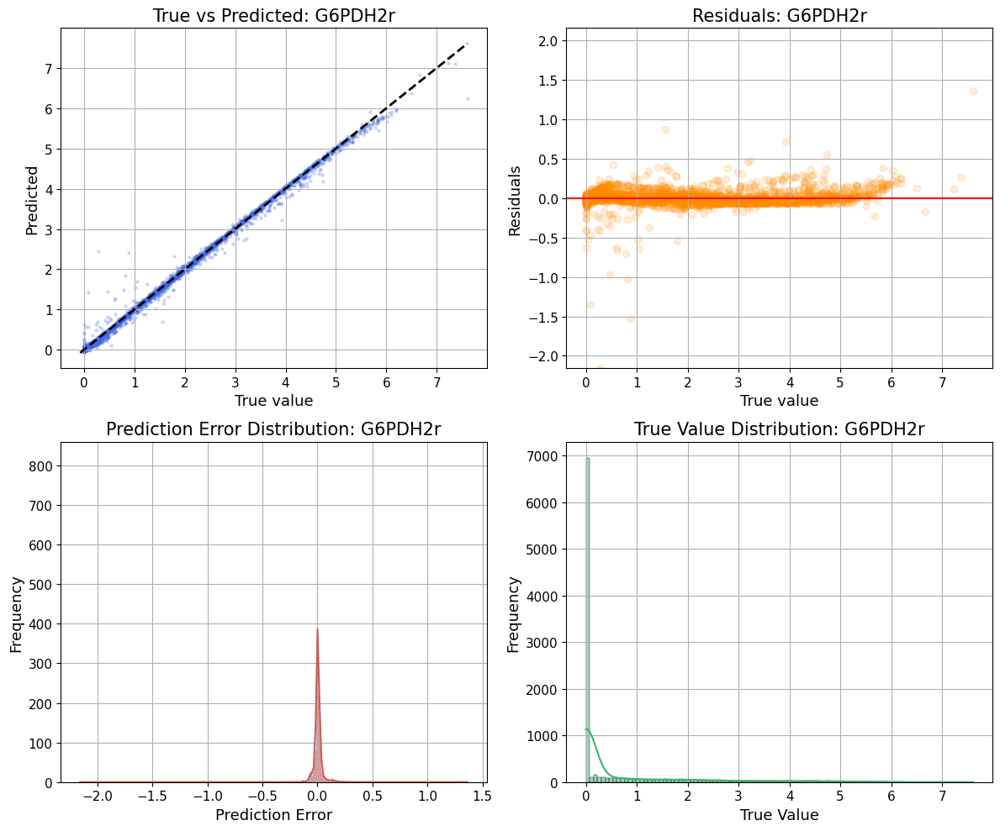

PGL_flux:
------------------------------------------------------------
PGL_flux token index: 150
injected medium slot: False
y_true range: -1.089749245673285e-18 to 7.606715202331543
y_pred range: -0.03402557969093323 to 7.002724647521973
Metrics computed for: PGL_flux
R2: 0.9973
MAE: 0.025785
RMSE: 0.063574


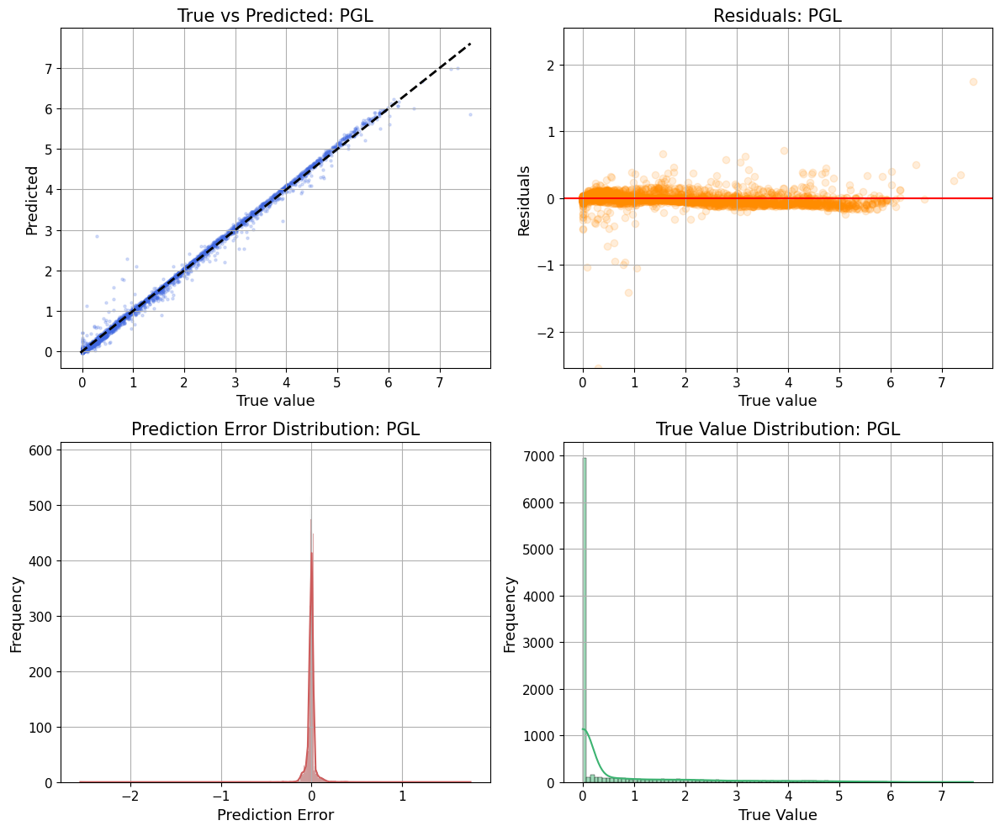

GND_flux:
------------------------------------------------------------
GND_flux token index: 607
injected medium slot: False
y_true range: 0.0 to 7.606715202331543
y_pred range: -0.03568941354751587 to 7.002037048339844
Metrics computed for: GND_flux
R2: 0.9973
MAE: 0.023313
RMSE: 0.063043


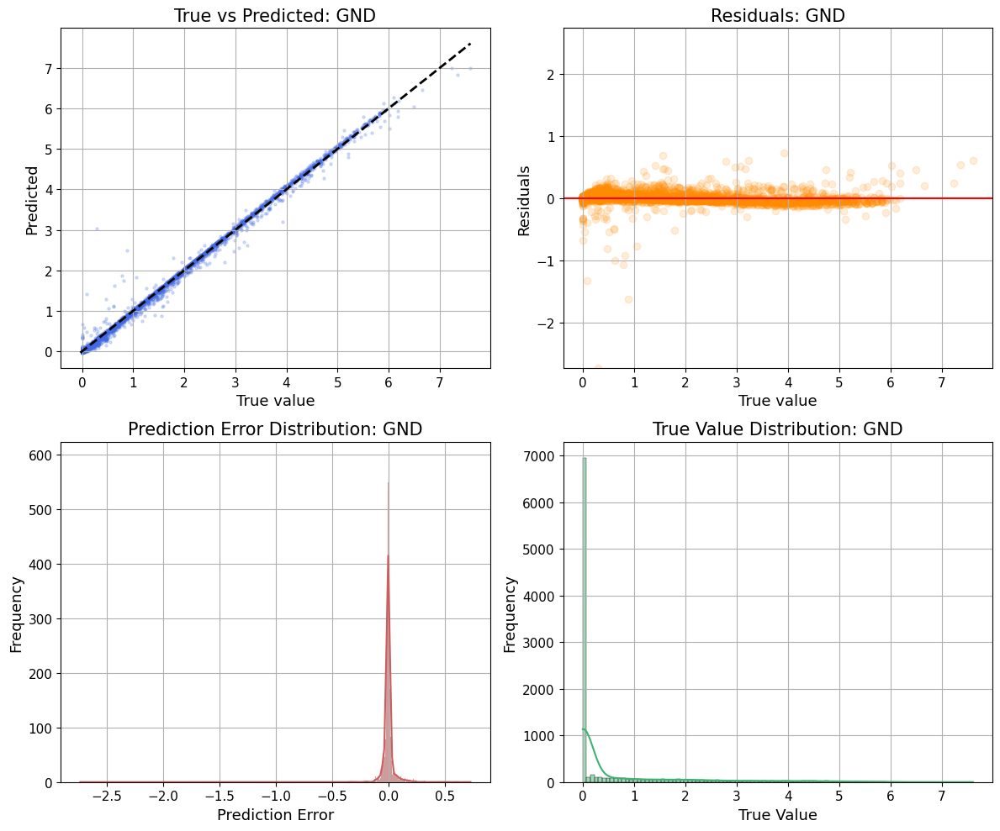

RPE_flux:
------------------------------------------------------------
RPE_flux token index: 154
injected medium slot: False
y_true range: -0.5658307075500488 to 4.580047607421875
y_pred range: -0.5018474459648132 to 4.333674430847168
Metrics computed for: RPE_flux
R2: 0.9938
MAE: 0.028268
RMSE: 0.056086


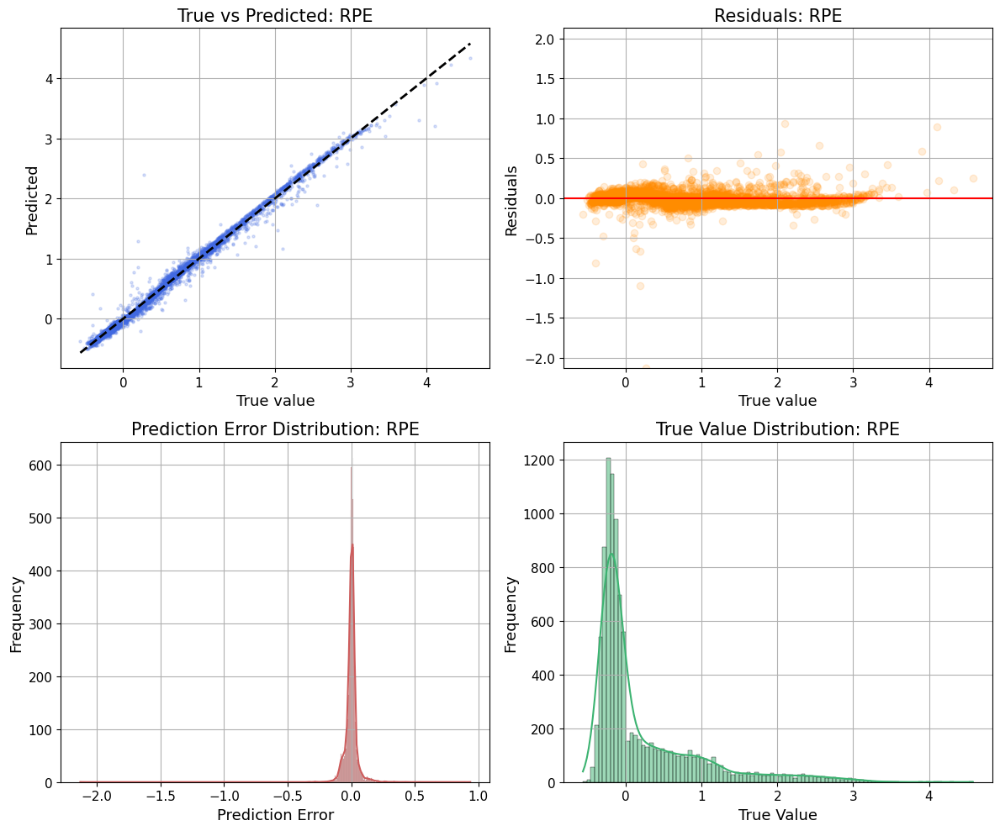

RPI_flux:
------------------------------------------------------------
RPI_flux token index: 1891
injected medium slot: False
y_true range: -3.4507033824920654 to 1.3844350576400757
y_pred range: -3.1270852088928223 to 1.3630702495574951
Metrics computed for: RPI_flux
R2: 0.9959
MAE: 0.023458
RMSE: 0.039933


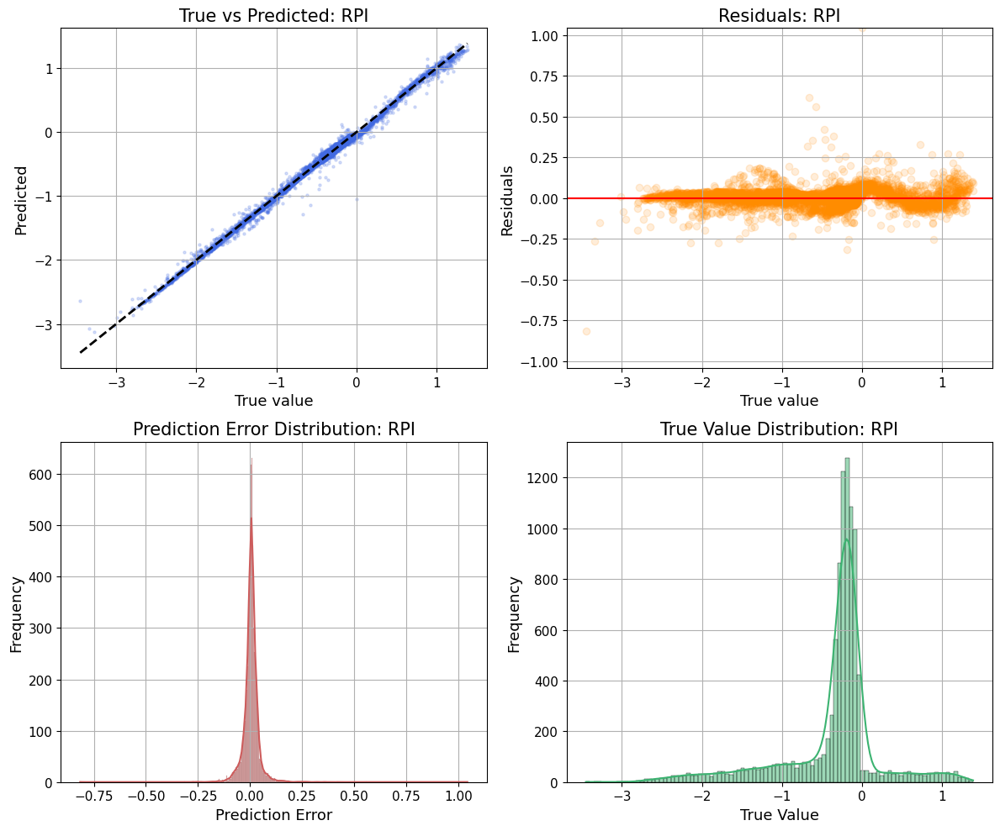

TKT1_flux:
------------------------------------------------------------
TKT1_flux token index: 163
injected medium slot: False
y_true range: -0.1399444192647934 to 2.5084824562072754
y_pred range: -0.11986956000328064 to 2.312084197998047
Metrics computed for: TKT1_flux
R2: 0.9937
MAE: 0.016232
RMSE: 0.030462


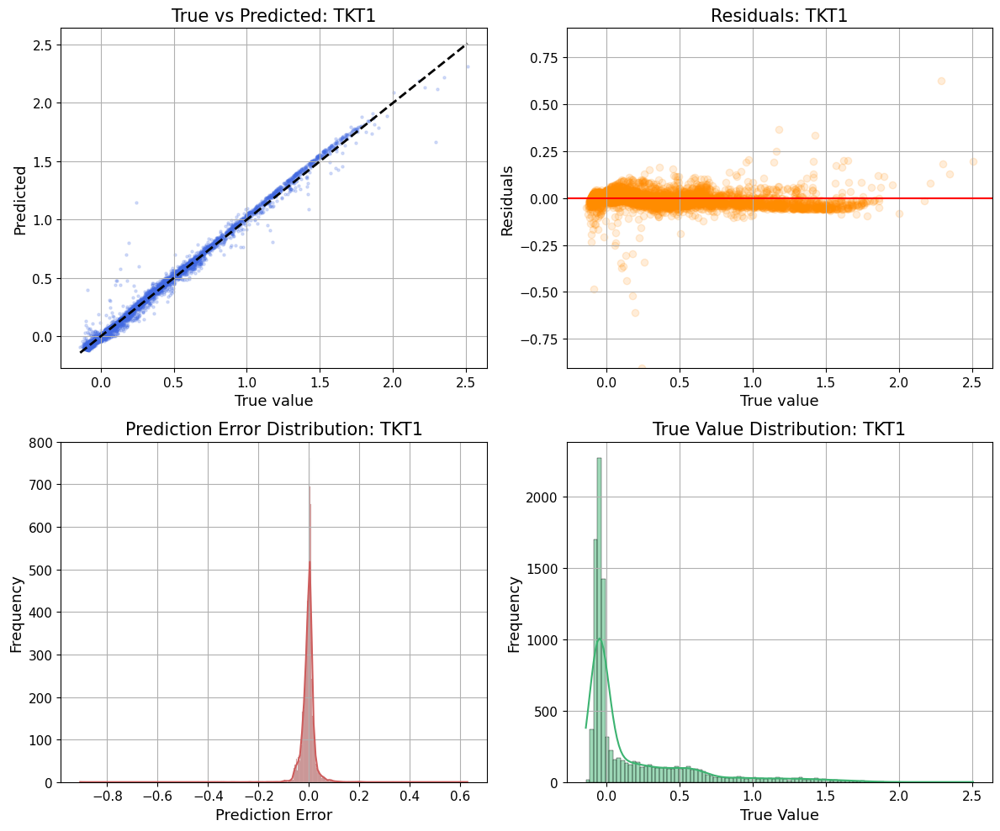

TALA_flux:
------------------------------------------------------------
TALA_flux token index: 158
injected medium slot: False
y_true range: -0.1399444192647934 to 1.1600151062011719
y_pred range: -0.13539481163024902 to 0.5937681198120117
Metrics computed for: TALA_flux
R2: 0.7094
MAE: 0.024001
RMSE: 0.060165


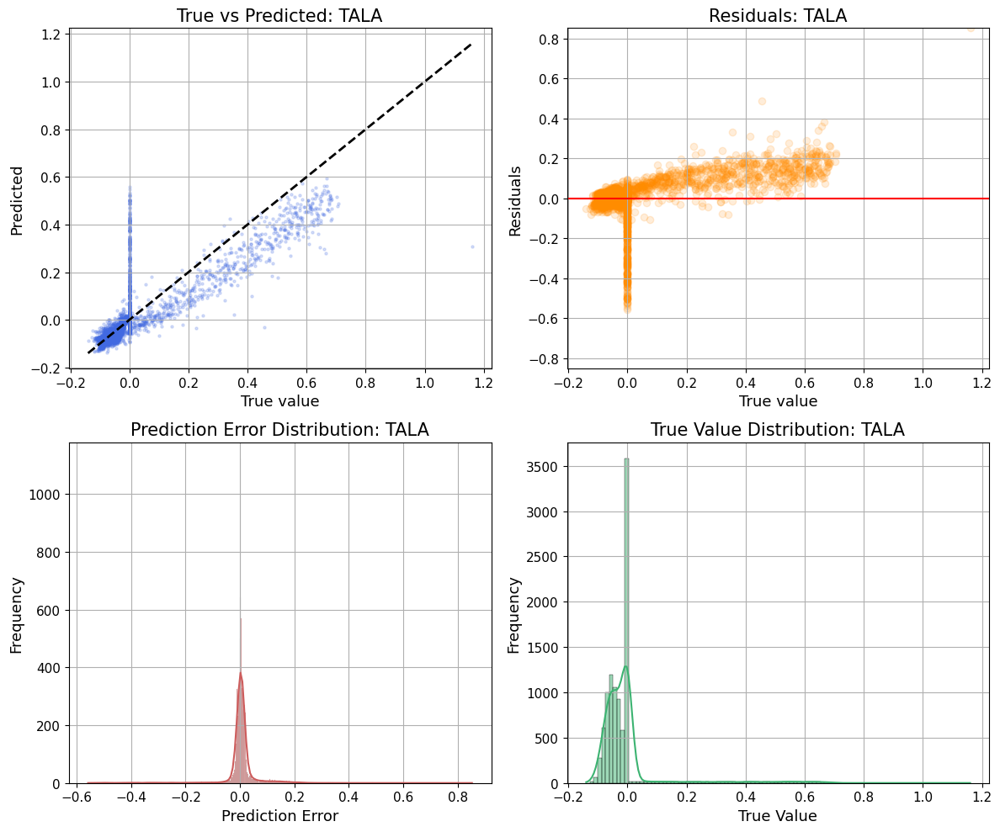

TKT2_flux:
------------------------------------------------------------
TKT2_flux token index: 787
injected medium slot: False
y_true range: -0.42588627338409424 to 2.0715649127960205
y_pred range: -0.41505956649780273 to 1.943744421005249
Metrics computed for: TKT2_flux
R2: 0.9881
MAE: 0.023950
RMSE: 0.036434


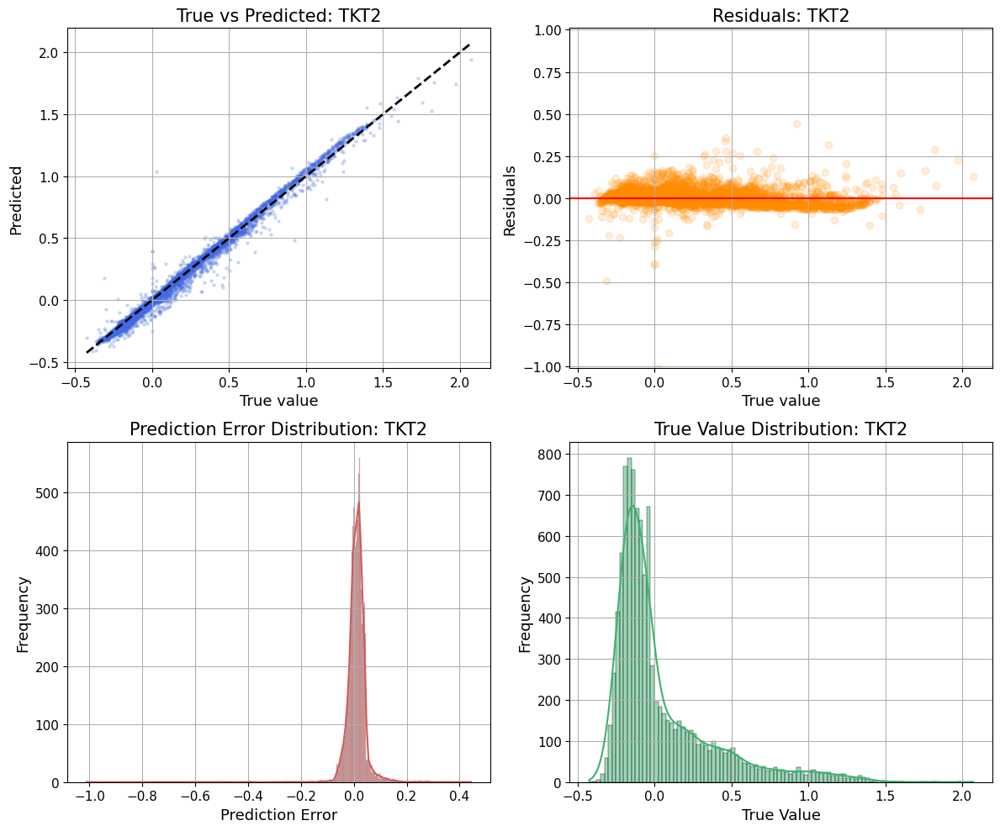

CS_flux:
------------------------------------------------------------
CS_flux token index: 11
injected medium slot: False
y_true range: 0.0 to 9.136526107788086
y_pred range: -0.044349879026412964 to 8.972281455993652
Metrics computed for: CS_flux
R2: 0.9995
MAE: 0.017462
RMSE: 0.033397


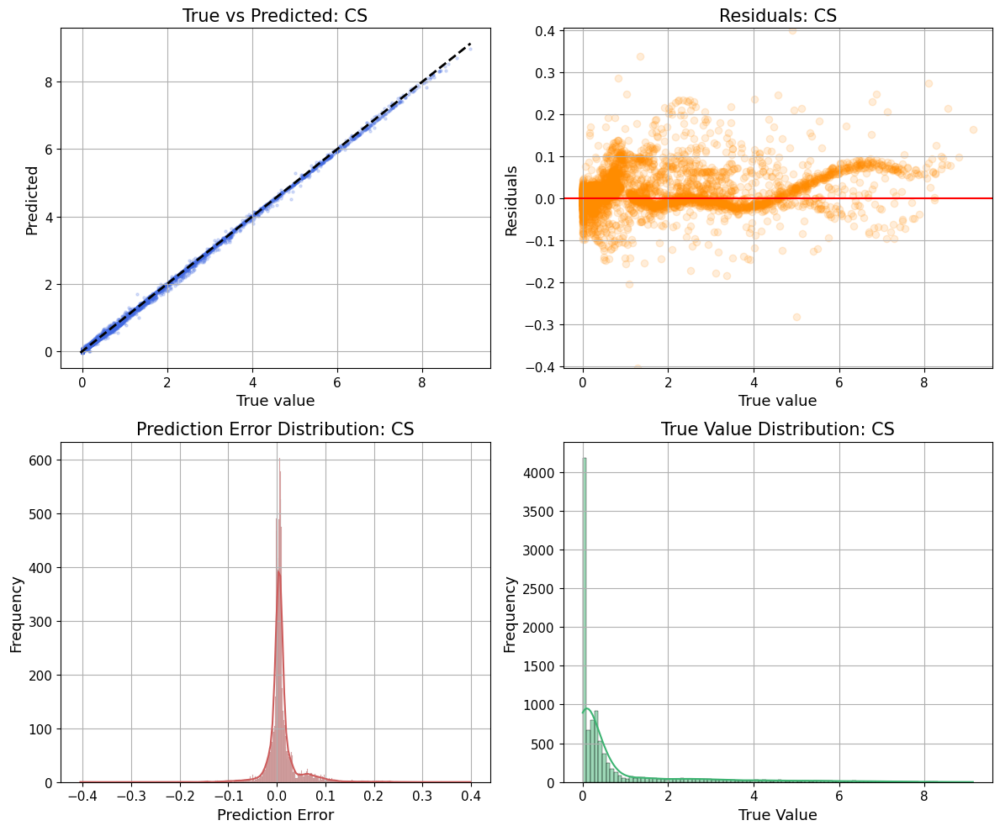

ACONTb_flux:
------------------------------------------------------------
ACONTb_flux token index: 1945
injected medium slot: False
y_true range: -0.8928695321083069 to 9.136526107788086
y_pred range: -0.536376953125 to 9.017014503479004
Metrics computed for: ACONTb_flux
R2: 0.9985
MAE: 0.033605
RMSE: 0.058820


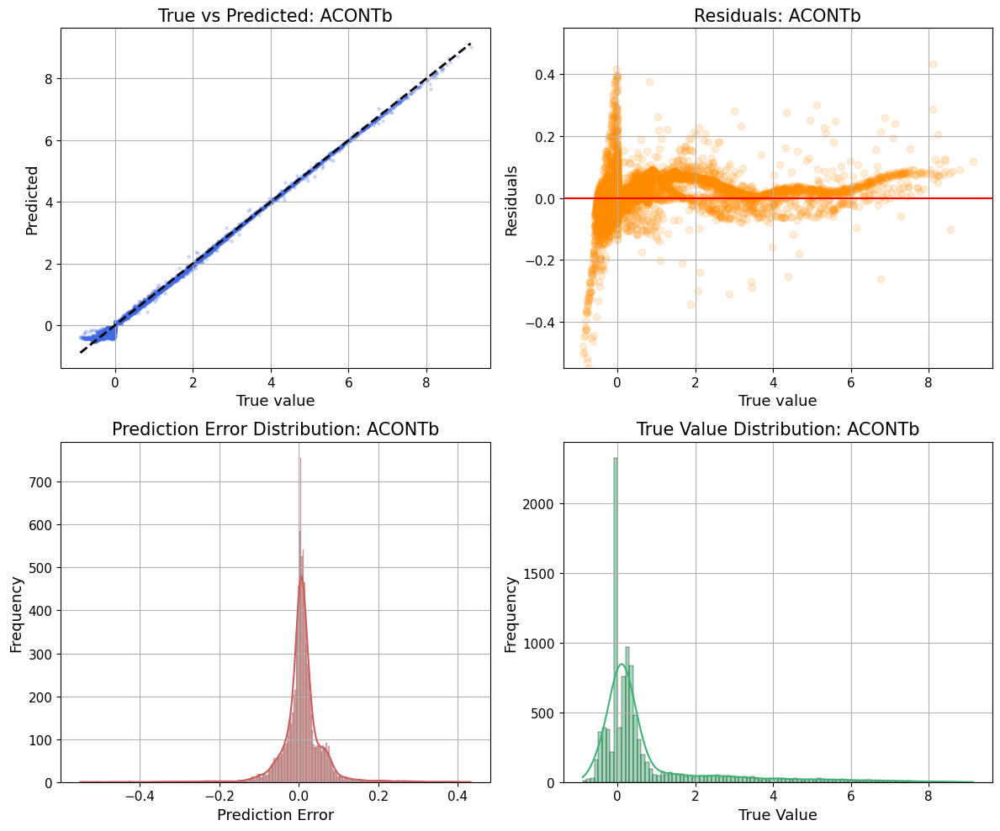

ACONTa_flux:
------------------------------------------------------------
ACONTa_flux token index: 2041
injected medium slot: False
y_true range: -0.8928695321083069 to 9.136526107788086
y_pred range: -0.6685156226158142 to 9.073845863342285
Metrics computed for: ACONTa_flux
R2: 0.9979
MAE: 0.036315
RMSE: 0.070162


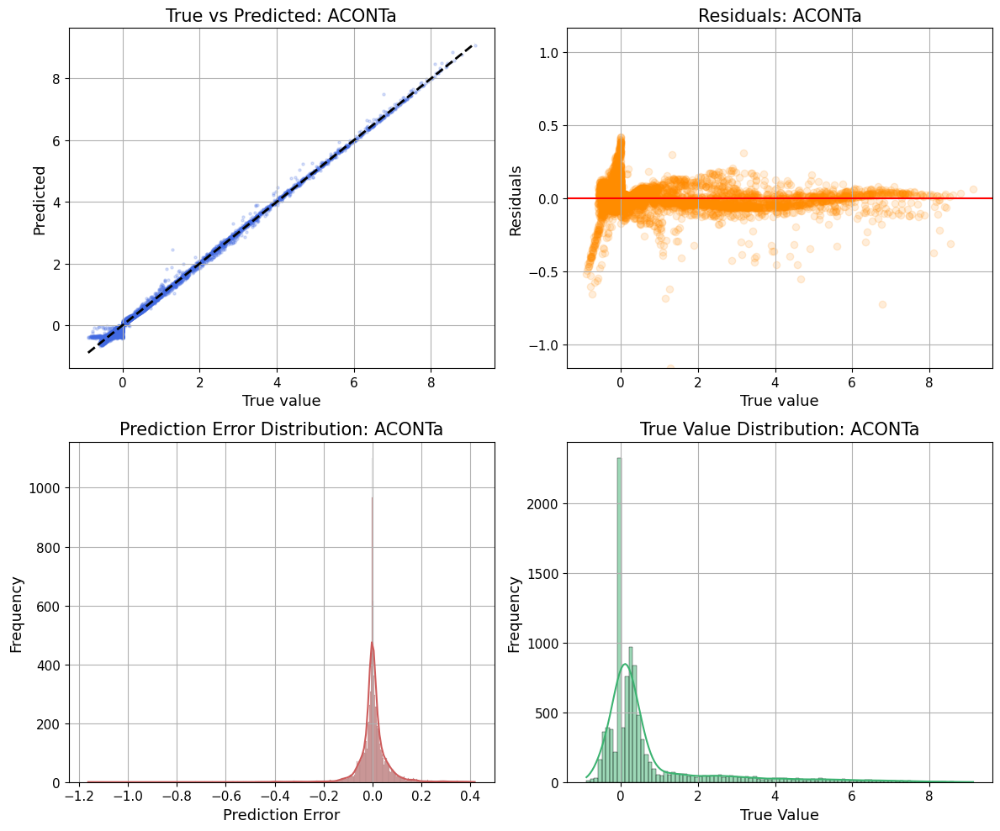

ICDHyr_flux:
------------------------------------------------------------
ICDHyr_flux token index: 12
injected medium slot: False
y_true range: -0.8928695321083069 to 9.136526107788086
y_pred range: -0.6883883476257324 to 9.038366317749023
Metrics computed for: ICDHyr_flux
R2: 0.9984
MAE: 0.033846
RMSE: 0.060223


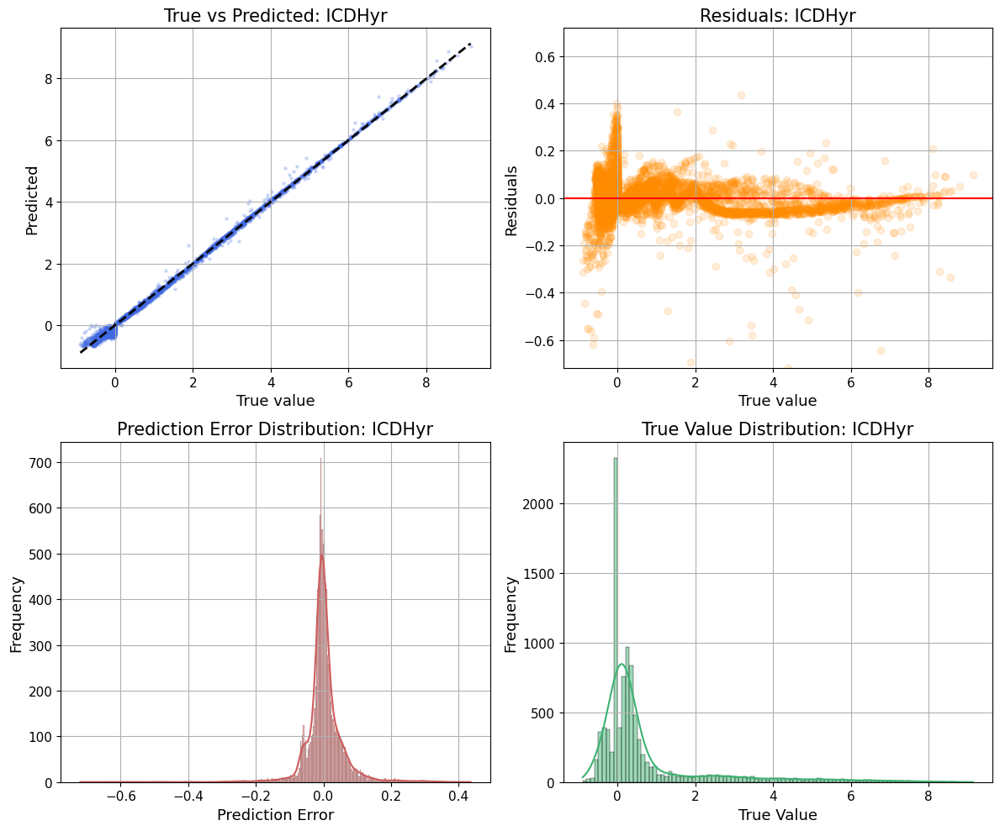

SUCOAS_flux:
------------------------------------------------------------
SUCOAS_flux token index: 1642
injected medium slot: False
y_true range: -7.219843864440918 to 0.6528562307357788
y_pred range: -6.872325420379639 to 0.682358980178833
Metrics computed for: SUCOAS_flux
R2: 0.9983
MAE: 0.027378
RMSE: 0.050944


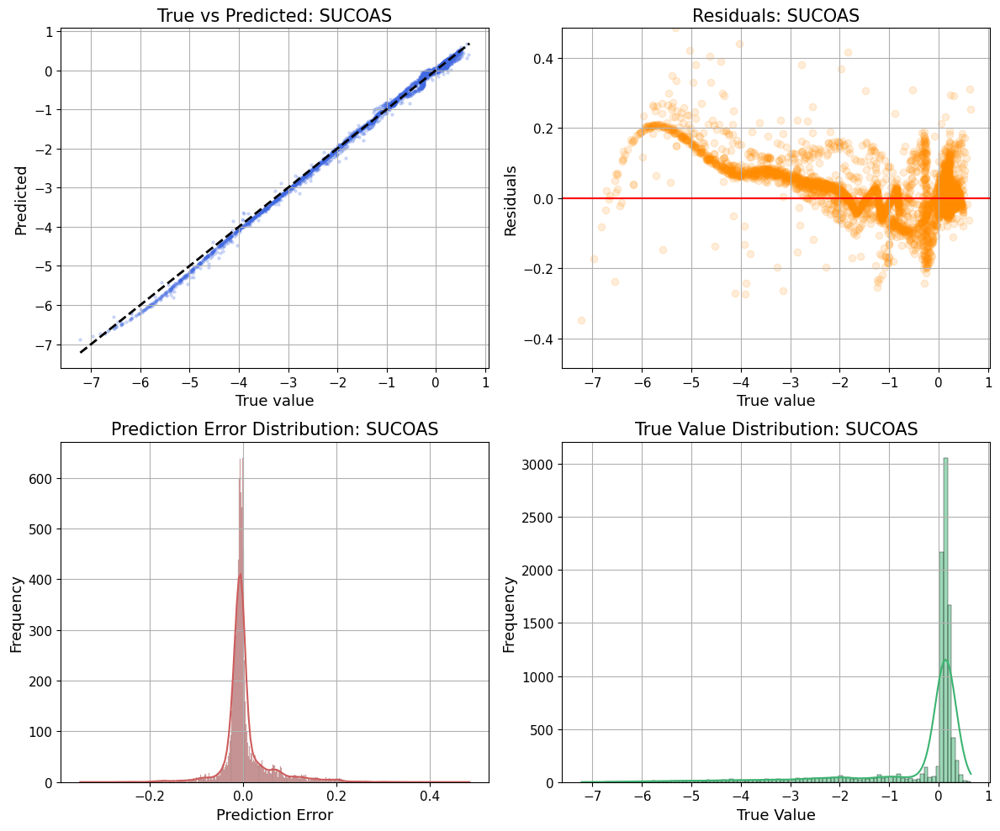

AKGDH_flux:
------------------------------------------------------------
AKGDH_flux token index: 506
injected medium slot: False
y_true range: 0.0 to 7.84864616394043
y_pred range: -0.08843451738357544 to 7.5057878494262695
Metrics computed for: AKGDH_flux
R2: 0.9990
MAE: 0.020797
RMSE: 0.040931


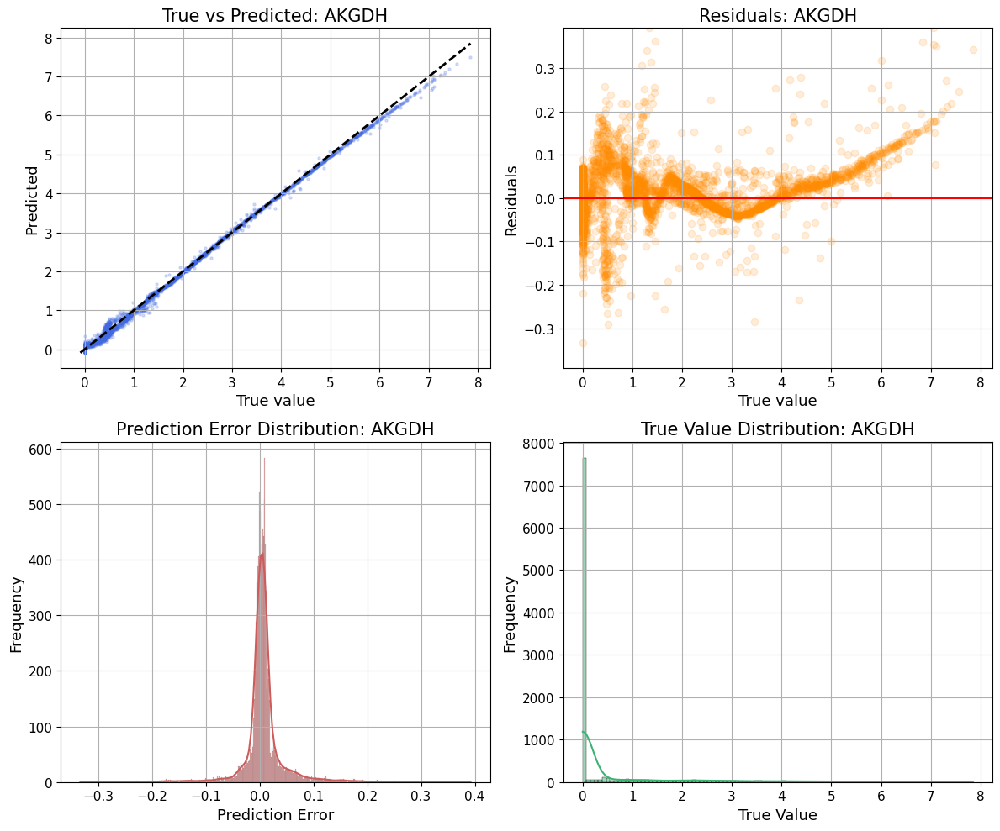

SUCDi_flux:
------------------------------------------------------------
SUCDi_flux token index: 1964
injected medium slot: False
y_true range: 1.5378756188511034e-06 to 8.939187049865723
y_pred range: -0.06705400347709656 to 8.594289779663086
Metrics computed for: SUCDi_flux
R2: 0.9982
MAE: 0.027855
RMSE: 0.055116


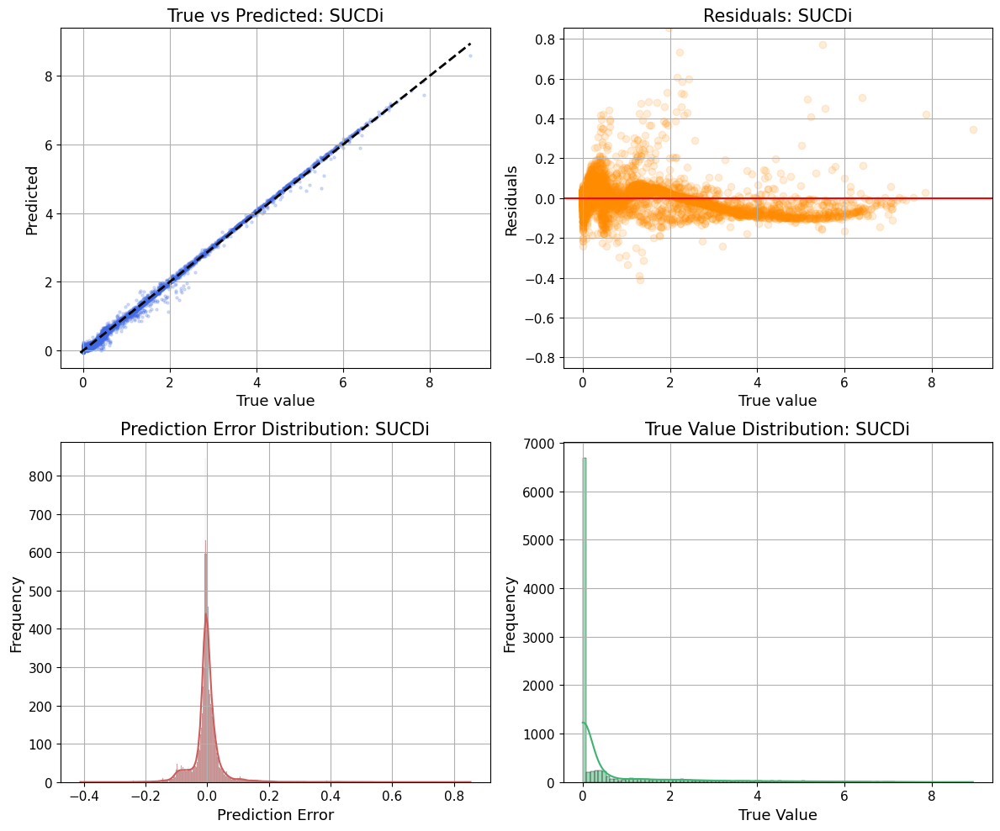

FUM_flux:
------------------------------------------------------------
FUM_flux token index: 195
injected medium slot: False
y_true range: 0.0028085431549698114 to 10.137840270996094
y_pred range: 0.0422995388507843 to 9.848857879638672
Metrics computed for: FUM_flux
R2: 0.9988
MAE: 0.027453
RMSE: 0.050354


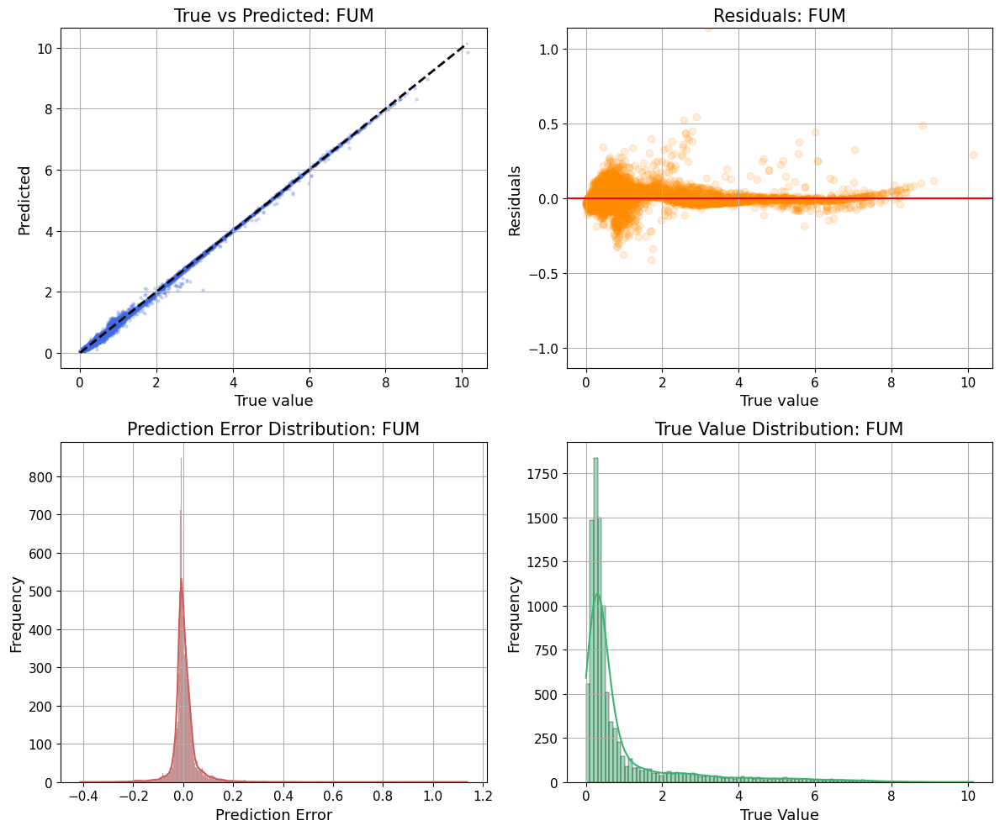

MDH_flux:
------------------------------------------------------------
MDH_flux token index: 192
injected medium slot: False
y_true range: 0.0 to 10.138608932495117
y_pred range: 0.03628730773925781 to 10.0181303024292
Metrics computed for: MDH_flux
R2: 0.9974
MAE: 0.033809
RMSE: 0.072773


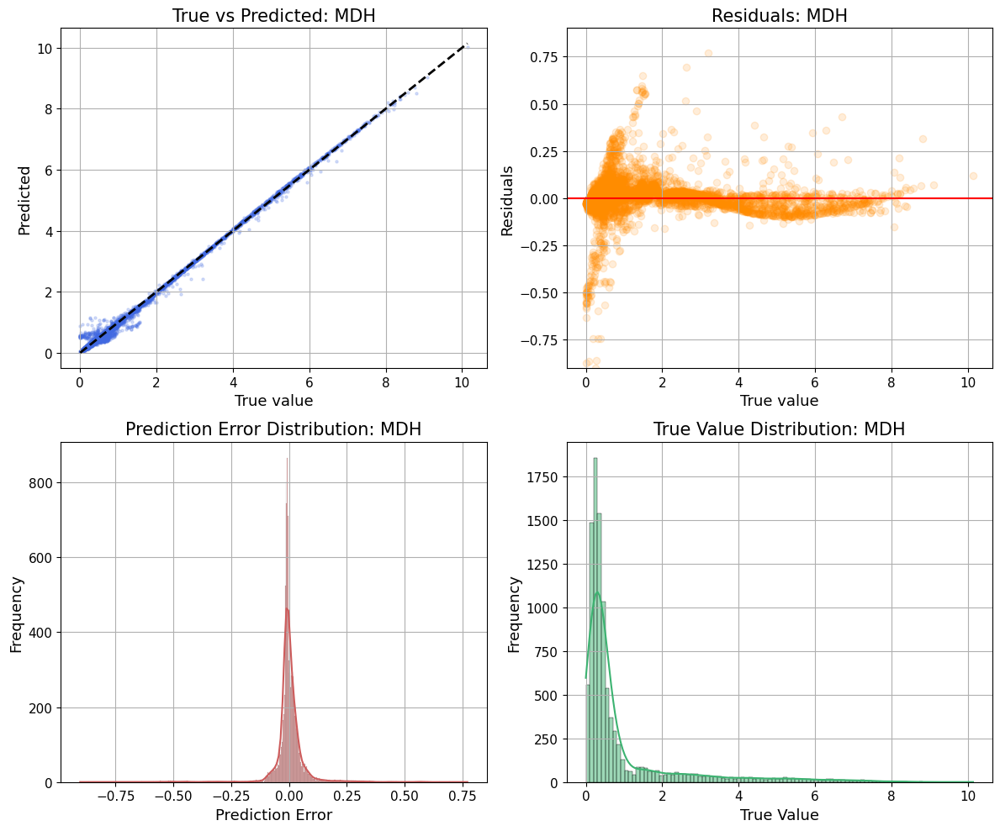

PPC_flux:
------------------------------------------------------------
PPC_flux token index: 295
injected medium slot: False
y_true range: 0.0 to 3.9406440258026123
y_pred range: -0.07303458452224731 to 3.9623360633850098
Metrics computed for: PPC_flux
R2: 0.9973
MAE: 0.022798
RMSE: 0.037808


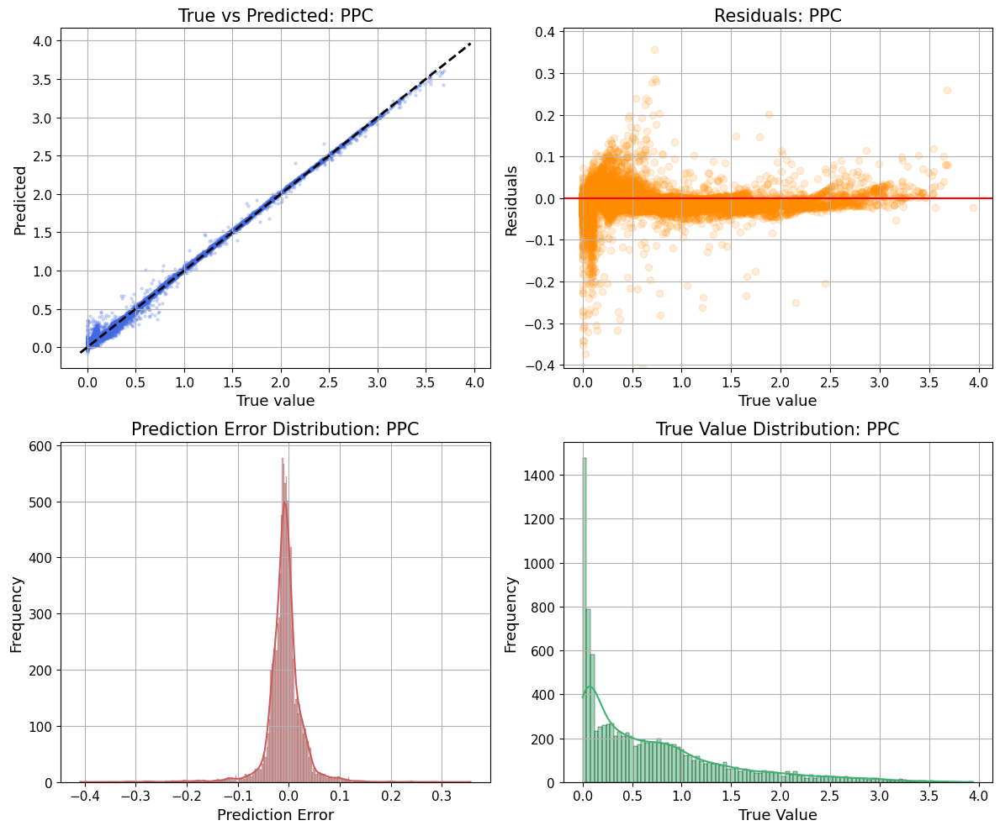

ME2_flux:
------------------------------------------------------------
ME2_flux token index: 616
injected medium slot: False
y_true range: 0.0 to 1.3075933456420898
y_pred range: -0.018788456916809082 to 0.09813785552978516
Metrics computed for: ME2_flux
R2: 0.0740
MAE: 0.014882
RMSE: 0.050793


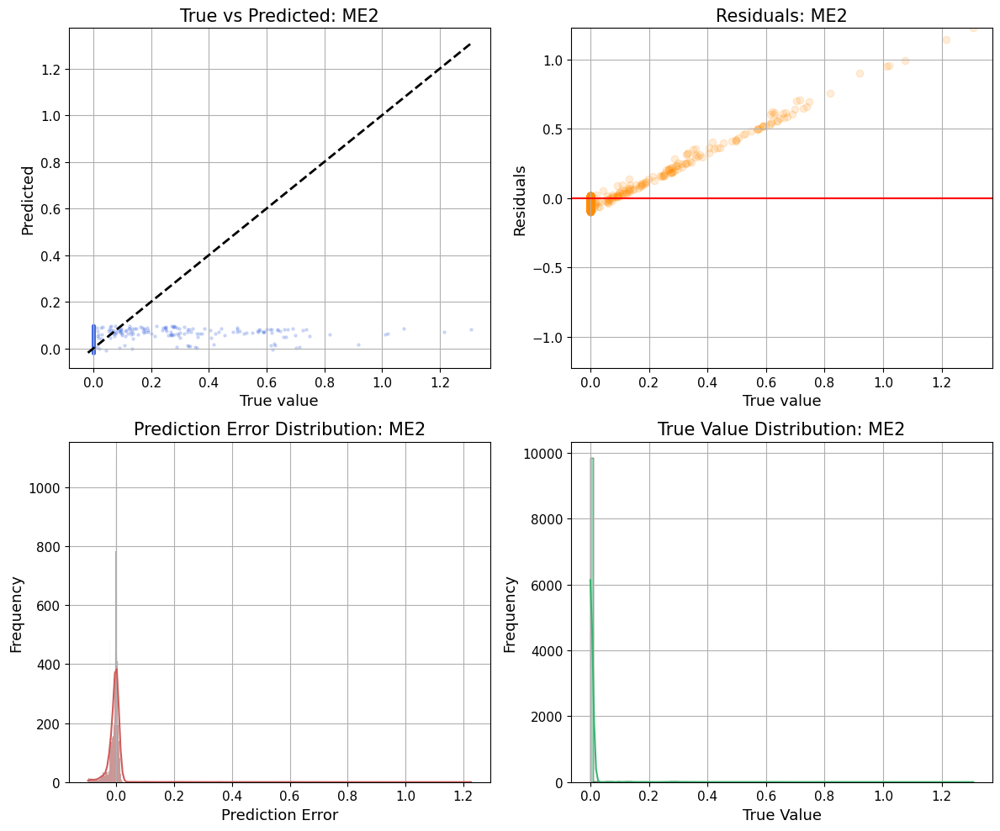

ICL_flux:
------------------------------------------------------------
ICL_flux token index: 277
injected medium slot: False
y_true range: -1.6264433918590504e-13 to 0.41398200392723083
y_pred range: -0.01781831681728363 to 0.12204500287771225
Metrics computed for: ICL_flux
R2: 0.7021
MAE: 0.007251
RMSE: 0.015239


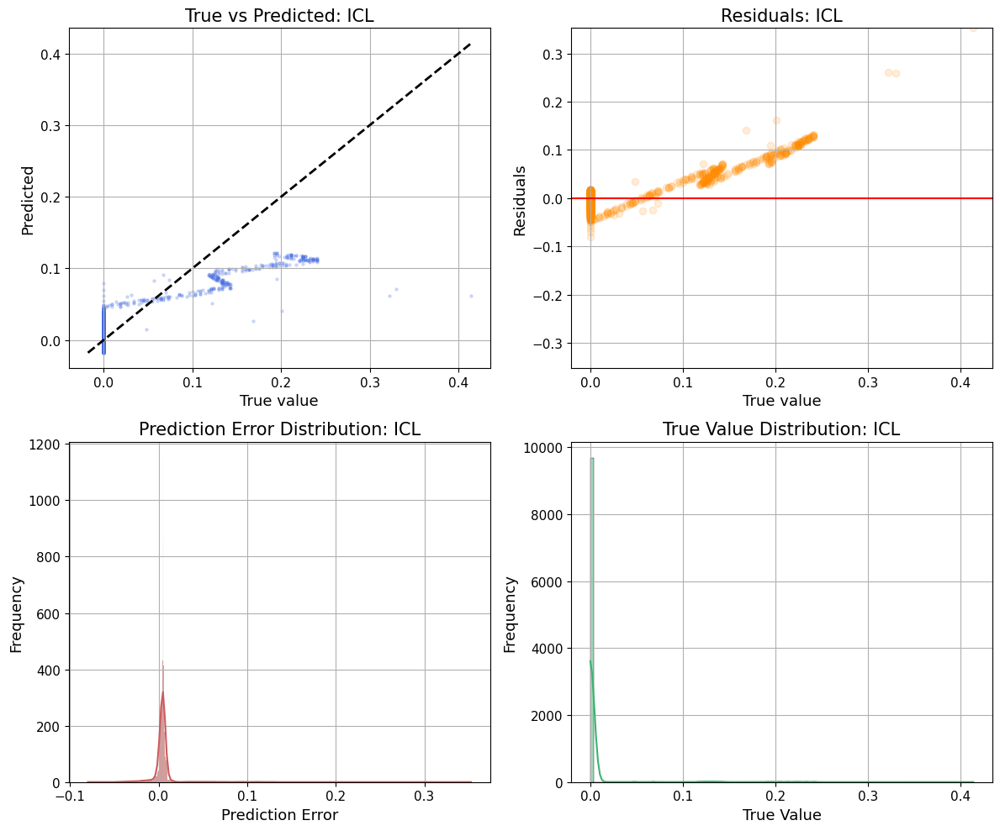

MALS_flux:
------------------------------------------------------------
MALS_flux token index: 448
injected medium slot: False
y_true range: -4.6090159412561643e-14 to 0.4140825867652893
y_pred range: -0.015818912535905838 to 0.018253400921821594
Metrics computed for: MALS_flux
R2: 0.1053
MAE: 0.008252
RMSE: 0.026413


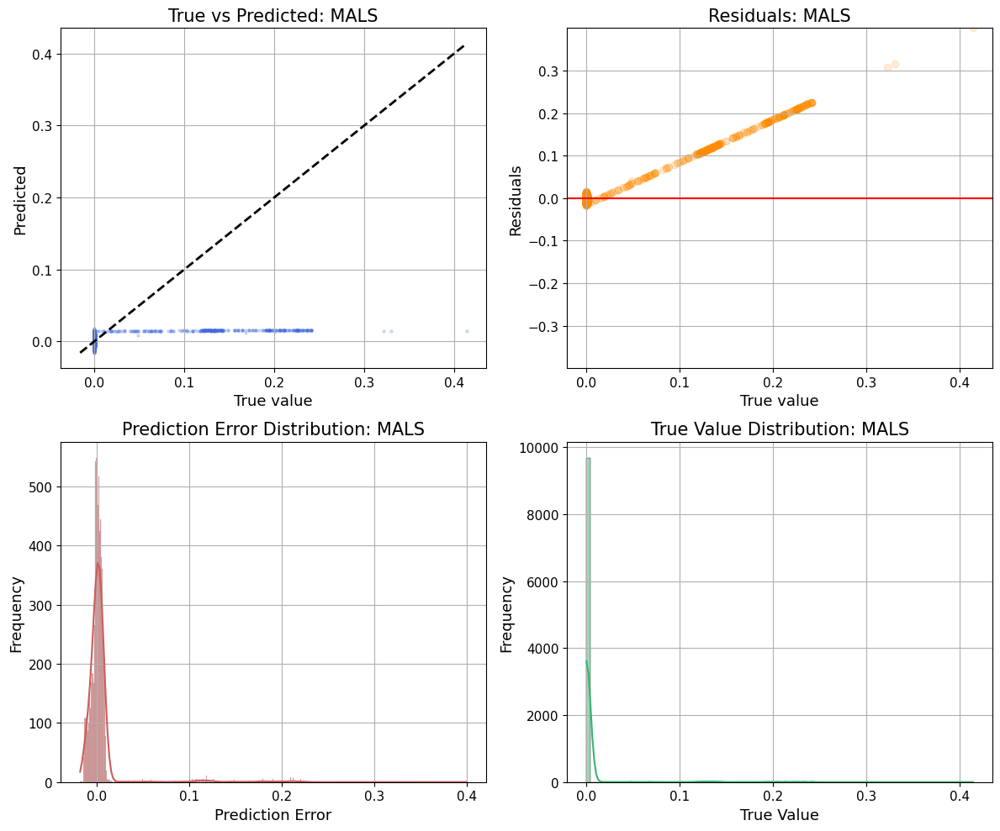

ACKr_flux:
------------------------------------------------------------
ACKr_flux token index: 80
injected medium slot: False
y_true range: -24.682992935180664 to 0.620775043964386
y_pred range: -22.653728485107422 to 0.5631616115570068
Metrics computed for: ACKr_flux
R2: 0.9997
MAE: 0.053190
RMSE: 0.084058


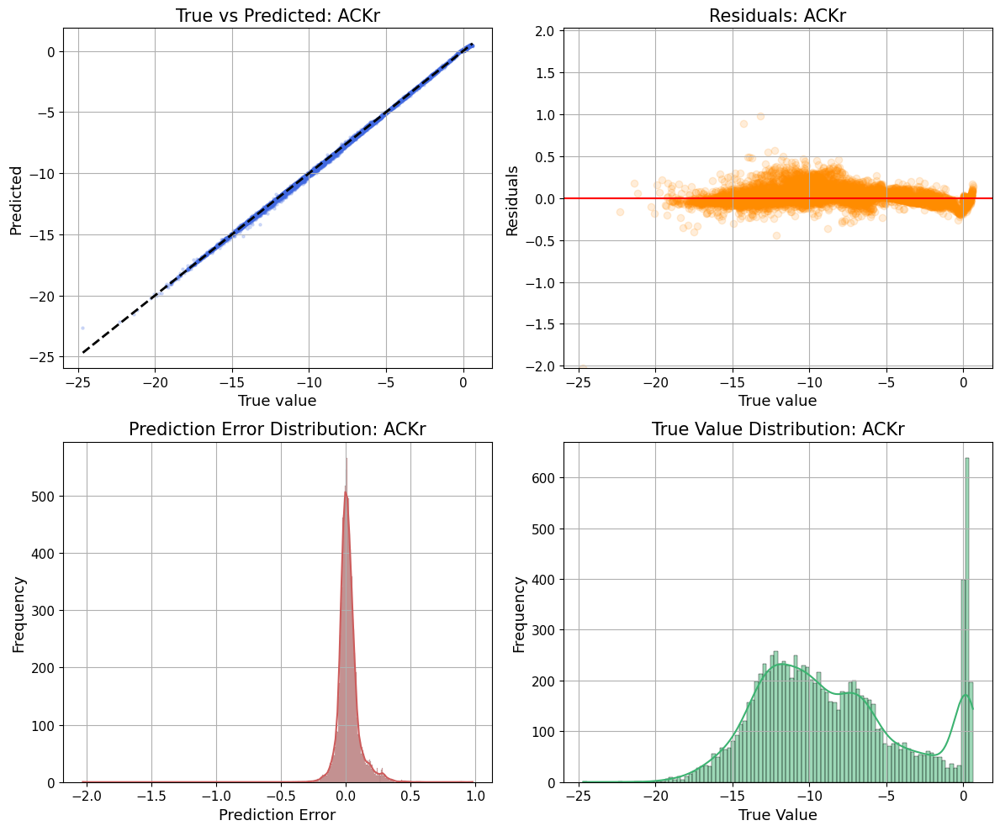

PTAr_flux:
------------------------------------------------------------
PTAr_flux token index: 77
injected medium slot: False
y_true range: -0.620775043964386 to 24.682992935180664
y_pred range: -0.5003383159637451 to 23.04589080810547
Metrics computed for: PTAr_flux
R2: 0.9996
MAE: 0.068615
RMSE: 0.098524


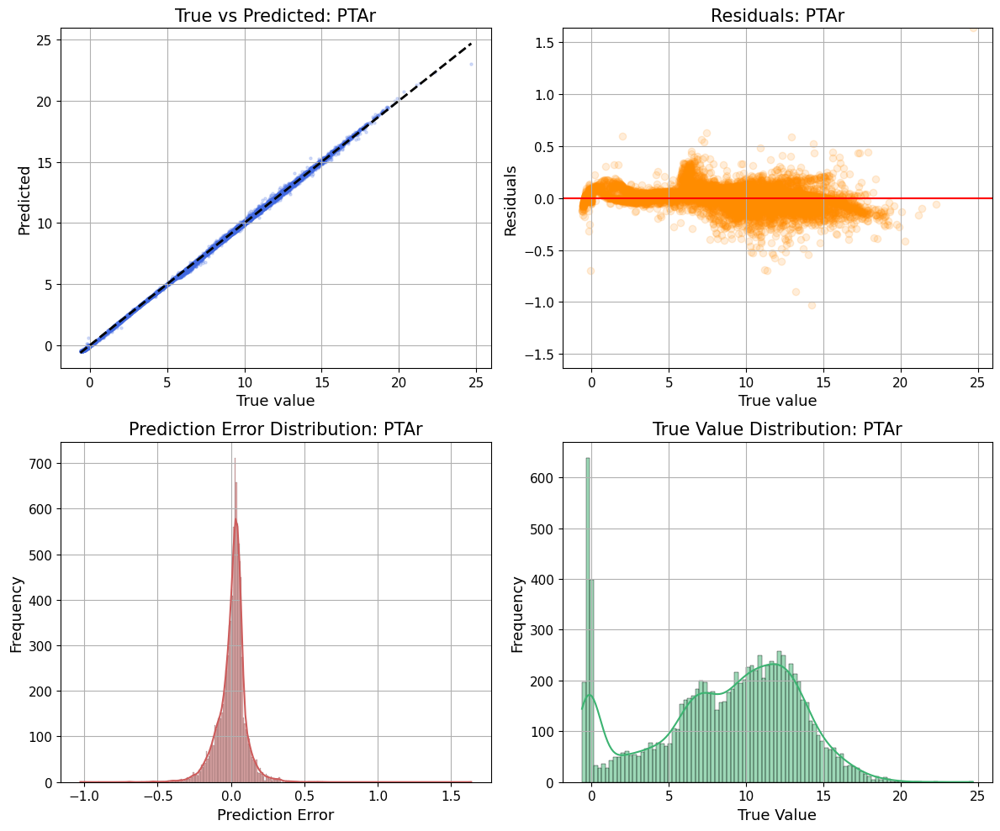

LDH_D_flux:
------------------------------------------------------------
LDH_D_flux token index: 1691
injected medium slot: False
y_true range: -0.32902780175209045 to 2.190000057220459
y_pred range: -0.23005524277687073 to 2.1238279342651367
Metrics computed for: LDH_D_flux
R2: 0.9930
MAE: 0.017204
RMSE: 0.034306


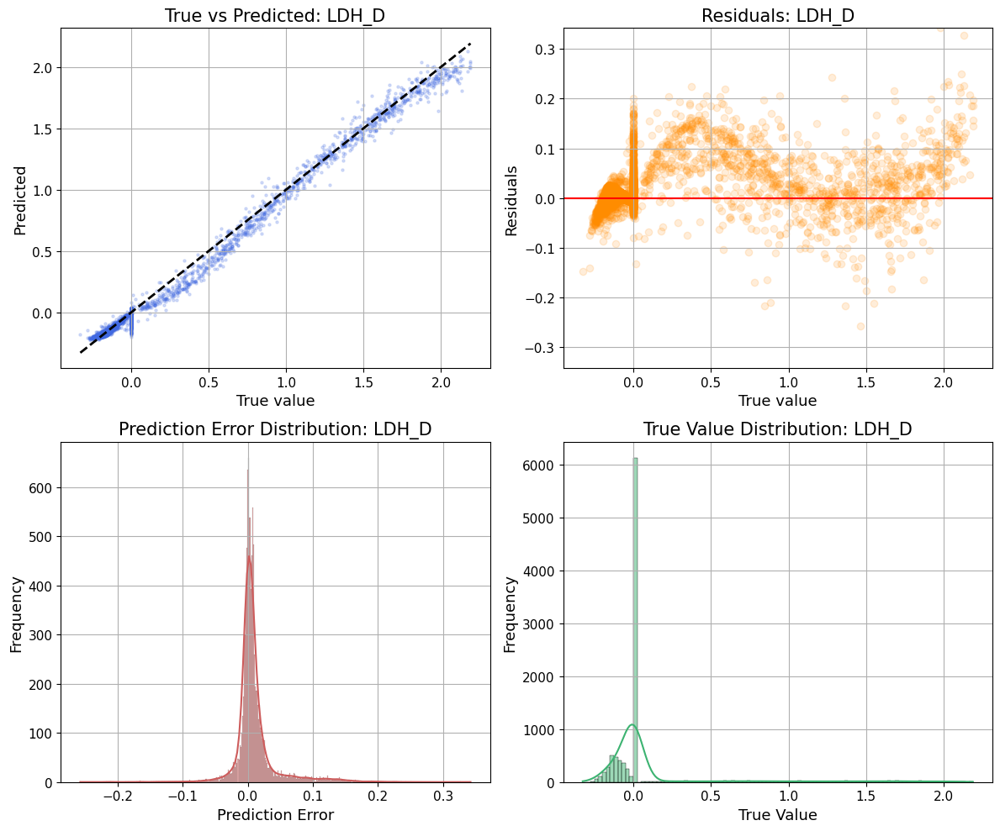

ACALD_flux:
------------------------------------------------------------
ACALD_flux token index: 15
injected medium slot: False
y_true range: -14.448230743408203 to 2.1519103050231934
y_pred range: -14.546188354492188 to 1.963761329650879
Metrics computed for: ACALD_flux
R2: 0.9758
MAE: 0.251242
RMSE: 0.460088


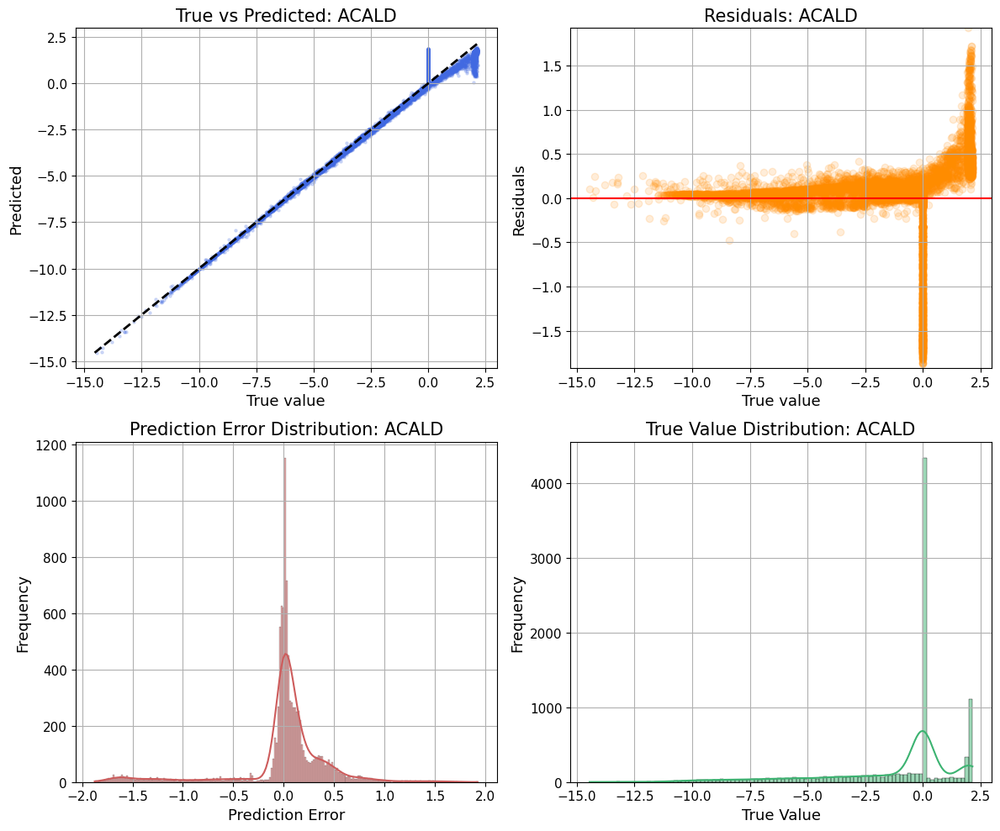

ALCD2x_flux:
------------------------------------------------------------
ALCD2x_flux token index: 170
injected medium slot: False
y_true range: -14.448230743408203 to 0.0
y_pred range: -14.515941619873047 to 0.12144169211387634
Metrics computed for: ALCD2x_flux
R2: 0.9988
MAE: 0.065500
RMSE: 0.093288


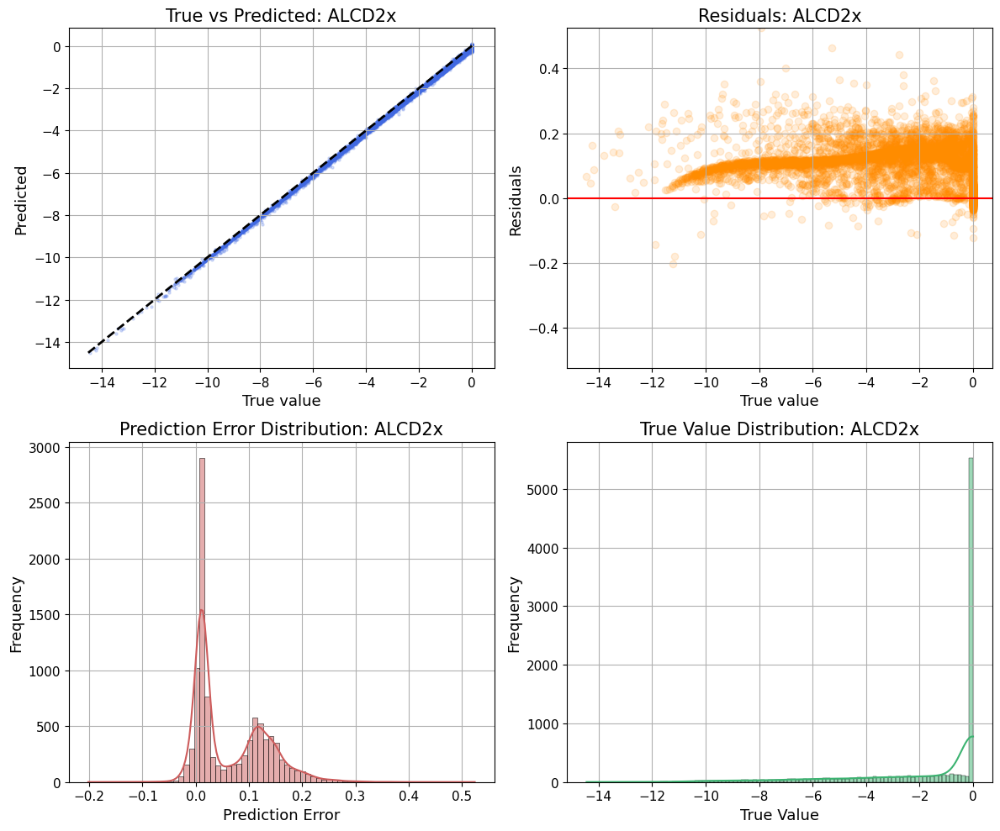

EX_glc__D_e_flux:
------------------------------------------------------------
EX_glc__D_e_flux token index: 180
injected medium slot: True
y_true range: -15.0 to 0.0
y_pred range: -15.213719367980957 to 0.021857142448425293
Metrics computed for: EX_glc__D_e_flux
R2: 0.9998
MAE: 0.058351
RMSE: 0.075429


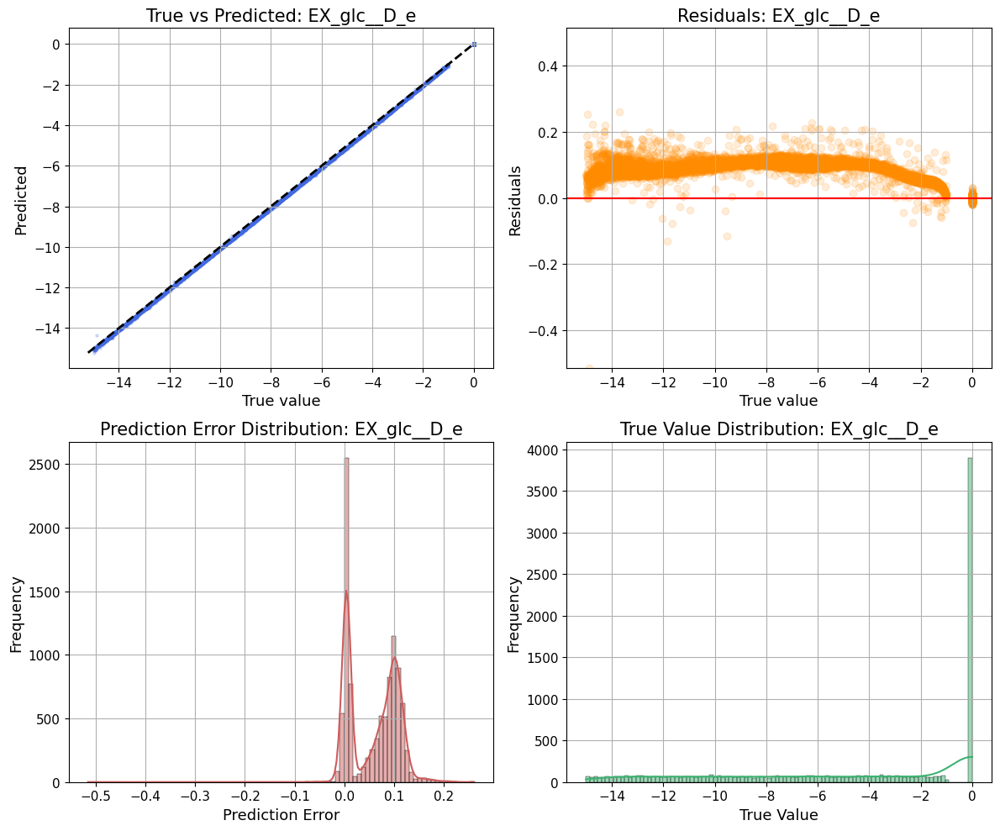

EX_o2_e_flux:
------------------------------------------------------------
EX_o2_e_flux token index: 1981
injected medium slot: True
y_true range: -29.81999969482422 to -1.0
y_pred range: -29.452362060546875 to -0.984220027923584
Metrics computed for: EX_o2_e_flux
R2: 0.9998
MAE: 0.047672
RMSE: 0.068209


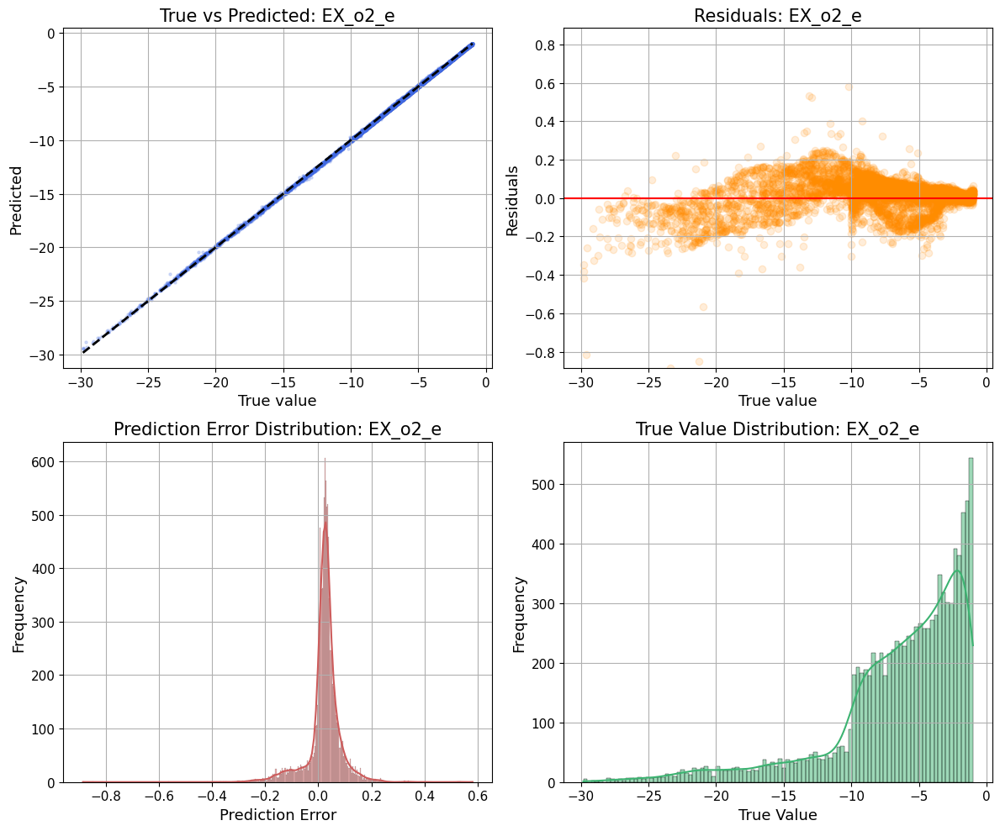

EX_co2_e_flux:
------------------------------------------------------------
EX_co2_e_flux token index: 45
injected medium slot: True
y_true range: 0.0 to 32.617835998535156
y_pred range: -0.04857374727725983 to 32.34986877441406
Metrics computed for: EX_co2_e_flux
R2: 0.9995
MAE: 0.089684
RMSE: 0.138833


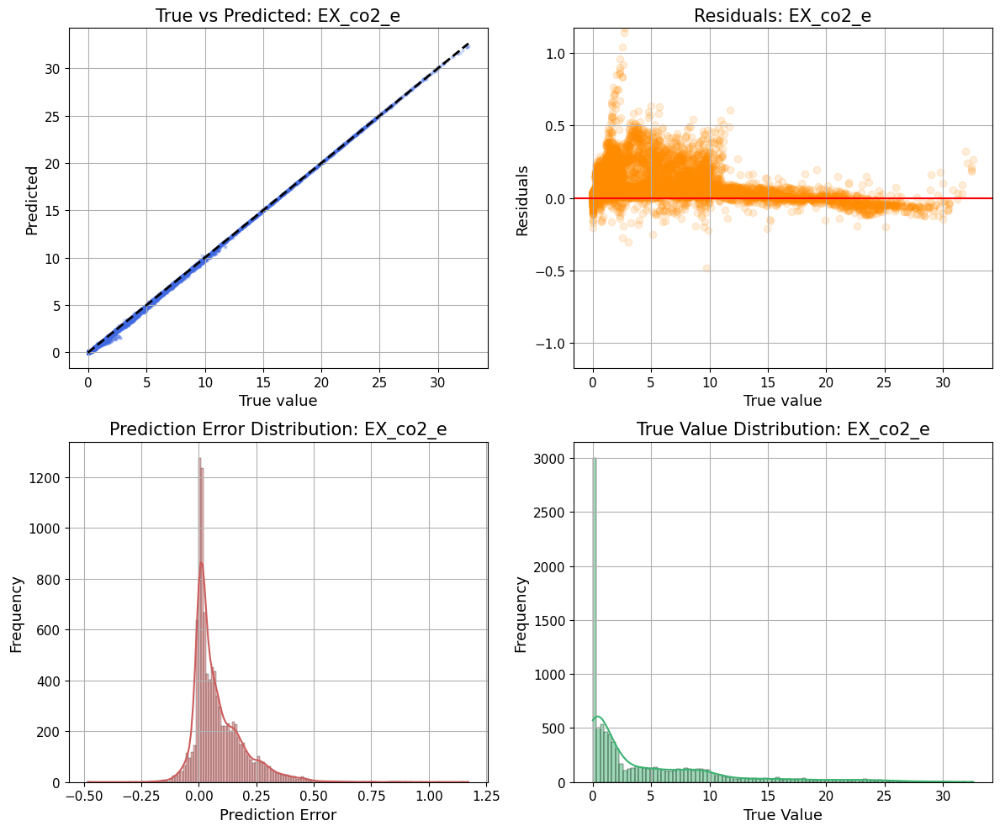

EX_etoh_e_flux:
------------------------------------------------------------
EX_etoh_e_flux token index: 1525
injected medium slot: True
y_true range: 0.0 to 14.448230743408203
y_pred range: -0.07244408130645752 to 14.84853744506836
Metrics computed for: EX_etoh_e_flux
R2: 0.9983
MAE: 0.065587
RMSE: 0.111022


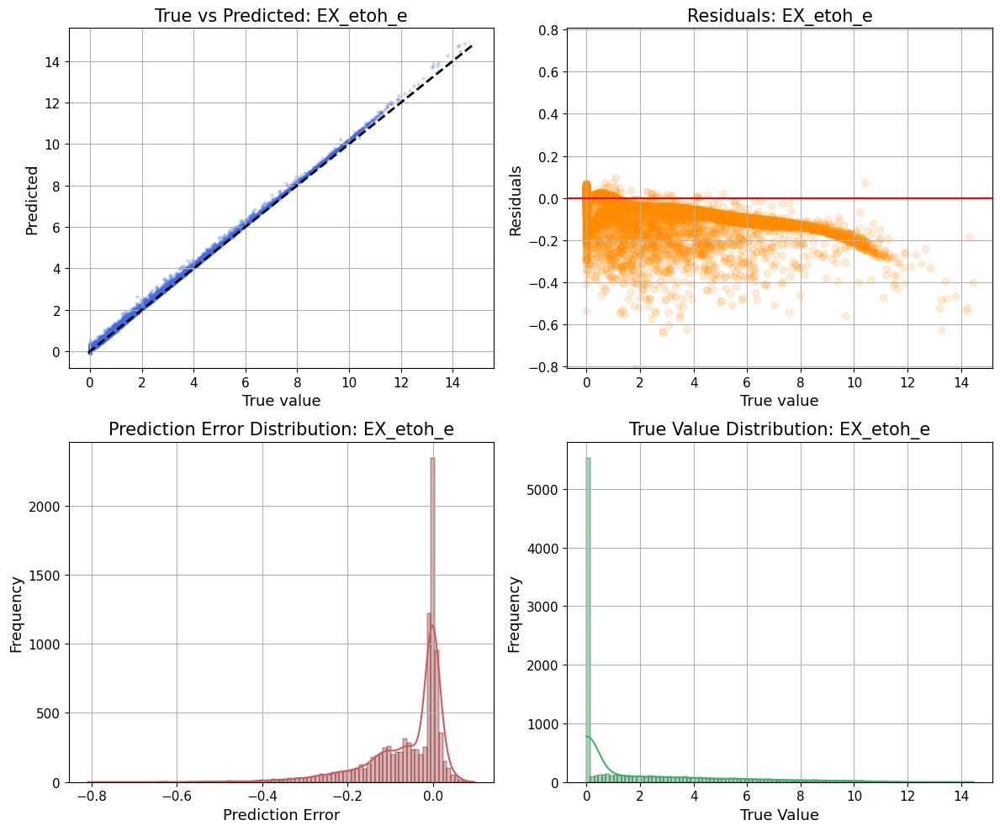

EX_ac_e_flux:
------------------------------------------------------------
EX_ac_e_flux token index: 106
injected medium slot: True
y_true range: 0.0 to 25.407020568847656
y_pred range: -0.18015486001968384 to 23.665359497070312
Metrics computed for: EX_ac_e_flux
R2: 0.9992
MAE: 0.079168
RMSE: 0.132569


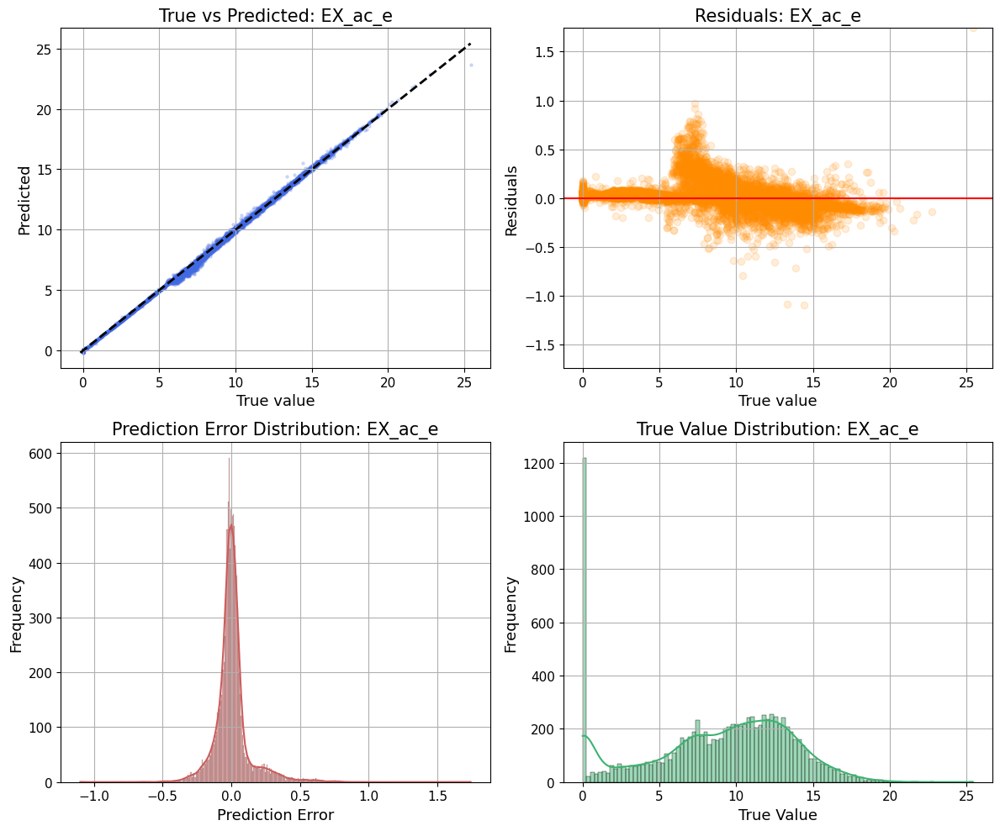

EX_lac__D_e_flux:
------------------------------------------------------------
EX_lac__D_e_flux token index: 347
injected medium slot: True
y_true range: -2.190000057220459 to 0.32902780175209045
y_pred range: -2.16975474357605 to 0.15009599924087524
Metrics computed for: EX_lac__D_e_flux
R2: 0.9925
MAE: 0.020338
RMSE: 0.035642


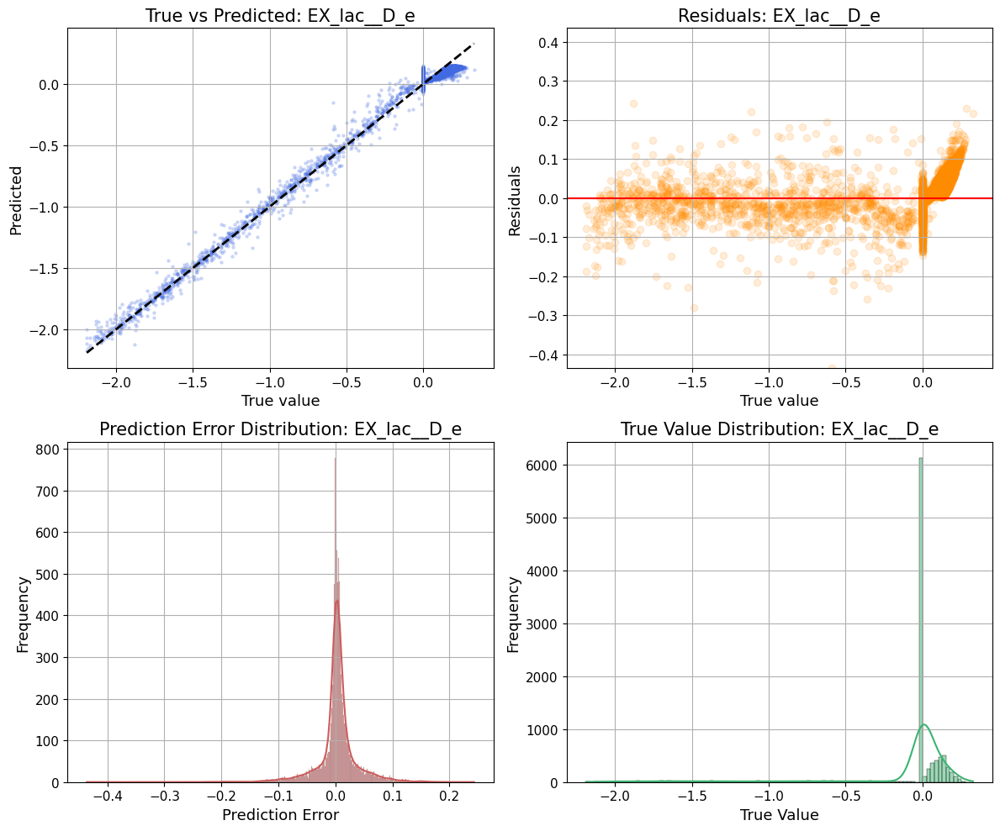

EX_succ_e_flux:
------------------------------------------------------------
EX_succ_e_flux token index: 112
injected medium slot: True
y_true range: -2.1500000953674316 to 0.0
y_pred range: -1.908995509147644 to 0.07379865646362305
Metrics computed for: EX_succ_e_flux
R2: 0.9806
MAE: 0.010223
RMSE: 0.026022


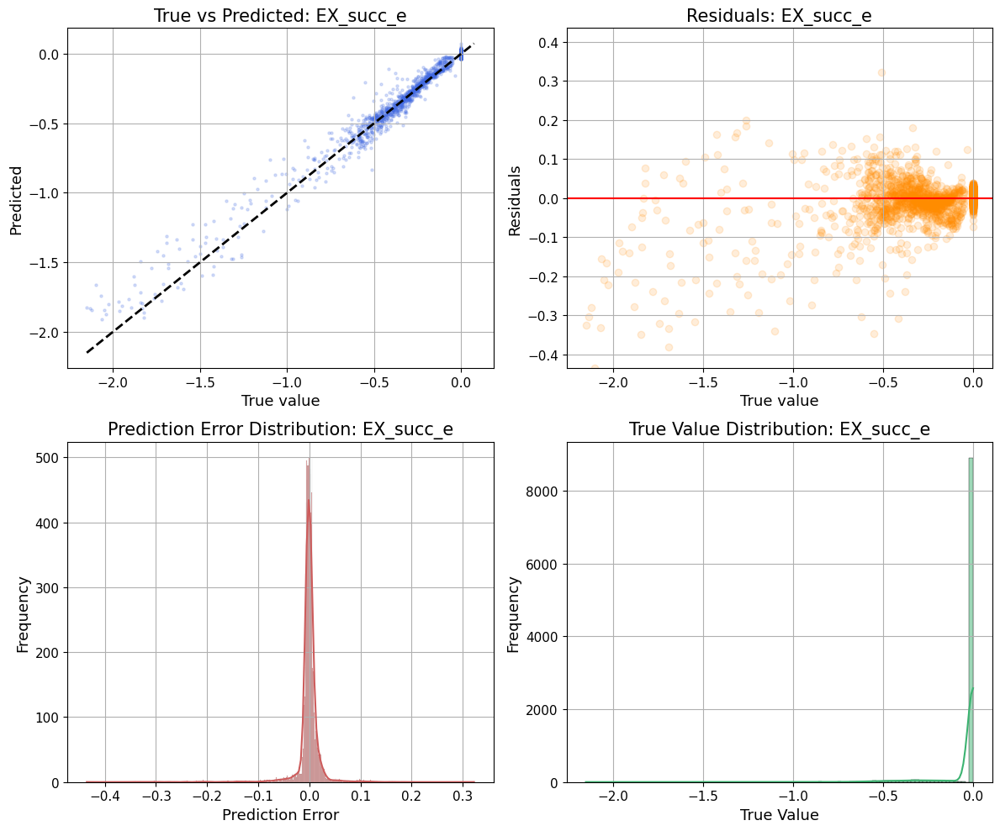

EX_pyr_e_flux:
------------------------------------------------------------
EX_pyr_e_flux token index: 111
injected medium slot: True
y_true range: -2.190000057220459 to 0.0
y_pred range: -2.3655829429626465 to 0.010262519121170044
Metrics computed for: EX_pyr_e_flux
R2: 0.9947
MAE: 0.011758
RMSE: 0.029144


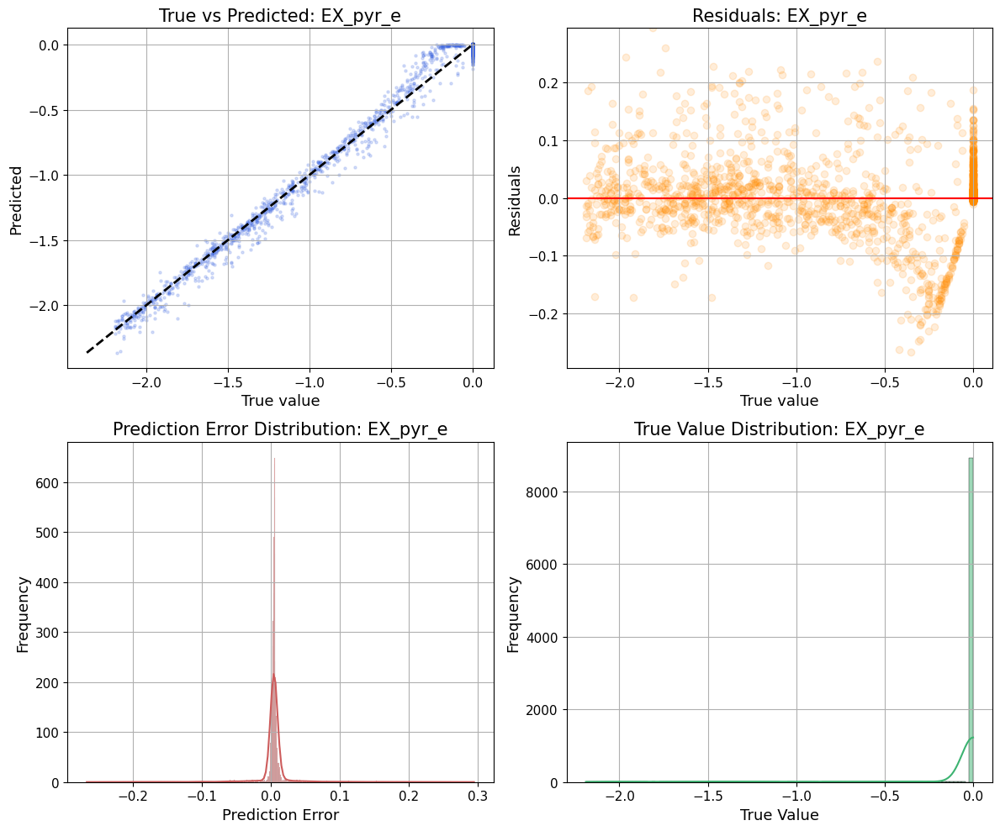

EX_for_e_flux:
------------------------------------------------------------
EX_for_e_flux token index: 216
injected medium slot: False
y_true range: 0.0 to 33.579124450683594
y_pred range: -0.2780780792236328 to 33.96295928955078
Metrics computed for: EX_for_e_flux
R2: 0.9993
MAE: 0.149828
RMSE: 0.205543


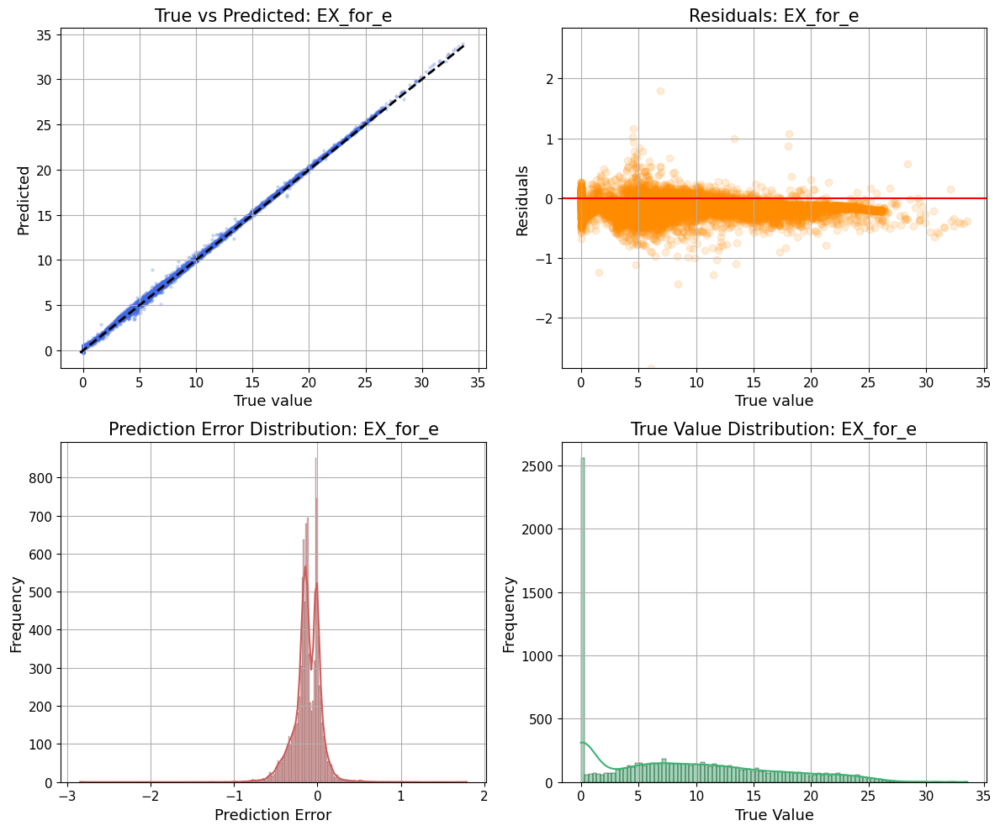

In [17]:
if "diagnostic_metric_rows" not in globals():
    diagnostic_metric_rows = []

# Diagnostic plots for MINN/reference fluxes.
# False: plot only the 5 MINN reservoir-context fluxes.
# True: plot all 46 non-biomass reference fluxes.
PLOT_ALL_46_FLUX_DIAGNOSTICS = True

target_fluxes_5 = [
    'EX_glc__D_e_flux',
    'EX_o2_e_flux',
    'EX_co2_e_flux',
    'EX_etoh_e_flux',
    'EX_ac_e_flux',
]

target_fluxes_46 = [
    'GLCptspp_flux', 'PGI_flux', 'PFK_flux', 'FBA_flux', 'TPI_flux',
    'PGK_flux', 'GAPD_flux', 'ENO_flux', 'PGM_flux', 'PYK_flux',
    'PDH_flux', 'G6PDH2r_flux', 'PGL_flux', 'GND_flux', 'RPE_flux',
    'RPI_flux', 'TKT1_flux', 'TALA_flux', 'TKT2_flux', 'CS_flux',
    'ACONTb_flux', 'ACONTa_flux', 'ICDHyr_flux', 'SUCOAS_flux', 'AKGDH_flux',
    'SUCDi_flux', 'FUM_flux', 'MDH_flux', 'PPC_flux', 'ME2_flux',
    'ICL_flux', 'MALS_flux', 'ACKr_flux', 'PTAr_flux', 'LDH_D_flux',
    'ACALD_flux', 'ALCD2x_flux', 'EX_glc__D_e_flux', 'EX_o2_e_flux',
    'EX_co2_e_flux', 'EX_etoh_e_flux', 'EX_ac_e_flux', 'EX_lac__D_e_flux',
    'EX_succ_e_flux', 'EX_pyr_e_flux', 'EX_for_e_flux',
]

diagnostics_to_plot = target_fluxes_46 if PLOT_ALL_46_FLUX_DIAGNOSTICS else target_fluxes_5
missing_diagnostic_fluxes = [flux_name for flux_name in diagnostics_to_plot if flux_name not in outputs]
if missing_diagnostic_fluxes:
    raise ValueError('Missing diagnostic flux tokens in outputs: ' + ', '.join(missing_diagnostic_fluxes))

print(f"Plotting {len(diagnostics_to_plot)} diagnostic fluxes")
for flux_name in diagnostics_to_plot:
    print(f'{flux_name}:')
    print(60 * '-')
    diagnostic_metric_rows.append(plot_flux(model, X_test, y_test, outputs, flux_name, save_path=None))


In [18]:
# Diagnostic plot metric summary
if "diagnostic_metric_rows" not in globals() or not diagnostic_metric_rows:
    print("Run the diagnostic plotting cells first.")
else:
    diagnostic_metrics_df = pd.DataFrame(diagnostic_metric_rows)
    diagnostic_metrics_df = diagnostic_metrics_df[["flux", "R2", "MAE", "RMSE"]]
    display(
        diagnostic_metrics_df.style.format(
            {"R2": "{:.4f}", "MAE": "{:.6f}", "RMSE": "{:.6f}"}
        )
    )


,flux,R2,MAE,RMSE
0,BIOMASS_Ec_iML1515_core_75p37M_flux,0.9953,0.010146,0.014231
1,GLCptspp_flux,0.9979,0.070155,0.225444
2,PGI_flux,0.9983,0.129454,0.176110
3,PFK_flux,0.9970,0.060000,0.097501
4,FBA_flux,0.9971,0.058295,0.096091
5,TPI_flux,0.9994,0.071767,0.086885
6,PGK_flux,0.9998,0.094891,0.110027
7,GAPD_flux,0.9996,0.122394,0.147862
8,ENO_flux,0.9998,0.091583,0.113387
9,PGM_flux,0.9998,0.079166,0.098214


In [19]:
# Overall model metrics across all output fluxes (flattened)
def _compute_overall_metrics(model_ref, X_ref, y_ref, outputs_ref, device_ref, batch_size_ref):
    model_eval = model_ref.to(device_ref).eval()
    V = len(outputs_ref)

    if X_ref.shape[1] != V or y_ref.shape[1] != V:
        raise ValueError(
            f"Expected X_test/y_test second dim == len(outputs)={V}, got {X_ref.shape[1]} and {y_ref.shape[1]}"
        )

    pred_batches = []
    true_batches = []
    perm = None
    use_amp = device_ref.type == "cuda"

    with torch.inference_mode():
        for i in range(0, X_ref.shape[0], batch_size_ref):
            xb = X_ref[i:i + batch_size_ref].to(device_ref)
            yb_true = y_ref[i:i + batch_size_ref]

            if use_amp:
                with torch.autocast(device_type="cuda", dtype=torch.float16):
                    preds_all_layers, selected_indices = model_eval(xb.unsqueeze(-1), output_subset=None)
            else:
                preds_all_layers, selected_indices = model_eval(xb.unsqueeze(-1), output_subset=None)

            preds_last = preds_all_layers[:, :, -1]  # (B, S)

            if perm is None:
                selected_indices_np = selected_indices.detach().cpu().numpy()
                if selected_indices_np.ndim > 1:
                    selected_indices_np = selected_indices_np[0]
                selected_indices_np = selected_indices_np.astype(int)

                if selected_indices_np.size != V:
                    raise RuntimeError(f"Model returned {selected_indices_np.size} outputs, expected {V}.")

                inv = np.full(V, -1, dtype=np.int64)
                inv[selected_indices_np] = np.arange(selected_indices_np.size, dtype=np.int64)
                if (inv < 0).any():
                    missing = np.where(inv < 0)[0].tolist()
                    raise RuntimeError(f"Missing output indices in model forward pass: {missing[:10]}")
                perm = torch.as_tensor(inv, device=preds_last.device, dtype=torch.long)

            yb_pred = preds_last.index_select(1, perm).detach().cpu().numpy().astype(np.float32, copy=False)
            pred_batches.append(yb_pred)
            true_batches.append(yb_true.detach().cpu().numpy().astype(np.float32, copy=False))

            del xb, preds_all_layers, preds_last, selected_indices
            if device_ref.type == "cuda":
                torch.cuda.empty_cache()

    y_pred_full = np.concatenate(pred_batches, axis=0)
    y_true_full = np.concatenate(true_batches, axis=0)

    overall_r2 = r2_score(y_true_full.ravel(), y_pred_full.ravel())
    overall_mae = mean_absolute_error(y_true_full.ravel(), y_pred_full.ravel())
    overall_rmse = root_mean_squared_error(y_true_full.ravel(), y_pred_full.ravel())
    return overall_r2, overall_mae, overall_rmse

original_device = next(model.parameters()).device
preferred_device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

if preferred_device.type == "cuda":
    batch_size_metrics = 2
else:
    batch_size_metrics = 32

used_device = preferred_device
try:
    overall_r2, overall_mae, overall_rmse = _compute_overall_metrics(
        model, X_test, y_test, outputs, preferred_device, batch_size_metrics
    )
except RuntimeError as e:
    if preferred_device.type == "cuda" and "out of memory" in str(e).lower():
        print("CUDA OOM during overall metrics; falling back to CPU...")
        torch.cuda.empty_cache()
        used_device = torch.device("cpu")
        overall_r2, overall_mae, overall_rmse = _compute_overall_metrics(
            model, X_test, y_test, outputs, used_device, 32
        )
    else:
        raise
finally:
    model.to(original_device)

print("Overall model metrics (all fluxes, flattened):")
print(f"Device used: {used_device}")
print(f"R2:   {overall_r2:.4f}")
print(f"MAE:  {overall_mae:.6f}")
print(f"RMSE: {overall_rmse:.6f}")

Overall model metrics (all fluxes, flattened):
Device used: cuda
R2:   0.9996
MAE:  0.006382
RMSE: 0.028730


### t-SNE Plots


In [20]:
glycolysis_reactions = [
    "GLCptspp", "GLCt2pp", "HEX1", "PGI", "PFK", "FBA", "TPI",
    "GAPD", "PGK", "PGM", "ENO", "PYK", "PPS", "FBP",
]

ppp_reactions = [
    "G6PDH2r", "PGL", "GND", "RPI", "RPE", "TKT1", "TALA", "TKT2",
]

tca_reactions = [
    "CS", "ACONTa", "ACONTb", "ICDHyr", "AKGDH", "SUCOAS", "SUCDi", "FUM", "MDH",
]

anaplerotic_reactions = [
    "PPC", "PPCK", "ME1", "ME2", "ICL", "MALS",
]

fermentation_reactions = [
    "PFL", "LDH_D", "ACALD", "ALCD2x", "PTAr", "ACKr", "POX",
]

oxphos_reactions = [
    "NADH16pp", "NADH17pp", "NADH18pp", "CYTBO3_4pp", "CYTBDpp", "CYTBD2pp", "ATPS4rpp",
]

nitrogen_reactions = [
    "GLNS", "GLUDy", "GLUN", "GLUSy", "ASPTA", "ALATA_L",
]

pathway_reaction_lists = {
    "glycolysis_reactions": glycolysis_reactions,
    "ppp_reactions": ppp_reactions,
    "tca_reactions": tca_reactions,
    "anaplerotic_reactions": anaplerotic_reactions,
    "fermentation_reactions": fermentation_reactions,
    "oxphos_reactions": oxphos_reactions,
    "nitrogen_reactions": nitrogen_reactions,
}

def _reaction_token_name(reaction_id, token_names):
    reaction_id = str(reaction_id)
    base_id = reaction_id[:-5] if reaction_id.endswith("_flux") else reaction_id
    candidates = (reaction_id, f"{base_id}_flux", base_id)
    token_set = set(token_names)
    for candidate in candidates:
        if candidate in token_set:
            return candidate
    return None

missing_by_pathway = {
    name: [rxn_id for rxn_id in rxn_ids if _reaction_token_name(rxn_id, outputs) is None]
    for name, rxn_ids in pathway_reaction_lists.items()
}
missing_by_pathway = {name: missing for name, missing in missing_by_pathway.items() if missing}
if missing_by_pathway:
    raise ValueError(f"Missing pathway reaction IDs from checkpoint outputs: {missing_by_pathway}")

for name, rxn_ids in pathway_reaction_lists.items():
    print(f"{name} = {rxn_ids!r}")


glycolysis_reactions = ['GLCptspp', 'GLCt2pp', 'HEX1', 'PGI', 'PFK', 'FBA', 'TPI', 'GAPD', 'PGK', 'PGM', 'ENO', 'PYK', 'PPS', 'FBP']
ppp_reactions = ['G6PDH2r', 'PGL', 'GND', 'RPI', 'RPE', 'TKT1', 'TALA', 'TKT2']
tca_reactions = ['CS', 'ACONTa', 'ACONTb', 'ICDHyr', 'AKGDH', 'SUCOAS', 'SUCDi', 'FUM', 'MDH']
anaplerotic_reactions = ['PPC', 'PPCK', 'ME1', 'ME2', 'ICL', 'MALS']
fermentation_reactions = ['PFL', 'LDH_D', 'ACALD', 'ALCD2x', 'PTAr', 'ACKr', 'POX']
oxphos_reactions = ['NADH16pp', 'NADH17pp', 'NADH18pp', 'CYTBO3_4pp', 'CYTBDpp', 'CYTBD2pp', 'ATPS4rpp']
nitrogen_reactions = ['GLNS', 'GLUDy', 'GLUN', 'GLUSy', 'ASPTA', 'ALATA_L']


In [21]:
def plot_reaction_subset_tsne(
    model,
    token_names,
    X_context,
    reaction_subset,
    *,
    subset_name=None,
    n_samples=8000,
    perplexity=40.0,
    batch_size=128,
    random_state=10,
    annotate=True,
    annotate_fontsize=15,
    save_path=None,
    print_colors=True,
    sample_color_mode="reaction",  # "reaction", "gray", "rainbow", "viridis", "plasma", or "coolwarm"
    show_pre_embeddings=False,
    return_data=False,
):
    """
    Plot post-layer FluxTransformer token embeddings for a selected reaction subset.

    reaction_subset can be either:
      - a key from pathway_reaction_lists, such as "glycolysis_reactions"
      - a list of reaction IDs, such as glycolysis_reactions
      - a list of flux token names ending in "_flux"

    Each reaction in the subset receives its own color before embeddings are collected.
    With sample_color_mode="gray", all subset-reaction points are plotted in gray.
    With sample_color_mode="rainbow" or another colormap, points are colored by
    nutrient-context similarity while reaction colors are kept only for centers.
    If show_pre_embeddings=True, initial token embeddings are included in the
    same t-SNE fit and plotted as black dots.
    """
    device = next(model.parameters()).device
    model.eval()

    V = int(model.vocab_size)
    if len(token_names) != V:
        raise ValueError(f"len(token_names)={len(token_names)} but model.vocab_size={V}.")

    if isinstance(reaction_subset, str):
        if reaction_subset in pathway_reaction_lists:
            reaction_ids = list(pathway_reaction_lists[reaction_subset])
            subset_label = subset_name or reaction_subset
        else:
            reaction_ids = [reaction_subset]
            subset_label = subset_name or reaction_subset
    else:
        reaction_ids = list(reaction_subset)
        subset_label = subset_name or "reaction subset"

    reaction_ids = list(dict.fromkeys(str(r) for r in reaction_ids))
    if not reaction_ids:
        raise ValueError("reaction_subset is empty.")

    token_lookup = {name: idx for idx, name in enumerate(token_names)}
    selected_token_names = []
    display_reaction_ids = []
    missing = []
    for reaction_id in reaction_ids:
        base_id = reaction_id[:-5] if reaction_id.endswith("_flux") else reaction_id
        candidates = (reaction_id, f"{base_id}_flux", base_id)
        token_name = next((candidate for candidate in candidates if candidate in token_lookup), None)
        if token_name is None:
            missing.append(reaction_id)
            continue
        selected_token_names.append(token_name)
        display_reaction_ids.append(token_name[:-5] if token_name.endswith("_flux") else token_name)

    if missing:
        raise ValueError(f"These reactions are not present in token_names: {missing}")

    token_indices = [token_lookup[name] for name in selected_token_names]
    n_tok = len(token_indices)
    colors = plt.cm.nipy_spectral(np.linspace(0.05, 0.95, n_tok))
    from matplotlib.colors import to_hex

    reaction_colors = {
        reaction_id: color
        for reaction_id, color in zip(display_reaction_ids, colors)
    }
    reaction_color_hex = {
        reaction_id: to_hex(color)
        for reaction_id, color in reaction_colors.items()
    }

    mode = str(sample_color_mode).strip().lower()
    allowed_modes = {"reaction", "gray", "rainbow", "viridis", "plasma", "coolwarm"}
    if mode not in allowed_modes:
        raise ValueError("sample_color_mode must be one of: reaction, gray, rainbow, viridis, plasma, coolwarm.")
    use_gray = mode == "gray"
    use_sample_colormap = mode in {"rainbow", "viridis", "plasma", "coolwarm"}

    if print_colors and mode == "reaction":
        print("Reaction colors:")
        for reaction_id in display_reaction_ids:
            print(f"  {reaction_id}: {reaction_color_hex[reaction_id]}")

    if not torch.is_tensor(X_context):
        X_context = torch.tensor(X_context, dtype=torch.float32)
    if X_context.dim() != 2 or X_context.size(1) != V:
        raise ValueError(f"X_context must have shape (N, {V}). Got {tuple(X_context.shape)}")

    N = min(int(n_samples), int(X_context.size(0)))
    if N <= 0:
        raise ValueError("n_samples selects zero contexts.")

    X_norm_cond = None
    if use_sample_colormap:
        X_cond = X_context[:N]
        if torch.is_tensor(X_cond):
            X_cond = X_cond.detach().cpu().numpy()
        else:
            X_cond = np.asarray(X_cond, dtype=np.float32)

        if hasattr(model, "input_token_indices") and model.input_token_indices is not None:
            cond_idx = model.input_token_indices.detach().cpu().numpy().astype(np.int64)
            cond_idx = cond_idx[(cond_idx >= 0) & (cond_idx < X_cond.shape[1])]
            if cond_idx.size > 0:
                X_cond = X_cond[:, cond_idx]

        X_cond = X_cond.astype(np.float64, copy=False)
        mu = np.nanmean(X_cond, axis=0, keepdims=True)
        sigma = np.nanstd(X_cond, axis=0, keepdims=True)
        sigma[sigma < 1e-12] = 1.0
        X_norm_cond = (X_cond - mu) / sigma
        X_norm_cond = np.nan_to_num(X_norm_cond, nan=0.0, posinf=0.0, neginf=0.0)

    token_indices_tensor = torch.tensor(token_indices, dtype=torch.long, device=device)
    pos_in_selected = None
    all_embeddings = []
    token_id_labels = []
    sample_id_labels = []

    with torch.no_grad():
        for start in range(0, N, batch_size):
            stop = min(start + batch_size, N)
            batch_context = X_context[start:stop].to(device).unsqueeze(-1)
            x, selected_indices = model(
                batch_context,
                output_subset=token_indices_tensor,
                return_embedding=True,
            )

            if pos_in_selected is None:
                selected_list = [int(v) for v in selected_indices.detach().cpu().tolist()]
                pos_by_token = {token_idx: pos for pos, token_idx in enumerate(selected_list)}
                missing_selected = [idx for idx in token_indices if idx not in pos_by_token]
                if missing_selected:
                    missing_names = [token_names[idx] for idx in missing_selected]
                    raise RuntimeError(f"Requested tokens were not returned by the model: {missing_names}")
                pos_in_selected = torch.tensor(
                    [pos_by_token[idx] for idx in token_indices],
                    dtype=torch.long,
                    device=device,
                )

            keep_x = x.index_select(1, pos_in_selected)
            batch_size_actual = stop - start
            all_embeddings.append(keep_x.detach().cpu())
            token_id_labels.append(np.tile(np.arange(n_tok, dtype=np.int64), batch_size_actual))
            sample_id_labels.append(np.repeat(np.arange(start, stop, dtype=np.int64), n_tok))

    all_embeddings = torch.cat(all_embeddings, dim=0)
    token_id_labels = np.concatenate(token_id_labels, axis=0)
    sample_id_labels = np.concatenate(sample_id_labels, axis=0)
    embeddings_flat = all_embeddings.reshape(-1, all_embeddings.shape[-1]).numpy()
    n_points = embeddings_flat.shape[0]
    if n_points < 3:
        raise ValueError(f"Need at least 3 embedding points for t-SNE, got {n_points}.")

    pre_embeddings = None
    embeddings_for_tsne = embeddings_flat
    if show_pre_embeddings:
        if not hasattr(model, "input_embedding"):
            raise AttributeError("show_pre_embeddings=True requires model.input_embedding.")
        with torch.no_grad():
            pre_embeddings = model.input_embedding(token_indices_tensor).detach().cpu().numpy()
        embeddings_for_tsne = np.concatenate([embeddings_flat, pre_embeddings], axis=0)

    n_points_joint = embeddings_for_tsne.shape[0]
    if perplexity >= n_points_joint:
        new_perplexity = max(1.0, min(30.0, (n_points_joint - 1) / 3.0))
        print(f"[plot_reaction_subset_tsne] Adjusting perplexity {perplexity} -> {new_perplexity:.2f} (n_points={n_points_joint})")
        perplexity = float(new_perplexity)

    emb2d_joint = TSNE(
        n_components=2,
        perplexity=perplexity,
        random_state=random_state,
        init="pca",
    ).fit_transform(embeddings_for_tsne)
    emb2d = emb2d_joint[:n_points]
    pre_emb2d = emb2d_joint[n_points:] if show_pre_embeddings else None

    base_s = 10.0
    base_alpha = 0.22
    center_s = 36.0
    if n_tok <= 20:
        base_s = 30.0
        base_alpha = 0.38
        center_s = 72.0
    if n_tok <= 10:
        base_s = 36.0
        base_alpha = 0.48
        center_s = 86.0

    rainbow_order = np.arange(N, dtype=np.int64)
    if use_sample_colormap and X_norm_cond is not None and N > 1:
        start_idx = int(np.argmin(np.sum((X_norm_cond - X_norm_cond.mean(axis=0, keepdims=True)) ** 2, axis=1)))
        order = np.empty(N, dtype=np.int64)
        unvisited = np.ones(N, dtype=bool)
        current = start_idx
        for order_pos in range(N):
            order[order_pos] = current
            unvisited[current] = False
            if order_pos == N - 1:
                break
            remaining = np.flatnonzero(unvisited)
            distances = np.sum((X_norm_cond[remaining] - X_norm_cond[current]) ** 2, axis=1)
            current = int(remaining[np.argmin(distances)])
        rainbow_order = order

    discrete_cmap = ListedColormap(colors)
    plt.figure(figsize=(16, 12))
    if use_gray:
        plt.scatter(
            emb2d[:, 0],
            emb2d[:, 1],
            c="#b5b5b5",
            alpha=base_alpha,
            s=base_s,
            edgecolors="none",
        )
    elif use_sample_colormap:
        if N > 1:
            sample_rank = np.empty(N, dtype=np.int64)
            sample_rank[rainbow_order] = np.arange(N, dtype=np.int64)
            sample_norm = sample_rank[sample_id_labels].astype(np.float64) / float(N - 1)
        else:
            sample_norm = np.zeros_like(sample_id_labels, dtype=np.float64)
        cmap = plt.cm.rainbow_r if mode == "rainbow" else plt.get_cmap(mode)
        point_colors = cmap(sample_norm)
        plt.scatter(
            emb2d[:, 0],
            emb2d[:, 1],
            c=point_colors,
            alpha=max(base_alpha, 0.70),
            s=base_s,
            edgecolors="none",
        )
    else:
        plt.scatter(
            emb2d[:, 0],
            emb2d[:, 1],
            c=token_id_labels,
            cmap=discrete_cmap,
            vmin=0,
            vmax=max(1, n_tok - 1),
            alpha=base_alpha,
            s=base_s,
            edgecolors="none",
        )

    centers = []
    for local_idx in range(n_tok):
        mask = token_id_labels == local_idx
        if np.any(mask):
            centers.append((local_idx, np.median(emb2d[mask], axis=0)))

    for local_idx, center in centers:
        label = display_reaction_ids[local_idx]
        center_color = "#8a8a8a" if use_gray else colors[local_idx]
        plt.scatter(
            center[0],
            center[1],
            s=center_s,
            marker="o",
            color=center_color,
            edgecolor="black",
            linewidth=0.6,
            zorder=3,
        )
        if annotate:
            plt.annotate(
                label,
                center,
                xytext=(5, 5),
                textcoords="offset points",
                fontsize=annotate_fontsize,
                bbox=dict(boxstyle="round,pad=0.2", fc="white", alpha=0.8),
            )

    if show_pre_embeddings:
        plt.scatter(
            pre_emb2d[:, 0],
            pre_emb2d[:, 1],
            c="black",
            alpha=0.95,
            s=max(center_s, 120.0),
            edgecolors="white",
            linewidths=0.8,
            zorder=4,
            label="Pre-token embeddings",
        )
        print(f"Pre-embedding points plotted: {len(pre_emb2d)}")

    if mode == "reaction":
        legend_handles = [
            mpatches.Patch(color=colors[i], label=display_reaction_ids[i])
            for i in range(n_tok)
        ]
        reaction_legend = plt.legend(
            handles=legend_handles,
            title="Reaction",
            bbox_to_anchor=(1.05, 1),
            loc="upper left",
            fontsize=13,
            title_fontsize=14,
            frameon=False,
        )
        if show_pre_embeddings:
            pre_handle = plt.Line2D(
                [0], [0], marker="o", color="none", label="Pre-token embeddings",
                markerfacecolor="black", markeredgecolor="white", markeredgewidth=0.8,
                markersize=9,
            )
            plt.gca().add_artist(reaction_legend)
            plt.legend(handles=[pre_handle], loc="upper right", fontsize=15, frameon=True)
    elif show_pre_embeddings:
        plt.legend(loc="upper right", fontsize=15, frameon=True)
    plt.title(
        f"Post-layer Token Embeddings (t-SNE): {subset_label}\n"
        f"(n_contexts={N}, n_tokens={n_tok})",
        fontsize=26,
    )
    plt.xlabel("t-SNE 1", fontsize=22)
    plt.ylabel("t-SNE 2", fontsize=22)
    plt.xticks(fontsize=18)
    plt.yticks(fontsize=18)
    plt.grid(alpha=0.1)
    plt.tight_layout()

    if save_path:
        save_dir = os.path.dirname(str(save_path))
        if save_dir:
            os.makedirs(save_dir, exist_ok=True)
        plt.savefig(save_path, bbox_inches="tight", dpi=300)
        print(f"Plot saved to {save_path}")
    plt.show()
    plt.close()

    if return_data:
        return {
            "embedding_2d": emb2d,
            "token_id_labels": token_id_labels,
            "reaction_ids": display_reaction_ids,
            "reaction_colors": reaction_color_hex,
            "sample_id_labels": sample_id_labels,
            "sample_color_mode": mode,
            "pre_embedding_2d": pre_emb2d,
        }

# Example:
# plot_reaction_subset_tsne(
#     model,
#     outputs,
#     X_test,
#     "glycolysis_reactions",
#     n_samples=8000,
#     perplexity=40.0,
#     save_path=f"{pic_dir}/{model_name}_tsne_glycolysis_reactions",
# )


Reaction colors:
  GLCptspp: #700080
  GLCt2pp: #58009f
  HEX1: #0000d1
  PGI: #007add
  PFK: #00a2c3
  FBA: #00aa8b
  TPI: #00a400
  GAPD: #00d200
  PGK: #0fff00
  PGM: #d4f700
  ENO: #fdcf00
  PYK: #ff7500
  PPS: #e90000
  FBP: #cc0c0c
Plot saved to ./pics/2026-07-31/AMN_MINN_500k_d256_h8_l3_ff1024/AMN_MINN_500k_d256_h8_l3_ff1024_tsne_glycolysis_reactions


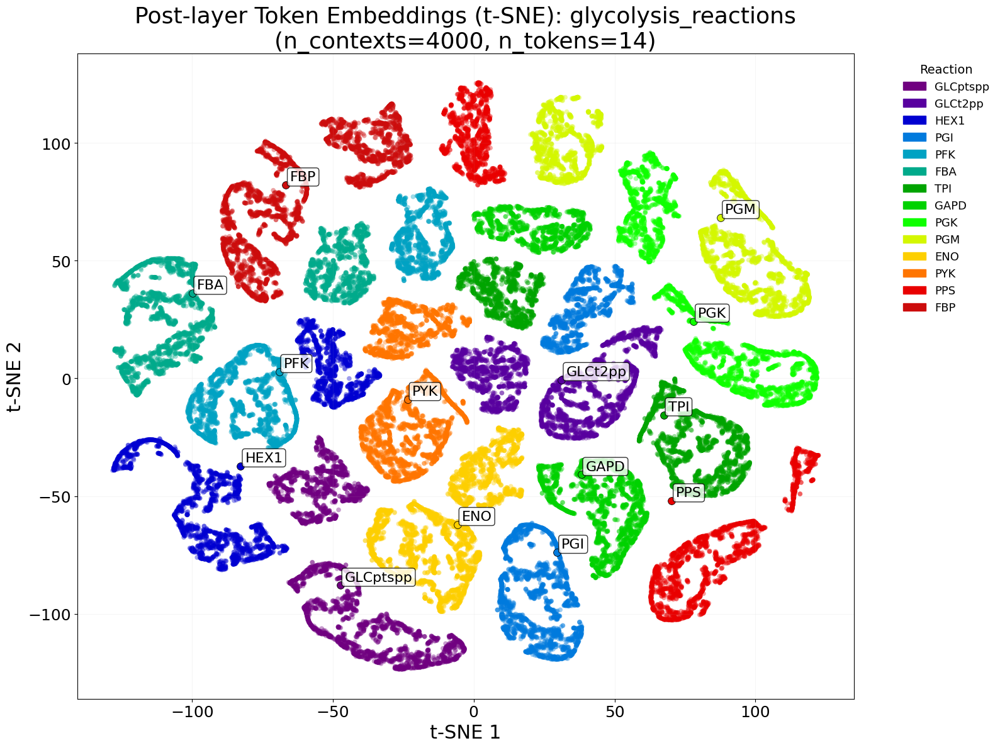

In [22]:
save_path = f"{pic_dir}/{model_name}_tsne_glycolysis_reactions"

plot_reaction_subset_tsne(
    model,
    outputs,
    X_test,
    glycolysis_reactions,
    subset_name="glycolysis_reactions",
    n_samples=4000,
    perplexity=40.0,
    annotate=True,
    annotate_fontsize=16,
    save_path=save_path,
)


Reaction colors:
  G6PDH2r: #700080
  PGL: #0000c5
  GND: #009bd7
  RPI: #009e28
  RPE: #00e700
  TKT1: #e8f000
  TALA: #ff5100
  TKT2: #cc0c0c
Plot saved to ./pics/2026-07-31/AMN_MINN_500k_d256_h8_l3_ff1024/AMN_MINN_500k_d256_h8_l3_ff1024_tsne_ppp_reactions


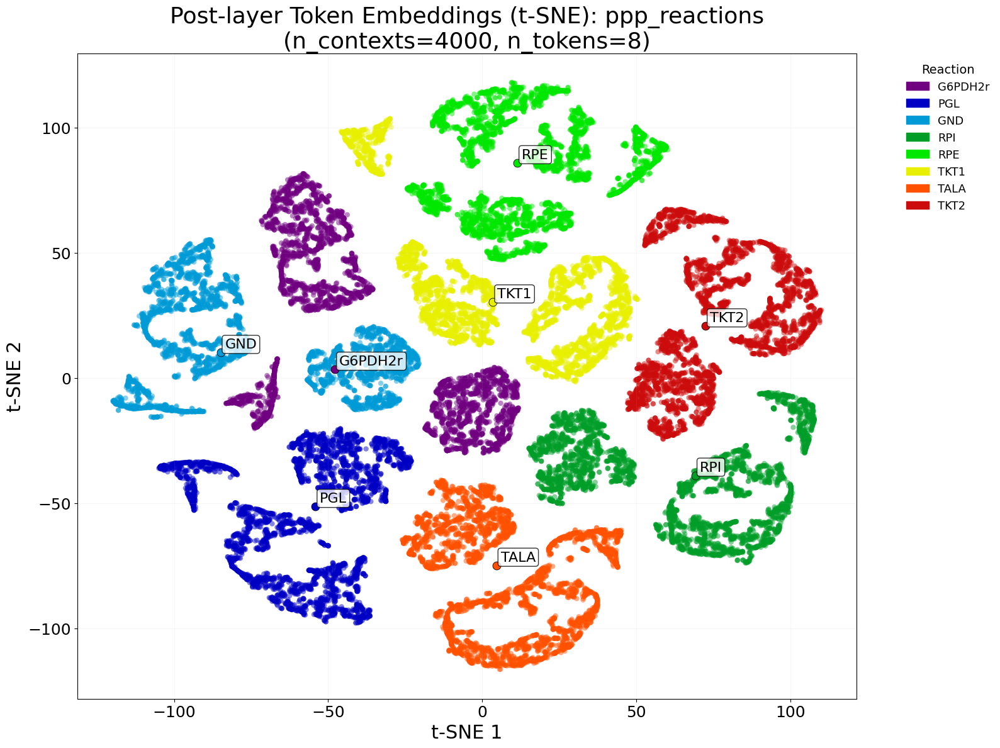

In [23]:
save_path = f"{pic_dir}/{model_name}_tsne_ppp_reactions"

plot_reaction_subset_tsne(
    model,
    outputs,
    X_test,
    ppp_reactions,
    subset_name="ppp_reactions",
    n_samples=4000,
    perplexity=40.0,
    annotate=True,
    annotate_fontsize=16,
    save_path=save_path,
)


Plot saved to ./pics/2026-07-31/AMN_MINN_500k_d256_h8_l3_ff1024/AMN_MINN_500k_d256_h8_l3_ff1024_tsne_tca_reactions_rainbow


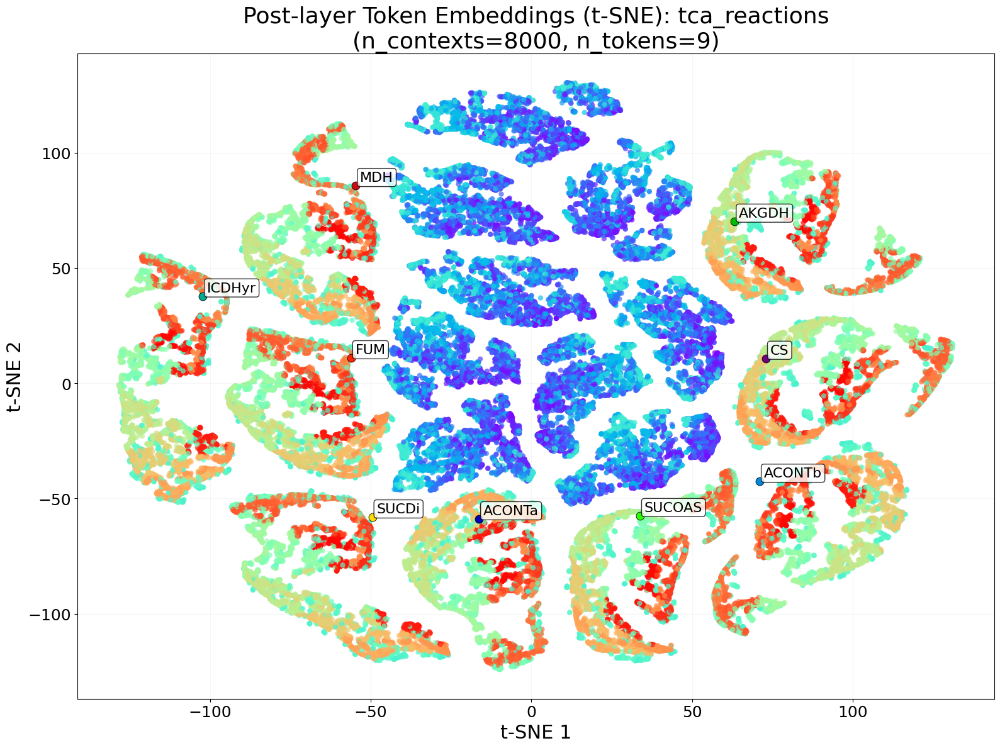

In [24]:
save_path = f"{pic_dir}/{model_name}_tsne_tca_reactions_rainbow"

plot_reaction_subset_tsne(
    model,
    outputs,
    X_test,
    tca_reactions,
    subset_name="tca_reactions",
    n_samples=8000,
    perplexity=40.0,
    annotate=True,
    annotate_fontsize=16,
    sample_color_mode="rainbow",
    save_path=save_path,
)


Pre-embedding points plotted: 7
Plot saved to ./pics/2026-07-31/AMN_MINN_500k_d256_h8_l3_ff1024/AMN_MINN_500k_d256_h8_l3_ff1024_tsne_fermentation_reactions_gray


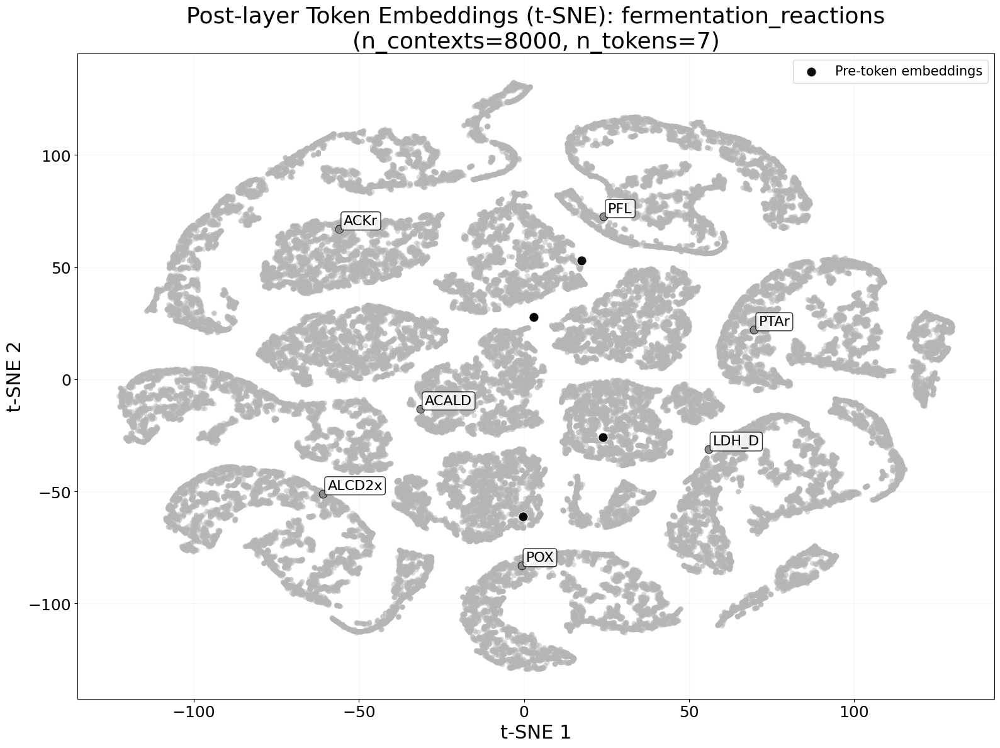

In [25]:
save_path = f"{pic_dir}/{model_name}_tsne_fermentation_reactions_gray"

plot_reaction_subset_tsne(
    model,
    outputs,
    X_test,
    fermentation_reactions,
    subset_name="fermentation_reactions",
    n_samples=8000,
    perplexity=40.0,
    annotate=True,
    annotate_fontsize=16,
    sample_color_mode="gray",
    show_pre_embeddings=True,
    save_path=save_path,
)


### FluxTransformer Reservoir Training

This section trains the front MLP that feeds the frozen FluxTransformer reservoir.

The MINN-style input matrix still merges transcriptomics, proteomics, and measured glucose/oxygen uptake. The notebook evaluates both FluxTransformer context options in separate cells: `MINN_GLC_O2_CONTEXT_MODE="measured"` copies measured glucose and oxygen directly into their context tokens while the front MLP predicts CO2, ethanol, and acetate; `MINN_GLC_O2_CONTEXT_MODE="predicted"` lets the front MLP predict all 5 context channels as an ablation.

The fluxomics target/input file is selected near the top of the setup cell with `MINN_FLUXOMICS_FILE_MODE`. Available modes include the original MINN fitted file for Table 4 comparability, the non-fitted split file for robustness checks, and the iML1515-specific fitted file generated by `scripts/fit_minn_fluxomics_minn_like.py`.

FluxTransformer receives a full vocabulary-sized input vector: the configured reservoir-context positions are filled by measured copies and/or MLP predictions according to the flag, base-exchange positions are filled with fixed medium/background values, and all remaining positions are set to zero. The transformer-output training loss uses non-context flux targets by default, so the MLP cap outputs are not forced to equal the observed exchange fluxes.

The measured-mode and predicted-mode reservoir runs are summarized first. The downstream FluxTransformer-to-pFBA section then evaluates both context modes with measured glucose/oxygen pFBA bounds and predicted CO2, ethanol, and acetate secretion caps.


In [26]:
from pathlib import Path


def _minn_to_flux_token(rxn_name: str, outputs_vocab):
    """Map MINN reaction naming to FluxTransformer token names (+ sign conversion for *_rev)."""
    if rxn_name.startswith("R_BIOMASS"):
        core_token = "BIOMASS_Ec_iML1515_core_75p37M_flux"
        return (core_token, 1.0) if core_token in outputs_vocab else (None, 1.0)

    base = rxn_name
    if base.startswith("R_"):
        base = base[2:]

    sign = 1.0
    if base.endswith("_fwd"):
        base = base[:-4]
    elif base.endswith("_rev"):
        base = base[:-4]
        sign = -1.0

    tok = f"{base}_flux"
    if tok in outputs_vocab:
        return tok, sign
    return None, None


# ----- FluxTransformer reservoir settings -----
MINN_DATA_DIR = "./MINN_data"
# Fluxomics-file switch. Set MINN_FLUXOMICS_FILE_MODE to one of these keys.
MINN_FLUXOMICS_FILE_OPTIONS = {
    "minn_fitted": "fluxomics_iAF1260_reduced_split_fit.csv",          # original MINN fitted file; Table 4 comparability
    "non_fitted": "fluxomics_iAF1260_reduced_split.csv",              # split original measurements; robustness check
    "iml1515_minn_like": "fluxomics_iML1515_minn_like_fit.csv",       # iML1515 fit with MINN-like soft exchange movement
}
MINN_FLUXOMICS_FILE_MODE = "minn_fitted"
# MINN_FLUXOMICS_FILE_MODE = "iml1515_minn_like"
if MINN_FLUXOMICS_FILE_MODE not in MINN_FLUXOMICS_FILE_OPTIONS:
    raise ValueError(
        f"Unknown MINN_FLUXOMICS_FILE_MODE {MINN_FLUXOMICS_FILE_MODE!r}; "
        f"expected one of {list(MINN_FLUXOMICS_FILE_OPTIONS)}"
    )
MINN_FLUXOMICS_FILE = MINN_FLUXOMICS_FILE_OPTIONS[MINN_FLUXOMICS_FILE_MODE]
print(f"MINN fluxomics file mode: {MINN_FLUXOMICS_FILE_MODE} -> {MINN_FLUXOMICS_FILE}")

# 2 measured medium inputs (same as MINN dataset config)
MINN_INPUT_FLUX_COLS = ["R_EX_glc__D_e_rev", "R_EX_o2_e_rev"]
MINN_MEASURED_CONTEXT_SOURCE = list(MINN_INPUT_FLUX_COLS)

# CO2/ethanol/acetate are latent front-MLP control/cap channels by default.
MINN_LEARNED_CONSTRAINT_SOURCE = [
    "R_EX_co2_e_fwd",
    "R_EX_etoh_e",
    "R_EX_ac_e",
]

# Full 5-channel reservoir context passed into FluxTransformer.
MINN_RESERVOIR_CONTEXT_SOURCE = MINN_MEASURED_CONTEXT_SOURCE + MINN_LEARNED_CONSTRAINT_SOURCE

# Default: copy measured glucose/O2 into the FluxTransformer context. Set to
# "predicted" to reproduce the MINN-reservoir-style ablation where the front MLP predicts all 5 channels.
MINN_GLC_O2_CONTEXT_MODE = "measured"  # "measured" or "predicted"


def configure_minn_glc_o2_context_mode(mode="measured"):
    """Configure whether FluxTransformer receives measured or MLP-predicted glucose/O2 context values."""
    global MINN_GLC_O2_CONTEXT_MODE
    global MINN_TRANSFORMER_MEASURED_CONTEXT_SOURCE, MINN_TRANSFORMER_PREDICTED_CONTEXT_SOURCE
    global minn_measured_context_positions, minn_measured_context_positions_t
    global minn_predicted_context_positions, minn_predicted_context_positions_t
    global minn_cap_context_positions, minn_cap_context_positions_t
    global minn_predicted_token_names, minn_measured_token_names, minn_measured_feature_indices
    global minn_learned_token_names, minn_learned_context_positions, minn_learned_context_positions_t

    mode = str(mode).lower().strip()
    if mode not in {"measured", "predicted"}:
        raise ValueError('MINN_GLC_O2_CONTEXT_MODE must be "measured" or "predicted"')

    MINN_GLC_O2_CONTEXT_MODE = mode
    if mode == "measured":
        MINN_TRANSFORMER_MEASURED_CONTEXT_SOURCE = list(MINN_MEASURED_CONTEXT_SOURCE)
        MINN_TRANSFORMER_PREDICTED_CONTEXT_SOURCE = list(MINN_LEARNED_CONSTRAINT_SOURCE)
    else:
        MINN_TRANSFORMER_MEASURED_CONTEXT_SOURCE = []
        MINN_TRANSFORMER_PREDICTED_CONTEXT_SOURCE = list(MINN_RESERVOIR_CONTEXT_SOURCE)

    minn_measured_context_positions = [
        minn_source_to_context_position[src] for src in MINN_TRANSFORMER_MEASURED_CONTEXT_SOURCE
    ]
    minn_measured_context_positions_t = torch.tensor(minn_measured_context_positions, dtype=torch.long, device=device)
    minn_predicted_context_positions = [
        minn_source_to_context_position[src] for src in MINN_TRANSFORMER_PREDICTED_CONTEXT_SOURCE
    ]
    minn_predicted_context_positions_t = torch.tensor(minn_predicted_context_positions, dtype=torch.long, device=device)
    minn_cap_context_positions = [minn_source_to_context_position[src] for src in MINN_LEARNED_CONSTRAINT_SOURCE]
    minn_cap_context_positions_t = torch.tensor(minn_cap_context_positions, dtype=torch.long, device=device)
    minn_predicted_token_names = [minn_mapped_by_source[src][0] for src in MINN_TRANSFORMER_PREDICTED_CONTEXT_SOURCE]
    minn_measured_token_names = [minn_mapped_by_source[src][0] for src in MINN_TRANSFORMER_MEASURED_CONTEXT_SOURCE]
    minn_measured_feature_indices = [minn_feature_names.index(src) for src in MINN_TRANSFORMER_MEASURED_CONTEXT_SOURCE]

    # Backward-compatible aliases for downstream exploratory cells.
    minn_learned_token_names = list(minn_predicted_token_names)
    minn_learned_context_positions = list(minn_predicted_context_positions)
    minn_learned_context_positions_t = minn_predicted_context_positions_t

    return {
        "mode": MINN_GLC_O2_CONTEXT_MODE,
        "measured_context_source": list(MINN_TRANSFORMER_MEASURED_CONTEXT_SOURCE),
        "predicted_context_source": list(MINN_TRANSFORMER_PREDICTED_CONTEXT_SOURCE),
    }

# Keep the 5 context/cap channels out of the transformer-output loss by default.
# This makes the front-MLP outputs latent controls instead of exact exchange-flux regressions.
MINN_FLUX_TARGET_EXCLUDE_CONTEXT = True

# Downstream pFBA comparison mode. Reservoir training still keeps all 5 context channels available.
# Predicted extra exchanges are treated as nonnegative secretion upper caps, not exact fluxes.
MINN_PFBA_EXTRA_CONSTRAINT_MODE = "co2_etoh_ac_cap"
MINN_PFBA_EXTRA_CONSTRAINTS_BY_MODE = {
    "co2_etoh_ac_cap": ["R_EX_co2_e_fwd", "R_EX_etoh_e", "R_EX_ac_e"],
}
if MINN_PFBA_EXTRA_CONSTRAINT_MODE not in MINN_PFBA_EXTRA_CONSTRAINTS_BY_MODE:
    raise ValueError(
        f"MINN_PFBA_EXTRA_CONSTRAINT_MODE must be one of {sorted(MINN_PFBA_EXTRA_CONSTRAINTS_BY_MODE)}"
    )
MINN_PFBA_EXTRA_CONSTRAINT_SOURCE = list(MINN_PFBA_EXTRA_CONSTRAINTS_BY_MODE[MINN_PFBA_EXTRA_CONSTRAINT_MODE])
MINN_PFBA_PRED_COL_BY_SOURCE = {
    "R_EX_co2_e_fwd": "R_EX_co2_e_fwd_pred",
    "R_EX_etoh_e": "R_EX_etoh_e_pred",
    "R_EX_ac_e": "R_EX_ac_e_pred",
}
MINN_PFBA_RXN_BY_SOURCE = {
    "R_EX_co2_e_fwd": "EX_co2_e",
    "R_EX_etoh_e": "EX_etoh_e",
    "R_EX_ac_e": "EX_ac_e",
}

# base_exchanges from generate_ecoli_iML1515_MINN_data.py
BASE_EXCHANGES = [
    "EX_pi_e",
    "EX_co2_e",
    "EX_h_e",
    "EX_mn2_e",
    "EX_fe2_e",
    "EX_zn2_e",
    "EX_mg2_e",
    "EX_ca2_e",
    "EX_ni2_e",
    "EX_cu2_e",
    "EX_cobalt2_e",
    "EX_h2o_e",
    "EX_mobd_e",
    "EX_so4_e",
    "EX_nh4_e",
    "EX_k_e",
    "EX_na1_e",
    "EX_cl_e",
    "EX_o2_e",
    "EX_fe3_e",
    "EX_sel_e",
    "EX_tungs_e",
    "EX_slnt_e",
    "EX_cbl1_e",
]
DEFAULT_BASE_EXCHANGE_RATE = 50.0
PFBA_EXTRA_CONSTRAINT_TOL = 1e-6

# pFBA objective is fixed to iML1515 core biomass for this notebook.
PFBA_OBJECTIVE_VARIANT = "core"
PFBA_OBJECTIVE_RXN = "BIOMASS_Ec_iML1515_core_75p37M"
PFBA_BIOMASS_METRIC_TOKEN = f"{PFBA_OBJECTIVE_RXN}_flux"


def _build_mapped_sources(source_cols, outputs_vocab, label):
    mapped = []
    seen_tokens = set()
    for source_col in source_cols:
        tok, sign = _minn_to_flux_token(source_col, outputs_vocab)
        if tok is None:
            raise RuntimeError(f"Could not map {label} source {source_col} into FluxTransformer token vocabulary")
        if tok in seen_tokens:
            raise RuntimeError(f"Duplicate FluxTransformer token {tok} while mapping {label} sources")
        seen_tokens.add(tok)
        mapped.append((source_col, tok, outputs_vocab.index(tok), float(sign)))
    return mapped


def _signed_flux_rows(fl_idx, experiments, mapped):
    rows = []
    for exp in experiments:
        row = []
        for src, _tok, _idx, sign in mapped:
            row.append(float(fl_idx.at[exp, src]) * sign)
        rows.append(row)
    return np.asarray(rows, dtype=np.float32)


def load_minn_omics_for_reservoir(data_dir: str, outputs_vocab):
    """
    Load MINN-style input (omics + 2 measured fluxes), the 5-channel reservoir
    context, and the transformer-output flux targets used to train latent caps.
    """
    data_dir_p = Path(data_dir)
    transcript_path = data_dir_p / "transcriptomics.csv"
    proteomics_path = data_dir_p / "proteomics.csv"
    fluxomics_path = data_dir_p / MINN_FLUXOMICS_FILE

    if not transcript_path.exists() or not proteomics_path.exists() or not fluxomics_path.exists():
        raise FileNotFoundError(
            f"Expected MINN files in {data_dir}: transcriptomics.csv, proteomics.csv, {MINN_FLUXOMICS_FILE}"
        )

    tr = pd.read_csv(transcript_path)
    pr = pd.read_csv(proteomics_path)
    fl = pd.read_csv(fluxomics_path)

    # MINN-style merge
    x_df = tr.merge(pr, on="experiment", how="left")

    missing_input = [c for c in MINN_INPUT_FLUX_COLS if c not in fl.columns]
    if missing_input:
        raise ValueError(f"Missing MINN input flux columns: {missing_input}")

    x_df = x_df.merge(fl[["experiment"] + MINN_INPUT_FLUX_COLS], on="experiment", how="left")
    x_df = x_df[x_df["experiment"].isin(fl["experiment"])].reset_index(drop=True)

    missing_context = [c for c in MINN_RESERVOIR_CONTEXT_SOURCE if c not in fl.columns]
    if missing_context:
        raise ValueError(f"Missing reservoir-context columns in fluxomics file: {missing_context}")

    excluded_target_sources = set(MINN_RESERVOIR_CONTEXT_SOURCE) if MINN_FLUX_TARGET_EXCLUDE_CONTEXT else set()
    target_source_cols = [c for c in fl.columns if c != "experiment" and c not in excluded_target_sources]
    if not target_source_cols:
        raise ValueError("No transformer-output flux targets left after applying MINN_FLUX_TARGET_EXCLUDE_CONTEXT")

    fl_idx = fl.set_index("experiment")
    context_mapped = _build_mapped_sources(MINN_RESERVOIR_CONTEXT_SOURCE, outputs_vocab, "reservoir-context")
    target_mapped = _build_mapped_sources(target_source_cols, outputs_vocab, "training target")

    # Inputs
    x_features = [c for c in x_df.columns if c != "experiment"]
    X_np = x_df[x_features].to_numpy(dtype=np.float32)

    experiments = x_df["experiment"].tolist()
    y_context_np = _signed_flux_rows(fl_idx, experiments, context_mapped)
    y_target_np = _signed_flux_rows(fl_idx, experiments, target_mapped)

    context_token_names = [tok for _src, tok, _idx, _sign in context_mapped]
    context_token_indices = [idx for _src, _tok, idx, _sign in context_mapped]
    target_token_names = [tok for _src, tok, _idx, _sign in target_mapped]
    target_token_indices = [idx for _src, _tok, idx, _sign in target_mapped]

    return (
        X_np,
        y_target_np,
        y_context_np,
        x_features,
        context_token_names,
        context_token_indices,
        context_mapped,
        target_token_names,
        target_token_indices,
        target_mapped,
        experiments,
    )


(
    X_minn_np,
    y_minn_np,
    y_minn_context_np,
    minn_feature_names,
    minn_context_token_names,
    minn_context_indices,
    minn_mapped_sources,
    minn_target_token_names,
    minn_target_indices,
    minn_target_mapped_sources,
    minn_experiments,
) = load_minn_omics_for_reservoir(
    data_dir=MINN_DATA_DIR,
    outputs_vocab=outputs,
)
y_minn_target_np = y_minn_np

minn_target_indices_t = torch.tensor(minn_target_indices, dtype=torch.long, device=device)
minn_context_indices_t = torch.tensor(minn_context_indices, dtype=torch.long, device=device)
# Signs used in MINN source naming (*_rev -> -1). Needed to recover positive context magnitudes.
minn_target_signs = np.asarray([float(sign) for _src, _tok, _idx, sign in minn_target_mapped_sources], dtype=np.float32)
minn_context_signs = np.asarray([float(sign) for _src, _tok, _idx, sign in minn_mapped_sources], dtype=np.float32)
minn_target_signs_t = torch.tensor(minn_target_signs, dtype=torch.float32, device=device)
minn_context_signs_t = torch.tensor(minn_context_signs, dtype=torch.float32, device=device)

minn_source_to_context_position = {src: i for i, (src, _tok, _idx, _sign) in enumerate(minn_mapped_sources)}
minn_mapped_by_source = {src: (tok, idx, sign) for src, tok, idx, sign in minn_mapped_sources}
configure_minn_glc_o2_context_mode(MINN_GLC_O2_CONTEXT_MODE)

# Build fixed base exchange constraints in FluxTransformer token space.
# Rules for the full input vector assembled inside the wrapper:
# - measured-mode glucose/oxygen context tokens are copied from measured inputs
# - predicted context tokens are filled from front-MLP outputs
# - base_exchanges outside the 5 context tokens are fixed at DEFAULT_BASE_EXCHANGE_RATE
# - all other token positions are zero
context_token_set = set(minn_context_token_names)
fixed_base_token_values = {}
for ex in BASE_EXCHANGES:
    tok = f"{ex}_flux"
    if tok in outputs and tok not in context_token_set:
        fixed_base_token_values[tok] = float(DEFAULT_BASE_EXCHANGE_RATE)


class FrozenFluxTransformerWithMLP(nn.Module):
    """
    FluxTransformer reservoir wrapper:
    - By default, measured glucose/oxygen are copied directly into the reservoir context
    - The front MLP predicts latent context/control values for CO2/ethanol/acetate
    - Optional predicted glucose/O2 mode lets the front MLP predict all 5 context channels
    - Frozen pretrained FluxTransformer

    pFBA evaluation later always keeps glucose/oxygen measured and applies selected
    predicted secretion channels as upper-cap constraints.
    """
    def __init__(
        self,
        flux_transformer: nn.Module,
        input_dim: int,
        predicted_token_names,
        measured_token_names,
        measured_feature_indices,
        fixed_base_token_values,
        hidden_dim: int = 512,
        drop_rate: float = 0.25,
    ):
        super().__init__()
        self.frozen_flux_transformer = flux_transformer
        self.vocab_size = int(self.frozen_flux_transformer.vocab_size)

        self.predicted_token_names = list(predicted_token_names)
        self.measured_token_names = list(measured_token_names)
        self.measured_feature_indices_list = list(measured_feature_indices)
        self.fixed_base_token_values = dict(fixed_base_token_values)

        token_to_idx = {tok: i for i, tok in enumerate(outputs)}
        predicted_indices = []
        for tok in self.predicted_token_names:
            if tok not in token_to_idx:
                raise ValueError(f"Predicted context token not found in outputs vocab: {tok}")
            predicted_indices.append(token_to_idx[tok])

        measured_indices = []
        for tok in self.measured_token_names:
            if tok not in token_to_idx:
                raise ValueError(f"Measured context token not found in outputs vocab: {tok}")
            measured_indices.append(token_to_idx[tok])

        fixed_names = []
        fixed_vals = []
        for tok, val in self.fixed_base_token_values.items():
            if tok in token_to_idx:
                fixed_names.append(tok)
                fixed_vals.append(float(val))

        self.register_buffer("predicted_indices", torch.tensor(predicted_indices, dtype=torch.long), persistent=True)
        self.register_buffer("measured_indices", torch.tensor(measured_indices, dtype=torch.long), persistent=True)
        self.register_buffer("measured_feature_indices", torch.tensor(self.measured_feature_indices_list, dtype=torch.long), persistent=True)
        self.register_buffer("fixed_indices", torch.tensor([token_to_idx[t] for t in fixed_names], dtype=torch.long), persistent=True)
        self.register_buffer("fixed_values", torch.tensor(fixed_vals, dtype=torch.float32), persistent=True)

        for p in self.frozen_flux_transformer.parameters():
            p.requires_grad = False
        self.frozen_flux_transformer.eval()

        self.front_mlp = nn.Sequential(
            nn.Linear(input_dim, hidden_dim),
            nn.ReLU(),
            nn.Dropout(drop_rate),
            nn.Linear(hidden_dim, len(self.predicted_token_names)),
        )

    def train(self, mode: bool = True):
        super().train(mode)
        self.frozen_flux_transformer.eval()
        return self

    def predict_context_values(self, x):
        return F.softplus(self.front_mlp(x))

    def predict_learned_constraints(self, x):
        # Backward-compatible name; these are latent predicted context values by default.
        return self.predict_context_values(x)

    def _measured_context_from_x(self, x):
        if self.measured_feature_indices.numel() == 0:
            return x.new_zeros((x.size(0), 0))
        return x.index_select(1, self.measured_feature_indices.to(device=x.device))

    def build_full_input_vector(self, x, measured_context_values=None):
        # x: [B, n_features]
        predicted_vals = self.predict_context_values(x)
        if measured_context_values is None:
            # Fallback is intended for raw, unscaled X where measured flux columns are present.
            measured_context_values = self._measured_context_from_x(x)
        measured_context_values = measured_context_values.to(dtype=x.dtype, device=x.device)
        if measured_context_values.shape[1] != self.measured_indices.numel():
            raise ValueError(
                f"Expected {self.measured_indices.numel()} measured context values, "
                f"got {measured_context_values.shape[1]}"
            )

        B = x.size(0)
        c0 = torch.zeros(B, self.vocab_size, dtype=x.dtype, device=x.device)

        if self.fixed_indices.numel() > 0:
            c0[:, self.fixed_indices] = self.fixed_values.to(dtype=x.dtype, device=x.device).unsqueeze(0)

        if self.measured_indices.numel() > 0:
            c0[:, self.measured_indices] = measured_context_values
        if self.predicted_indices.numel() > 0:
            c0[:, self.predicted_indices] = predicted_vals
        return c0

    def forward(self, x, measured_context_values=None, output_subset=None, return_embedding=False):
        if x.dim() == 3 and x.size(-1) == 1:
            x = x.squeeze(-1)
        c0 = self.build_full_input_vector(x, measured_context_values=measured_context_values).unsqueeze(-1)
        return self.frozen_flux_transformer(c0, output_subset=output_subset, return_embedding=return_embedding)


# Build model
minn_model = FrozenFluxTransformerWithMLP(
    flux_transformer=model,
    input_dim=X_minn_np.shape[1],
    predicted_token_names=minn_predicted_token_names,
    measured_token_names=minn_measured_token_names,
    measured_feature_indices=minn_measured_feature_indices,
    fixed_base_token_values=fixed_base_token_values,
    hidden_dim=512,
    drop_rate=0.25,
).to(device)

with torch.no_grad():
    _x2 = torch.tensor(X_minn_np[:2], dtype=torch.float32, device=device)
    _context2 = torch.tensor(y_minn_context_np[:2], dtype=torch.float32, device=device)
    _context_mag2 = torch.clamp(_context2 * minn_context_signs_t.unsqueeze(0), min=0.0)
    _measured2 = (
        _context_mag2.index_select(1, minn_measured_context_positions_t)
        if minn_measured_context_positions_t.numel() > 0
        else None
    )
    _c0_sanity = minn_model.build_full_input_vector(_x2, measured_context_values=_measured2)
    _pred_sanity, _sel_sanity = minn_model(_x2, measured_context_values=_measured2, output_subset=None)

trainable_params = sum(p.numel() for p in minn_model.parameters() if p.requires_grad)
frozen_flux_params = sum(p.numel() for p in minn_model.frozen_flux_transformer.parameters() if not p.requires_grad)

print("Loaded MINN-style omics dataset")
print(f"MINN data dir: {MINN_DATA_DIR}")
print(f"MINN fluxomics file mode: {MINN_FLUXOMICS_FILE_MODE} -> {MINN_FLUXOMICS_FILE}")
print(f"Samples: {X_minn_np.shape[0]}")
print(f"Input features (omics + 2 measured fluxes): {X_minn_np.shape[1]}")
print("Reservoir context source order:", MINN_RESERVOIR_CONTEXT_SOURCE)
print("Transformer glucose/O2 context mode:", MINN_GLC_O2_CONTEXT_MODE)
print("Context copied from measured inputs:", MINN_TRANSFORMER_MEASURED_CONTEXT_SOURCE)
print("Context predicted by front MLP:", MINN_TRANSFORMER_PREDICTED_CONTEXT_SOURCE)
print("pFBA predicted secretion caps:", MINN_PFBA_EXTRA_CONSTRAINT_SOURCE)
print(f"Transformer-output training targets: {len(minn_target_token_names)} (exclude context={MINN_FLUX_TARGET_EXCLUDE_CONTEXT})")
print("Mapped context token names:", minn_context_token_names)
print("First mapped training target token names:", minn_target_token_names[:10])
print("MINN context source -> FluxTransformer token mapping (with sign)")
for src, tok, idx, sign in minn_mapped_sources:
    print(f"  {src:>18} -> {tok:<30} idx={idx:4d} sign={sign:+.0f}")
print("Measured input feature positions:", dict(zip(MINN_TRANSFORMER_MEASURED_CONTEXT_SOURCE, minn_measured_feature_indices)))
print(f"Fixed base exchange token count: {len(fixed_base_token_values)} (value={DEFAULT_BASE_EXCHANGE_RATE})")
print(f"Trainable params (front MLP only): {trainable_params:,}")
print(f"Frozen FluxTransformer params:      {frozen_flux_params:,}")
print(f"Sanity c0 shape:                   {tuple(_c0_sanity.shape)}")
print(f"Sanity transformer output shape:   {tuple(_pred_sanity.shape)}")


MINN fluxomics file mode: minn_fitted -> fluxomics_iAF1260_reduced_split_fit.csv
Loaded MINN-style omics dataset
MINN data dir: ./MINN_data
MINN fluxomics file mode: minn_fitted -> fluxomics_iAF1260_reduced_split_fit.csv
Samples: 29
Input features (omics + 2 measured fluxes): 141
Reservoir context source order: ['R_EX_glc__D_e_rev', 'R_EX_o2_e_rev', 'R_EX_co2_e_fwd', 'R_EX_etoh_e', 'R_EX_ac_e']
Transformer glucose/O2 context mode: measured
Context copied from measured inputs: ['R_EX_glc__D_e_rev', 'R_EX_o2_e_rev']
Context predicted by front MLP: ['R_EX_co2_e_fwd', 'R_EX_etoh_e', 'R_EX_ac_e']
pFBA predicted secretion caps: ['R_EX_co2_e_fwd', 'R_EX_etoh_e', 'R_EX_ac_e']
Transformer-output training targets: 42 (exclude context=True)
Mapped context token names: ['EX_glc__D_e_flux', 'EX_o2_e_flux', 'EX_co2_e_flux', 'EX_etoh_e_flux', 'EX_ac_e_flux']
First mapped training target token names: ['GLCptspp_flux', 'PGI_flux', 'PFK_flux', 'FBA_flux', 'TPI_flux', 'PGK_flux', 'GAPD_flux', 'ENO_flux',

In [27]:
# Assertions: token/reaction mapping and sign conventions for MINN -> iML1515 integration

import xml.etree.ElementTree as ET
from pathlib import Path

# 1) Required reservoir-context tokens must exist in outputs vocab
required_pred_tokens = [
    "EX_glc__D_e_flux",
    "EX_o2_e_flux",
    "EX_co2_e_flux",
    "EX_etoh_e_flux",
    "EX_ac_e_flux",
]

missing_pred_tokens = [t for t in required_pred_tokens if t not in outputs]
assert not missing_pred_tokens, (
    "Missing required reservoir-context tokens in outputs vocab: "
    + ", ".join(missing_pred_tokens)
)

# 2) Base exchange tokens must exist in outputs vocab
base_tokens = [f"{ex}_flux" for ex in BASE_EXCHANGES]
missing_base_tokens = [t for t in base_tokens if t not in outputs]
assert not missing_base_tokens, (
    "Missing base exchange tokens in outputs vocab: "
    + ", ".join(missing_base_tokens)
)

# 3) pFBA-constrained reactions must exist in iML1515 model
model_path = Path("./models/iML1515.xml")
assert model_path.exists(), f"SBML model not found: {model_path}"

ns = {"sbml": "http://www.sbml.org/sbml/level3/version1/core"}
root = ET.parse(model_path).getroot()
rxn_ids = [r.attrib.get("id", "") for r in root.findall('.//sbml:listOfReactions/sbml:reaction', ns)]
rxn_ids_norm = {(rid[2:] if rid.startswith("R_") else rid) for rid in rxn_ids}

required_pfba_rxns = ["EX_glc__D_e", "EX_o2_e", "EX_co2_e", "EX_etoh_e", "EX_ac_e"]
missing_rxns = [r for r in required_pfba_rxns if r not in rxn_ids_norm]
assert not missing_rxns, "Missing required pFBA reactions in iML1515 model: " + ", ".join(missing_rxns)

# 4) MINN context columns used as FluxTransformer input constraints should be nonnegative magnitudes
fluxomics_path = Path(MINN_DATA_DIR) / MINN_FLUXOMICS_FILE
assert fluxomics_path.exists(), f"Fluxomics file not found: {fluxomics_path}"

fl_check = pd.read_csv(fluxomics_path)
for col in MINN_RESERVOIR_CONTEXT_SOURCE:
    assert col in fl_check.columns, f"Expected sign-check column missing: {col}"
    cmin = float(fl_check[col].min())
    assert cmin >= -1e-9, f"Column {col} has negative values (min={cmin}), sign assumption broken."

# 5) Explicitly lock the reservoir-context source -> iML1515 token/sign mapping.
expected_context_mapping = {
    "R_EX_glc__D_e_rev": ("EX_glc__D_e_flux", -1.0),
    "R_EX_o2_e_rev": ("EX_o2_e_flux", -1.0),
    "R_EX_co2_e_fwd": ("EX_co2_e_flux", 1.0),
    "R_EX_etoh_e": ("EX_etoh_e_flux", 1.0),
    "R_EX_ac_e": ("EX_ac_e_flux", 1.0),
}
observed_context_mapping = {src: (tok, float(sign)) for src, tok, _idx, sign in minn_mapped_sources}
assert observed_context_mapping == expected_context_mapping, (
    "Unexpected reservoir-context mapping/signs: " + str(observed_context_mapping)
)

# 6) Mapping coverage sanity for measured flux columns used in metrics
metric_source_cols = [c for c in fl_check.columns if c != "experiment"]
unmapped = []
for src in metric_source_cols:
    tok, sign = _minn_to_flux_token(src, outputs)
    if tok is None:
        unmapped.append(src)
    else:
        assert sign in (-1.0, 1.0), f"Unexpected sign {sign} for {src}"

assert not unmapped, "Some measured flux columns could not map into iML1515 token space: " + ", ".join(unmapped[:20])
mapped_metric_tokens = [_minn_to_flux_token(src, outputs)[0] for src in metric_source_cols]
assert not any(tok and "WT_75p37M" in tok for tok in mapped_metric_tokens), "Metric target mapping unexpectedly uses WT biomass."
for src in [c for c in metric_source_cols if c.startswith("R_BIOMASS")]:
    tok, _sign = _minn_to_flux_token(src, outputs)
    assert tok == PFBA_BIOMASS_METRIC_TOKEN, f"Biomass target {src} maps to {tok}, expected {PFBA_BIOMASS_METRIC_TOKEN}"

print("Assertions passed: token existence, reaction existence, mapping coverage, and sign conventions are consistent.")


Assertions passed: token existence, reaction existence, mapping coverage, and sign conventions are consistent.


In [28]:
# Train MINN-style front MLP with frozen FluxTransformer reservoir
# Outer loop: Leave-One-Out CV
# Inner loop: 5-fold CV hyperparameter search on training split only
# Default behavior:
# - glucose/O2 are copied from measured flux columns into the FluxTransformer context
# - the front MLP predicts latent CO2/ethanol/acetate context controls/caps
# - transformer-output loss is computed on non-context flux targets
# - downstream pFBA keeps measured glucose/O2 and applies predicted CO2/ethanol/acetate secretion caps

from sklearn.model_selection import LeaveOneOut, KFold
from sklearn.preprocessing import MinMaxScaler

try:
    import optuna
    OPTUNA_AVAILABLE = True
except Exception:
    OPTUNA_AVAILABLE = False

set_seed(12345)

# MINN-style CV/HPO settings
minn_cv_seed = 12345
minn_cv_n_fold = 5
minn_cv_max_trials = 50
minn_cv_epochs = 150
minn_cv_batch_size = 5
minn_cv_early_stopping_patience = 25
minn_cv_early_stopping_min_delta = 1e-5

if device.type == "cuda" and minn_cv_batch_size > 2:
    print("CUDA detected: overriding batch_size 5 -> 2 to avoid OOM with full-output forward.")
    minn_cv_batch_size = 2

search_space = {
    "drop_rate": [0.0, 0.05, 0.1, 0.2, 0.3, 0.35, 0.4],
    "learning_rate": {"low": 5e-4, "high": 1e-2, "log": True},
    "weight_decay": {"low": 1e-8, "high": 1e-3, "log": True},
}

# Optuna objective = mean(inner-fold val loss) + lambda * std(inner-fold val loss)
# (stability-aware global tuning)
MINN_INNER_CV_STD_PENALTY = 0.25

# Training-stability settings
MINN_GRAD_CLIP_MAX_NORM = 1.0
MINN_LR_WARMUP_EPOCHS = max(3, min(10, minn_cv_epochs // 10))
MINN_LR_COSINE_MIN_FACTOR = 0.05

# Save the per-LOO R2/RMSE diagnostic plot by default while still showing it.
# Set to None to only show the plot in the notebook.
MINN_LOO_METRIC_PLOT_SAVE_PATH = globals().get(
    "MINN_LOO_METRIC_PLOT_SAVE_PATH",
    os.path.join("pics", "minn_loo_metric_panels.png"),
)


def plot_minn_loo_metric_panels(loo_metrics_df, save_path=MINN_LOO_METRIC_PLOT_SAVE_PATH):
    if not isinstance(loo_metrics_df, pd.DataFrame) or loo_metrics_df.empty:
        return None, None

    fold_x = loo_metrics_df["loo_run"].astype(int).values
    fig, axes = plt.subplots(1, 2, figsize=(12.8, 4.8), sharex=True)
    metric_specs = [
        ("R2", False),   # lower is worse
        ("RMSE", True),  # higher is worse
    ]
    title_fs = 16
    label_fs = 13
    tick_fs = 12
    annotation_fs = 10
    legend_fs = 11

    for ax, (metric_name, higher_is_worse) in zip(axes, metric_specs):
        y = loo_metrics_df[metric_name].astype(float).values
        ax.plot(fold_x, y, marker="o", lw=1.5, color="#1f77b4", alpha=0.9)
        y_min = float(np.nanmin(y))
        y_max = float(np.nanmax(y))
        y_range = max(y_max - y_min, 1e-9)
        if metric_name == "R2":
            r2_range = max(1.0 - y_min, y_range, 1e-9)
            ax.set_ylim(y_min - 0.12 * r2_range, 1.0)
        else:
            rmse_range = max(y_max, y_range, 1e-9)
            ax.set_ylim(0.0, y_max + 0.12 * rmse_range)

        # Highlight the 3 worst folds for each metric.
        k = min(3, len(y))
        if higher_is_worse:
            worst_idx = np.argsort(-y)[:k]
        else:
            worst_idx = np.argsort(y)[:k]

        ax.scatter(fold_x[worst_idx], y[worst_idx], color="red", s=55, zorder=5, label="Worst folds")

        annotation_y_offset = -12 if metric_name == "R2" else 8
        annotation_va = "top" if metric_name == "R2" else "bottom"

        for wi in worst_idx:
            ax.annotate(
                str(int(fold_x[wi])),
                (fold_x[wi], y[wi]),
                textcoords="offset points",
                xytext=(0, annotation_y_offset),
                ha="center",
                va=annotation_va,
                fontsize=annotation_fs,
                color="red",
            )

        ax.set_title(f"Per-fold {metric_name}", fontsize=title_fs)
        ax.set_xlabel("LOO fold", fontsize=label_fs)
        ax.set_ylabel(metric_name, fontsize=label_fs)
        ax.tick_params(axis="both", labelsize=tick_fs)
        ax.grid(alpha=0.25)

    axes[0].legend(loc="best", fontsize=legend_fs)
    plt.tight_layout()

    if save_path is not None:
        save_dir = os.path.dirname(save_path)
        if save_dir:
            os.makedirs(save_dir, exist_ok=True)
        fig.savefig(save_path, bbox_inches="tight", dpi=300)
        print(f"Saved per-LOO metric panel plot to {save_path}")

    plt.show()
    return fig, axes


# IMPORTANT: run HPO once globally (not once per LOO split) to avoid extremely long runtimes.
MINN_HPO_ONCE = True

# Front-MLP context outputs are latent controls/caps.
# No extra context-loss term or weight sweep is used in the active pipeline.
MINN_USE_FIXED_HYPERPARAMS = False
MINN_FIXED_BEST_PARAMS = {
    "drop_rate": 0.25,
    "learning_rate": 0.0009736777696601047,
    "weight_decay": 4.738391288843704e-05,
}
MINN_FIXED_INNER_CV_OBJECTIVE = 1.1122118454919798


def _make_model(drop_rate: float, device_obj):
    return FrozenFluxTransformerWithMLP(
        flux_transformer=model,
        input_dim=X_minn_np.shape[1],
        predicted_token_names=minn_predicted_token_names,
        measured_token_names=minn_measured_token_names,
        measured_feature_indices=minn_measured_feature_indices,
        fixed_base_token_values=fixed_base_token_values,
        hidden_dim=512,
        drop_rate=drop_rate,
    ).to(device_obj)


def _safe_r2(y_true_np, y_pred_np):
    y_true_np = np.asarray(y_true_np, dtype=np.float64)
    y_pred_np = np.asarray(y_pred_np, dtype=np.float64)
    if np.std(y_true_np) == 0 or np.std(y_pred_np) == 0:
        return 0.0
    return float(r2_score(y_true_np, y_pred_np))


def _train_eval_split(
    X_tr_np, y_tr_np, y_context_tr_np,
    X_va_np, y_va_np, y_context_va_np,
    params, epochs, batch_size, device_obj,
    early_stopping_patience=minn_cv_early_stopping_patience,
    early_stopping_min_delta=minn_cv_early_stopping_min_delta,
):
    # MINN-repo-style preprocessing: fit scaler on train fold only, apply to train/val.
    x_scaler = MinMaxScaler()
    X_tr_np_scaled = x_scaler.fit_transform(X_tr_np)
    X_va_np_scaled = x_scaler.transform(X_va_np)

    model_local = _make_model(drop_rate=float(params["drop_rate"]), device_obj=device_obj)

    optimizer = torch.optim.AdamW(
        model_local.front_mlp.parameters(),
        lr=float(params["learning_rate"]),
        weight_decay=float(params["weight_decay"]),
    )
    criterion = nn.HuberLoss()

    use_amp = device_obj.type == "cuda"
    amp_device_type = "cuda" if use_amp else device_obj.type
    scaler = torch.amp.GradScaler(amp_device_type, enabled=use_amp)

    # Warmup + cosine decay LR schedule for stabler optimization on tiny folds.
    warmup_epochs = int(max(1, min(int(MINN_LR_WARMUP_EPOCHS), int(epochs))))

    def _lr_lambda(epoch_idx: int):
        if epoch_idx < warmup_epochs:
            return float(epoch_idx + 1) / float(warmup_epochs)

        progress_denom = max(1, int(epochs) - warmup_epochs)
        progress = float(epoch_idx - warmup_epochs) / float(progress_denom)
        progress = max(0.0, min(1.0, progress))

        cosine = 0.5 * (1.0 + np.cos(np.pi * progress))
        min_factor = float(MINN_LR_COSINE_MIN_FACTOR)
        return min_factor + (1.0 - min_factor) * cosine

    scheduler = torch.optim.lr_scheduler.LambdaLR(optimizer, lr_lambda=_lr_lambda)

    X_tr = torch.tensor(X_tr_np_scaled, dtype=torch.float32)
    y_tr = torch.tensor(y_tr_np, dtype=torch.float32)
    y_context_tr = torch.tensor(y_context_tr_np, dtype=torch.float32)
    X_va = torch.tensor(X_va_np_scaled, dtype=torch.float32)
    y_va = torch.tensor(y_va_np, dtype=torch.float32)
    y_context_va = torch.tensor(y_context_va_np, dtype=torch.float32)

    train_loader = torch.utils.data.DataLoader(
        torch.utils.data.TensorDataset(X_tr, y_tr, y_context_tr),
        batch_size=batch_size,
        shuffle=True,
        num_workers=0,
        pin_memory=(device_obj.type == "cuda"),
    )
    val_loader = torch.utils.data.DataLoader(
        torch.utils.data.TensorDataset(X_va, y_va, y_context_va),
        batch_size=batch_size,
        shuffle=False,
        num_workers=0,
        pin_memory=(device_obj.type == "cuda"),
    )

    target_idx_t = minn_target_indices_t.to(device_obj)
    context_signs_t = minn_context_signs_t.to(device_obj)
    measured_context_pos_t = minn_measured_context_positions_t.to(device_obj)
    predicted_context_pos_t = minn_predicted_context_positions_t.to(device_obj)

    def _positive_context_targets(yb_context):
        return torch.clamp(yb_context * context_signs_t.unsqueeze(0), min=0.0)

    def _measured_context_values(context_targets):
        if measured_context_pos_t.numel() == 0:
            return None
        return context_targets.index_select(1, measured_context_pos_t)

    def _forward_and_loss(xb, yb_target, yb_context):
        context_targets = _positive_context_targets(yb_context)
        measured_context = _measured_context_values(context_targets)

        preds_all_layers, _sel = model_local(xb, measured_context_values=measured_context, output_subset=None)
        preds_last = preds_all_layers[:, :, -1]
        preds_target = preds_last.index_select(1, target_idx_t)

        loss = criterion(preds_target, yb_target)
        pred_context = model_local.predict_context_values(xb)
        return loss, preds_target, pred_context, context_targets

    best_val_loss = float("inf")
    best_front_state = None
    no_improve_epochs = 0

    trained_epochs = 0

    for _epoch in range(epochs):
        trained_epochs = int(_epoch) + 1
        model_local.train()
        for xb, yb, yb_context in train_loader:
            xb = xb.to(device_obj, non_blocking=True)
            yb = yb.to(device_obj, non_blocking=True)
            yb_context = yb_context.to(device_obj, non_blocking=True)

            optimizer.zero_grad(set_to_none=True)
            with torch.amp.autocast(device_type=amp_device_type, enabled=use_amp):
                loss, _preds_target, _pred_context, _context_targets = _forward_and_loss(
                    xb,
                    yb,
                    yb_context,
                )

            scaler.scale(loss).backward()
            scaler.unscale_(optimizer)
            torch.nn.utils.clip_grad_norm_(
                model_local.front_mlp.parameters(),
                max_norm=float(MINN_GRAD_CLIP_MAX_NORM),
            )
            scaler.step(optimizer)
            scaler.update()

        # Epoch-level validation for early stopping
        model_local.eval()
        epoch_val_loss_sum = 0.0
        epoch_val_count = 0
        with torch.no_grad():
            for xb, yb, yb_context in val_loader:
                xb = xb.to(device_obj, non_blocking=True)
                yb = yb.to(device_obj, non_blocking=True)
                yb_context = yb_context.to(device_obj, non_blocking=True)

                with torch.amp.autocast(device_type=amp_device_type, enabled=use_amp):
                    val_loss, _preds_target, _pred_context, _context_targets = _forward_and_loss(
                        xb,
                        yb,
                        yb_context,
                    )

                bs = xb.size(0)
                epoch_val_loss_sum += float(val_loss.item()) * bs
                epoch_val_count += bs

        epoch_val_loss = epoch_val_loss_sum / max(epoch_val_count, 1)
        scheduler.step()

        if epoch_val_loss + float(early_stopping_min_delta) < best_val_loss:
            best_val_loss = epoch_val_loss
            best_front_state = {k: v.detach().cpu().clone() for k, v in model_local.front_mlp.state_dict().items()}
            no_improve_epochs = 0
        else:
            no_improve_epochs += 1
            if no_improve_epochs >= int(early_stopping_patience):
                break

    if best_front_state is not None:
        model_local.front_mlp.load_state_dict(best_front_state)

    model_local.eval()
    val_loss_sum = 0.0
    val_count = 0
    preds_list = []
    true_list = []
    constraints_list = []
    context_true_list = []

    with torch.no_grad():
        for xb, yb, yb_context in val_loader:
            xb = xb.to(device_obj, non_blocking=True)
            yb = yb.to(device_obj, non_blocking=True)
            yb_context = yb_context.to(device_obj, non_blocking=True)

            with torch.amp.autocast(device_type=amp_device_type, enabled=use_amp):
                val_loss, preds_target, pred_context, context_targets = _forward_and_loss(
                    xb,
                    yb,
                    yb_context,
                )

            bs = xb.size(0)
            val_loss_sum += float(val_loss.item()) * bs
            val_count += bs

            preds_list.append(preds_target.detach().cpu().numpy())
            true_list.append(yb.detach().cpu().numpy())

            # Full 5-column reservoir context in MINN_RESERVOIR_CONTEXT_SOURCE order.
            # In measured mode, glucose/O2 remain measured copies; in predicted mode all 5 are MLP outputs.
            full_context_constraints = context_targets.clone()
            full_context_constraints[:, predicted_context_pos_t] = pred_context
            constraints_list.append(full_context_constraints.detach().cpu().numpy())
            context_true_list.append(context_targets.detach().cpu().numpy())

    mean_val_loss = val_loss_sum / max(val_count, 1)
    y_pred = np.concatenate(preds_list, axis=0)
    y_true = np.concatenate(true_list, axis=0)
    y_constraints = np.concatenate(constraints_list, axis=0)
    y_context_true = np.concatenate(context_true_list, axis=0)

    if device_obj.type == "cuda":
        torch.cuda.empty_cache()

    return mean_val_loss, y_pred, y_true, y_constraints, y_context_true, trained_epochs


def _evaluate_params_inner_kfold(X_train_np, y_train_np, y_context_train_np, params, trial=None):
    kf = KFold(n_splits=minn_cv_n_fold, shuffle=True, random_state=minn_cv_seed)
    fold_losses = []

    for fold_idx, (tr_idx, va_idx) in enumerate(kf.split(X_train_np)):
        X_tr, y_tr, y_context_tr = X_train_np[tr_idx], y_train_np[tr_idx], y_context_train_np[tr_idx]
        X_va, y_va, y_context_va = X_train_np[va_idx], y_train_np[va_idx], y_context_train_np[va_idx]

        try:
            val_loss, _pred, _true, _c, _ct, _trained_epochs = _train_eval_split(
                X_tr, y_tr, y_context_tr,
                X_va, y_va, y_context_va,
                params=params,
                epochs=minn_cv_epochs,
                batch_size=minn_cv_batch_size,
                device_obj=device,
            )
        except RuntimeError as e:
            if device.type == "cuda" and "out of memory" in str(e).lower():
                torch.cuda.empty_cache()
                val_loss, _pred, _true, _c, _ct, _trained_epochs = _train_eval_split(
                    X_tr, y_tr, y_context_tr,
                    X_va, y_va, y_context_va,
                    params=params,
                    epochs=minn_cv_epochs,
                    batch_size=1,
                    device_obj=torch.device("cpu"),
                )
            else:
                raise

        fold_losses.append(float(val_loss))

        if trial is not None:
            running_mean = float(np.mean(fold_losses))
            running_std = float(np.std(fold_losses, ddof=1)) if len(fold_losses) > 1 else 0.0
            running_objective = running_mean + float(MINN_INNER_CV_STD_PENALTY) * running_std
            trial.report(float(running_objective), step=int(fold_idx))
            if trial.should_prune():
                raise optuna.TrialPruned()

    mean_loss = float(np.mean(fold_losses))
    std_loss = float(np.std(fold_losses, ddof=1)) if len(fold_losses) > 1 else 0.0
    objective = mean_loss + float(MINN_INNER_CV_STD_PENALTY) * std_loss
    return float(objective), mean_loss, std_loss, fold_losses


def _hpo_on_train_split(X_train_np, y_train_np, y_context_train_np):
    if OPTUNA_AVAILABLE:
        def objective(trial):
            params = {
                "drop_rate": trial.suggest_categorical("drop_rate", search_space["drop_rate"]),
                "learning_rate": trial.suggest_float(
                    "learning_rate",
                    float(search_space["learning_rate"]["low"]),
                    float(search_space["learning_rate"]["high"]),
                    log=bool(search_space["learning_rate"]["log"]),
                ),
                "weight_decay": trial.suggest_float(
                    "weight_decay",
                    float(search_space["weight_decay"]["low"]),
                    float(search_space["weight_decay"]["high"]),
                    log=bool(search_space["weight_decay"]["log"]),
                ),
            }
            objective_value, mean_loss, std_loss, _fold_losses = _evaluate_params_inner_kfold(
                X_train_np,
                y_train_np,
                y_context_train_np,
                params,
                trial=trial,
            )
            trial.set_user_attr("mean_val_loss", float(mean_loss))
            trial.set_user_attr("std_val_loss", float(std_loss))
            return float(objective_value)

        sampler = optuna.samplers.TPESampler(seed=minn_cv_seed, multivariate=True, group=True)
        pruner = optuna.pruners.MedianPruner(
            n_startup_trials=max(5, minn_cv_n_fold),
            n_warmup_steps=1,
            interval_steps=1,
        )
        study = optuna.create_study(direction="minimize", sampler=sampler, pruner=pruner)
        study.optimize(objective, n_trials=minn_cv_max_trials, n_jobs=1)

        trial_rows = []
        for t in study.trials:
            if t.value is None:
                continue
            state_str = str(t.state)
            is_complete = state_str == "TrialState.COMPLETE"
            trial_rows.append({
                "trial": int(t.number),
                "value": float(t.value),
                "mean_val_loss": float(t.user_attrs.get("mean_val_loss", np.nan)),
                "std_val_loss": float(t.user_attrs.get("std_val_loss", np.nan)),
                "drop_rate": t.params.get("drop_rate", np.nan),
                "learning_rate": t.params.get("learning_rate", np.nan),
                "weight_decay": t.params.get("weight_decay", np.nan),
                "state": state_str,
                "is_complete": bool(is_complete),
            })
        trials_df = pd.DataFrame(trial_rows)
        if not trials_df.empty:
            trials_df["_state_rank"] = np.where(trials_df["is_complete"], 0, 1)
            trials_df = (
                trials_df
                .sort_values(["_state_rank", "value"], ascending=[True, True])
                .drop(columns=["_state_rank"])
                .reset_index(drop=True)
            )
        best_params = study.best_params
        best_value = float(study.best_value)
        attempted_trials = int(len(study.trials))
        completed_trials = int(sum(str(t.state) == "TrialState.COMPLETE" for t in study.trials))
        pruned_trials = int(sum(str(t.state) == "TrialState.PRUNED" for t in study.trials))
        print(f"HPO completed: {attempted_trials}/{minn_cv_max_trials} trials attempted ({completed_trials} complete, {pruned_trials} pruned)")
        print(f"Best hyperparameters after trials: {best_params}")
        print(f"Best inner_cv_objective after trials: {best_value:.6f}")
        return best_params, best_value, trials_df

    best_params = None
    best_score = float("inf")
    grid_rows = []
    # Coarse deterministic fallback grid that samples log-space ranges used in Optuna mode.
    lr_grid = [5e-4, 1e-3, 2e-3, 3e-3, 5e-3, 7e-3, 1e-2]
    wd_grid = [1e-6, 3e-6, 1e-5, 3e-5, 1e-4, 3e-4, 1e-3]
    for dr in search_space["drop_rate"]:
        for lr in lr_grid:
            for wd in wd_grid:
                params = {"drop_rate": dr, "learning_rate": float(lr), "weight_decay": float(wd)}
                score, mean_loss, std_loss, _fold_losses = _evaluate_params_inner_kfold(
                    X_train_np,
                    y_train_np,
                    y_context_train_np,
                    params,
                    trial=None,
                )
                grid_rows.append({
                    "trial": len(grid_rows),
                    "value": float(score),
                    "mean_val_loss": float(mean_loss),
                    "std_val_loss": float(std_loss),
                    "drop_rate": dr,
                    "learning_rate": float(lr),
                    "weight_decay": float(wd),
                    "state": "COMPLETE",
                })
                if score < best_score:
                    best_score = score
                    best_params = params
    trials_df = pd.DataFrame(grid_rows).sort_values("value", ascending=True).reset_index(drop=True)
    print(f"Grid HPO completed: {len(grid_rows)} combinations")
    print(f"Best hyperparameters after trials: {best_params}")
    print(f"Best inner_cv_objective after trials: {float(best_score):.6f}")
    return best_params, float(best_score), trials_df


def _run_nested_loo(best_params_global=None, best_inner_loss_global=None):
    loo = LeaveOneOut()

    R2_loo = []
    MAE_loo = []
    RMSE_loo = []
    NE_loo = []
    best_params_per_split = []
    loo_val_loss_rows = []
    epochs_trained_loo = []

    total_run = X_minn_np.shape[0]
    count = 1

    oof_true_local = np.zeros_like(y_minn_np, dtype=np.float32)
    oof_pred_local = np.zeros_like(y_minn_np, dtype=np.float32)
    oof_pred_constraints_local = np.zeros_like(y_minn_context_np, dtype=np.float32)
    oof_true_constraints_local = np.zeros_like(y_minn_context_np, dtype=np.float32)

    print("=" * 80)
    print(f"Outer LOO runs: {total_run}")
    print(f"Inner KFold: {minn_cv_n_fold}, trials: {minn_cv_max_trials}, epochs: {minn_cv_epochs}, batch: {minn_cv_batch_size}")
    print(f"Stability objective: mean + {MINN_INNER_CV_STD_PENALTY} * std")
    print(f"Grad clip max norm: {MINN_GRAD_CLIP_MAX_NORM} | warmup epochs: {MINN_LR_WARMUP_EPOCHS} | cosine min factor: {MINN_LR_COSINE_MIN_FACTOR}")
    print(f"Early stopping: patience={minn_cv_early_stopping_patience}, min_delta={minn_cv_early_stopping_min_delta}")
    print(f"FluxTransformer training target count: {len(minn_target_token_names)}")
    print(f"Glucose/O2 transformer context mode: {MINN_GLC_O2_CONTEXT_MODE}")
    print(f"Reservoir context copied from measured inputs: {MINN_TRANSFORMER_MEASURED_CONTEXT_SOURCE}")
    print(f"Reservoir context predicted by front MLP: {MINN_TRANSFORMER_PREDICTED_CONTEXT_SOURCE}")
    print(f"pFBA secretion caps extracted from OOF predictions: {MINN_PFBA_EXTRA_CONSTRAINT_SOURCE}")
    print(f"Optuna available: {OPTUNA_AVAILABLE}")

    if MINN_HPO_ONCE and best_params_global is not None:
        print(f"Using provided global best_params: {best_params_global}")
        print(f"Provided global inner_cv_loss: {float(best_inner_loss_global):.6f}")

    for train_idx, val_idx in loo.split(X_minn_np):
        X_train_np = X_minn_np[train_idx]
        y_train_np = y_minn_np[train_idx]
        y_context_train_np = y_minn_context_np[train_idx]
        X_val_np = X_minn_np[val_idx]
        y_val_np = y_minn_np[val_idx]
        y_context_val_np = y_minn_context_np[val_idx]

        if MINN_HPO_ONCE:
            if best_params_global is None:
                best_params, best_inner_loss, _trials_df = _hpo_on_train_split(
                    X_train_np,
                    y_train_np,
                    y_context_train_np,
                )
            else:
                best_params, best_inner_loss = best_params_global, best_inner_loss_global
        else:
            best_params, best_inner_loss, _trials_df = _hpo_on_train_split(
                X_train_np,
                y_train_np,
                y_context_train_np,
            )

        best_params_per_split.append(best_params)

        try:
            _val_loss, y_pred_val, y_true_val, y_pred_constraints_val, y_true_constraints_val, _epochs_trained = _train_eval_split(
                X_train_np, y_train_np, y_context_train_np,
                X_val_np, y_val_np, y_context_val_np,
                params=best_params,
                epochs=minn_cv_epochs,
                batch_size=minn_cv_batch_size,
                device_obj=device,
            )
        except RuntimeError as e:
            if device.type == "cuda" and "out of memory" in str(e).lower():
                torch.cuda.empty_cache()
                _val_loss, y_pred_val, y_true_val, y_pred_constraints_val, y_true_constraints_val, _epochs_trained = _train_eval_split(
                    X_train_np, y_train_np, y_context_train_np,
                    X_val_np, y_val_np, y_context_val_np,
                    params=best_params,
                    epochs=minn_cv_epochs,
                    batch_size=1,
                    device_obj=torch.device("cpu"),
                )
            else:
                raise

        i = int(val_idx[0])
        left_out_experiment = minn_experiments[i] if i < len(minn_experiments) else f"idx_{i}"
        left_out_context_str = ", ".join(
            [f"{src}={float(y_context_val_np[0, j]):.6f}" for j, (src, _tok, _idx, _sign) in enumerate(minn_mapped_sources)]
        )
        oof_true_local[i] = y_true_val[0]
        oof_pred_local[i] = y_pred_val[0]
        oof_pred_constraints_local[i] = y_pred_constraints_val[0]
        oof_true_constraints_local[i] = y_true_constraints_val[0]

        R2_value = _safe_r2(y_true_val.flatten(), y_pred_val.flatten())
        mae_value = float(np.mean(np.abs(y_true_val - y_pred_val)))
        rmse_value = float(np.sqrt(np.mean((y_true_val - y_pred_val) ** 2)))
        ne_value = float(np.nan_to_num(np.linalg.norm(y_true_val - y_pred_val) / np.linalg.norm(y_true_val), posinf=0, neginf=0, nan=0))

        R2_loo.append(R2_value)
        MAE_loo.append(mae_value)
        RMSE_loo.append(rmse_value)
        NE_loo.append(ne_value)
        epochs_trained_loo.append(int(_epochs_trained))
        loo_val_loss_rows.append({
            "epochs_trained": int(_epochs_trained),
            "loo_run": int(count),
            "sample_idx": int(i),
            "val_loss": float(_val_loss),
            "R2": float(R2_value),
            "MAE": float(mae_value),
            "RMSE": float(rmse_value),
            "NE": float(ne_value),
        })

        print(f"run {count}/{total_run}")
        print(f"  left_out_experiment: {left_out_experiment}")
        print(f"  left_out_context_fluxes(signed): {left_out_context_str}")
        print(f"  best_params: {best_params}")
        print(f"  inner_cv_objective: {float(best_inner_loss):.6f}")
        print(f"  epochs_trained: {_epochs_trained}/{minn_cv_epochs}")
        print(f"  R2: {R2_value:.6f} | MAE: {mae_value:.6f} | RMSE: {rmse_value:.6f} | NE: {ne_value:.6f}")

        count += 1

    r2_oof = _safe_r2(oof_true_local.ravel(), oof_pred_local.ravel())
    mae_oof = mean_absolute_error(oof_true_local.ravel(), oof_pred_local.ravel())
    rmse_oof = root_mean_squared_error(oof_true_local.ravel(), oof_pred_local.ravel())
    ne_oof = float(np.nan_to_num(np.linalg.norm(oof_true_local.ravel() - oof_pred_local.ravel()) / np.linalg.norm(oof_true_local.ravel()), posinf=0, neginf=0, nan=0))

    per_target_rows = []
    for j, (src, tok, idx, sign) in enumerate(minn_target_mapped_sources):
        yt = oof_true_local[:, j]
        yp = oof_pred_local[:, j]
        per_target_rows.append({
            "source_flux": src,
            "mapped_token": tok,
            "target_index": int(idx),
            "sign": float(sign),
            "R2": _safe_r2(yt, yp),
            "MAE": float(np.mean(np.abs(yt - yp))),
            "RMSE": float(np.sqrt(np.mean((yt - yp) ** 2))),
            "NE": float(np.nan_to_num(np.linalg.norm(yt - yp) / np.linalg.norm(yt), posinf=0, neginf=0, nan=0)),
        })
    per_target_df = pd.DataFrame(per_target_rows)

    loo_val_loss_df_local = pd.DataFrame(loo_val_loss_rows)

    print(f"LOO mean R2:   {np.mean(R2_loo):.6f} +/- {np.std(R2_loo, ddof=1):.6f}")
    print(f"LOO mean MAE:  {np.mean(MAE_loo):.6f} +/- {np.std(MAE_loo, ddof=1):.6f}")
    print(f"LOO mean RMSE: {np.mean(RMSE_loo):.6f} +/- {np.std(RMSE_loo, ddof=1):.6f}")
    print(f"LOO mean NE:   {np.mean(NE_loo):.6f} +/- {np.std(NE_loo, ddof=1):.6f}")
    print(f"Pooled OOF R2:   {r2_oof:.6f}")
    print(f"Pooled OOF MAE:  {mae_oof:.6f}")
    print(f"Pooled OOF RMSE: {rmse_oof:.6f}")
    print(f"Pooled OOF NE:   {ne_oof:.6f}")
    if len(epochs_trained_loo) > 0:
        print(f"Epochs trained per LOO: mean={float(np.mean(epochs_trained_loo)):.2f}, min={int(np.min(epochs_trained_loo))}, max={int(np.max(epochs_trained_loo))}")

    return {
        "R2_loo": R2_loo,
        "MAE_loo": MAE_loo,
        "RMSE_loo": RMSE_loo,
        "NE_loo": NE_loo,
        "best_params_per_split": best_params_per_split,
        "loo_val_loss_df": loo_val_loss_df_local,
        "epochs_trained_loo": epochs_trained_loo,
        "oof_true": oof_true_local,
        "oof_pred": oof_pred_local,
        "oof_pred_constraints": oof_pred_constraints_local,
        "oof_true_constraints": oof_true_constraints_local,
        "pooled_R2": float(r2_oof),
        "pooled_MAE": float(mae_oof),
        "pooled_RMSE": float(rmse_oof),
        "pooled_NE": float(ne_oof),
        "loo_mean_R2": float(np.mean(R2_loo)),
        "loo_std_R2": float(np.std(R2_loo, ddof=1)),
        "loo_mean_MAE": float(np.mean(MAE_loo)),
        "loo_std_MAE": float(np.std(MAE_loo, ddof=1)),
        "loo_mean_RMSE": float(np.mean(RMSE_loo)),
        "loo_std_RMSE": float(np.std(RMSE_loo, ddof=1)),
        "loo_mean_NE": float(np.mean(NE_loo)),
        "loo_std_NE": float(np.std(NE_loo, ddof=1)),
        "per_target_df": per_target_df,
    }


print("Latent reservoir-context configuration")
print(f"  glucose/O2 transformer context mode: {MINN_GLC_O2_CONTEXT_MODE}")
print(f"  transformer-output training targets: {len(minn_target_token_names)}")
print("  front-MLP context outputs are latent controls/caps; no extra cap loss is used")
print(f"  fixed hyperparameters: {MINN_USE_FIXED_HYPERPARAMS}")
if MINN_USE_FIXED_HYPERPARAMS:
    print(f"  fixed best_params: {MINN_FIXED_BEST_PARAMS}")
print(f"  HPO once: {MINN_HPO_ONCE}")
def _apply_minn_context_mode_result(run_result):
    """Restore a stored context-mode result as the canonical downstream notebook state."""
    configure_minn_glc_o2_context_mode(run_result["mode"])
    globals().update(run_result["canonical"])
    return run_result


def run_minn_context_mode_experiment(context_mode, result_key=None, make_canonical=True):
    """Run MINN-style nested-CV reservoir evaluation for one glucose/O2 context mode."""
    configure_minn_glc_o2_context_mode(context_mode)
    print("#" * 80)
    print(f"Running FluxTransformer reservoir evaluation with MINN_GLC_O2_CONTEXT_MODE={MINN_GLC_O2_CONTEXT_MODE!r}")
    print("Context copied from measured inputs:", MINN_TRANSFORMER_MEASURED_CONTEXT_SOURCE)
    print("Context predicted by front MLP:", MINN_TRANSFORMER_PREDICTED_CONTEXT_SOURCE)
    print("#" * 80)

    trials_df_global = pd.DataFrame()
    if MINN_USE_FIXED_HYPERPARAMS:
        best_params_global = dict(MINN_FIXED_BEST_PARAMS)
        best_inner_loss_global = float(MINN_FIXED_INNER_CV_OBJECTIVE)
        print("Using fixed hyperparameters; skipping Optuna.")
        print(f"Fixed best_params: {best_params_global}")
        print(f"Fixed inner_cv_objective: {best_inner_loss_global:.6f}")
    elif MINN_HPO_ONCE:
        print("Running one-time global HPO on full dataset...")
        best_params_global, best_inner_loss_global, trials_df_global = _hpo_on_train_split(
            X_minn_np,
            y_minn_np,
            y_minn_context_np,
        )
        print(f"Global best_params: {best_params_global}")
        print(f"Global inner_cv_objective: {best_inner_loss_global:.6f}")
    else:
        best_params_global = None
        best_inner_loss_global = None
        print("Running HPO separately inside each LOO split.")

    best_res = _run_nested_loo(
        best_params_global=best_params_global,
        best_inner_loss_global=best_inner_loss_global,
    )
    last_optuna_trials_df = trials_df_global

    R2_loo = best_res["R2_loo"]
    MAE_loo = best_res["MAE_loo"]
    RMSE_loo = best_res["RMSE_loo"]
    NE_loo = best_res["NE_loo"]
    best_params_per_split = best_res["best_params_per_split"]
    loo_val_loss_df = best_res["loo_val_loss_df"]

    oof_true = best_res["oof_true"]
    oof_pred = best_res["oof_pred"]
    oof_pred_constraints = best_res["oof_pred_constraints"]
    oof_true_constraints = best_res.get("oof_true_constraints")

    r2_oof = float(best_res["pooled_R2"])
    mae_oof = float(best_res["pooled_MAE"])
    rmse_oof = float(best_res["pooled_RMSE"])

    print("\n=== MINN-style nested CV summary ===")
    print(f"LOO mean R2:   {np.mean(R2_loo):.6f} +/- {np.std(R2_loo, ddof=1):.6f}")
    print(f"LOO mean MAE:  {np.mean(MAE_loo):.6f} +/- {np.std(MAE_loo, ddof=1):.6f}")
    print(f"LOO mean RMSE: {np.mean(RMSE_loo):.6f} +/- {np.std(RMSE_loo, ddof=1):.6f}")
    print(f"LOO mean NE:   {np.mean(NE_loo):.6f} +/- {np.std(NE_loo, ddof=1):.6f}")
    print(f"Pooled OOF R2:   {r2_oof:.6f}")
    print(f"Pooled OOF MAE:  {mae_oof:.6f}")
    print(f"Pooled OOF RMSE: {rmse_oof:.6f}")

    print("\nPer-LOO validation loss table")
    display(loo_val_loss_df)

    print("\n=== Per-target OOF metrics ===")
    display(best_res["per_target_df"].sort_values("source_flux").reset_index(drop=True))

    plot_minn_loo_metric_panels(loo_val_loss_df, save_path=MINN_LOO_METRIC_PLOT_SAVE_PATH)

    if isinstance(last_optuna_trials_df, pd.DataFrame) and not last_optuna_trials_df.empty:
        if "is_complete" in last_optuna_trials_df.columns:
            complete_trials_df = last_optuna_trials_df[last_optuna_trials_df["is_complete"]].copy()
        elif "state" in last_optuna_trials_df.columns:
            complete_trials_df = last_optuna_trials_df[
                last_optuna_trials_df["state"].astype(str).eq("TrialState.COMPLETE")
            ].copy()
        else:
            complete_trials_df = pd.DataFrame()
        if not complete_trials_df.empty:
            print("\nCompact HPO completed trials (top 10 by final inner-CV loss)")
            display(complete_trials_df.head(10))
        else:
            print("\nCompact HPO trials (top 10 by reported loss; no completed trials found)")
            display(last_optuna_trials_df.head(10))
        if "state" in last_optuna_trials_df.columns:
            print("Pruning/state counts:")
            print(last_optuna_trials_df["state"].value_counts(dropna=False))

    # Diagnostic prints for split->unsplit sign handling and latent front-MLP context quality.
    if oof_true_constraints is None:
        if oof_true.shape[1] == len(MINN_RESERVOIR_CONTEXT_SOURCE):
            # Backward-compatible fallback for notebooks run before the target/context split.
            oof_true_constraints = np.maximum(0.0, oof_true * minn_context_signs.reshape(1, -1))
        else:
            raise RuntimeError("oof_true_constraints is missing; re-run the MINN training cell after updating the notebook.")

    target_magnitudes = np.asarray(oof_true_constraints, dtype=np.float32)
    pred_magnitudes = np.maximum(0.0, np.asarray(oof_pred_constraints, dtype=np.float32))
    print("\nContext/cap diagnostics (true context magnitude vs c0 value handed to FluxTransformer/pFBA)")
    print(f"  glucose/O2 transformer context mode: {MINN_GLC_O2_CONTEXT_MODE}")
    for j, (src, tok, idx, sign) in enumerate(minn_mapped_sources):
        t_med = float(np.median(target_magnitudes[:, j]))
        p_med = float(np.median(pred_magnitudes[:, j]))
        t_mean = float(np.mean(target_magnitudes[:, j]))
        p_mean = float(np.mean(pred_magnitudes[:, j]))
        print(
            f"  {src:>18} (sign={sign:+.0f}) | "
            f"true med/mean={t_med:.6f}/{t_mean:.6f} | "
            f"c0/cap med/mean={p_med:.6f}/{p_mean:.6f}"
        )

    plt.figure(figsize=(6.5, 6.0))
    plt.scatter(oof_true.ravel(), oof_pred.ravel(), alpha=0.75, s=30)
    xy_min = float(min(oof_true.min(), oof_pred.min()))
    xy_max = float(max(oof_true.max(), oof_pred.max()))
    plt.plot([xy_min, xy_max], [xy_min, xy_max], 'k--', lw=1)
    plt.xlabel("True flux (transformer-output training targets)")
    plt.ylabel("Predicted flux")
    plt.title(f"MINN-style LOO OOF ({len(minn_target_token_names)} targets) | R2={r2_oof:.4f}")
    plt.grid(alpha=0.3)
    plt.tight_layout()
    plt.show()

    _canonical_vars = {
        "best_res": best_res,
        "R2_loo": R2_loo,
        "MAE_loo": MAE_loo,
        "RMSE_loo": RMSE_loo,
        "NE_loo": NE_loo,
        "best_params_per_split": best_params_per_split,
        "loo_val_loss_df": loo_val_loss_df,
        "oof_true": oof_true,
        "oof_pred": oof_pred,
        "oof_pred_constraints": oof_pred_constraints,
        "oof_true_constraints": oof_true_constraints,
        "r2_oof": r2_oof,
        "mae_oof": mae_oof,
        "rmse_oof": rmse_oof,
        "last_optuna_trials_df": last_optuna_trials_df,
    }
    _mode_key = str(result_key or MINN_GLC_O2_CONTEXT_MODE).lower().strip()
    _run_result = {
        "mode": MINN_GLC_O2_CONTEXT_MODE,
        "result_key": _mode_key,
        "context_measured_sources": list(MINN_TRANSFORMER_MEASURED_CONTEXT_SOURCE),
        "context_predicted_sources": list(MINN_TRANSFORMER_PREDICTED_CONTEXT_SOURCE),
        "canonical": _canonical_vars,
        "best_res": best_res,
        "per_target_df": best_res["per_target_df"].copy(),
    }
    globals().setdefault("MINN_CONTEXT_MODE_RESULTS", {})[_mode_key] = _run_result
    if make_canonical:
        _apply_minn_context_mode_result(_run_result)
    return _run_result


CUDA detected: overriding batch_size 5 -> 2 to avoid OOM with full-output forward.
Latent reservoir-context configuration
  glucose/O2 transformer context mode: measured
  transformer-output training targets: 42
  front-MLP context outputs are latent controls/caps; no extra cap loss is used
  fixed hyperparameters: False
  HPO once: True


### FluxTransformer Reservoir Evaluation: Measured Glucose/O2 Context

Run the MINN-style nested CV and pFBA-selection workflow with measured glucose and oxygen copied into the FluxTransformer context. The front MLP predicts CO2, ethanol, and acetate.

c:\Users\truok\Documents\metabolic-NN\venv\Lib\site-packages\optuna\_experimental.py:33: ExperimentalWarning: Argument ``multivariate`` is an experimental feature. The interface can change in the future.
  optuna_warn(
c:\Users\truok\Documents\metabolic-NN\venv\Lib\site-packages\optuna\_experimental.py:33: ExperimentalWarning: Argument ``group`` is an experimental feature. The interface can change in the future.
  optuna_warn(
[I 2026-07-31 15:09:56,129] A new study created in memory with name: no-name-f52e17f5-0f91-4664-84bf-921b8ee5e260


################################################################################
Running FluxTransformer reservoir evaluation with MINN_GLC_O2_CONTEXT_MODE='measured'
Context copied from measured inputs: ['R_EX_glc__D_e_rev', 'R_EX_o2_e_rev']
Context predicted by front MLP: ['R_EX_co2_e_fwd', 'R_EX_etoh_e', 'R_EX_ac_e']
################################################################################
Running one-time global HPO on full dataset...


[I 2026-07-31 15:14:33,656] Trial 0 finished with value: 0.30421854985545377 and parameters: {'drop_rate': 0.4, 'learning_rate': 0.003538123595632612, 'weight_decay': 5.5530705063765935e-05}. Best is trial 0 with value: 0.30421854985545377.
[I 2026-07-31 15:20:59,312] Trial 1 finished with value: 0.3005955860732347 and parameters: {'drop_rate': 0.1, 'learning_rate': 0.005656664562602267, 'weight_decay': 0.00022955120063380515}. Best is trial 1 with value: 0.3005955860732347.
[I 2026-07-31 15:28:01,959] Trial 2 finished with value: 0.29905122455538286 and parameters: {'drop_rate': 0.0, 'learning_rate': 0.00444956329000475, 'weight_decay': 0.0009334110319717857}. Best is trial 2 with value: 0.29905122455538286.
[I 2026-07-31 15:36:50,196] Trial 3 finished with value: 0.30535864721407363 and parameters: {'drop_rate': 0.35, 'learning_rate': 0.0021814638270170384, 'weight_decay': 4.278345336690355e-06}. Best is trial 2 with value: 0.29905122455538286.
[I 2026-07-31 15:46:25,391] Trial 4 fin

HPO completed: 50/50 trials attempted (20 complete, 30 pruned)
Best hyperparameters after trials: {'drop_rate': 0.4, 'learning_rate': 0.009167426223438968, 'weight_decay': 2.9725959675527858e-05}
Best inner_cv_objective after trials: 0.293568
Global best_params: {'drop_rate': 0.4, 'learning_rate': 0.009167426223438968, 'weight_decay': 2.9725959675527858e-05}
Global inner_cv_objective: 0.293568
Outer LOO runs: 29
Inner KFold: 5, trials: 50, epochs: 150, batch: 2
Stability objective: mean + 0.25 * std
Grad clip max norm: 1.0 | warmup epochs: 10 | cosine min factor: 0.05
Early stopping: patience=25, min_delta=1e-05
FluxTransformer training target count: 42
Glucose/O2 transformer context mode: measured
Reservoir context copied from measured inputs: ['R_EX_glc__D_e_rev', 'R_EX_o2_e_rev']
Reservoir context predicted by front MLP: ['R_EX_co2_e_fwd', 'R_EX_etoh_e', 'R_EX_ac_e']
pFBA secretion caps extracted from OOF predictions: ['R_EX_co2_e_fwd', 'R_EX_etoh_e', 'R_EX_ac_e']
Optuna available: 

C:\Users\truok\AppData\Local\Temp\ipykernel_25088\2220338543.py:669: RuntimeWarning: divide by zero encountered in scalar divide
  "NE": float(np.nan_to_num(np.linalg.norm(yt - yp) / np.linalg.norm(yt), posinf=0, neginf=0, nan=0)),
C:\Users\truok\AppData\Local\Temp\ipykernel_25088\2220338543.py:669: RuntimeWarning: divide by zero encountered in scalar divide
  "NE": float(np.nan_to_num(np.linalg.norm(yt - yp) / np.linalg.norm(yt), posinf=0, neginf=0, nan=0)),


,epochs_trained,loo_run,sample_idx,val_loss,R2,MAE,RMSE,NE
0,93,1,0,0.069096,0.958665,0.268195,0.375868,0.184375
1,26,2,1,1.043746,-9.902618,1.299975,2.597284,3.056253
2,42,3,2,0.112721,0.974911,0.344348,0.476500,0.144653
3,29,4,3,0.137055,0.982072,0.355676,0.562899,0.123923
4,42,5,4,1.107861,0.937243,1.461654,1.973999,0.229198
5,30,6,5,0.123732,0.931995,0.382634,0.508250,0.233544
6,28,7,6,0.055135,0.974869,0.228458,0.343998,0.144558
7,51,8,7,0.057108,0.970939,0.236949,0.347271,0.154522
8,33,9,8,0.307244,0.594039,0.580032,0.855825,0.565817
9,49,10,9,0.197632,0.837735,0.381920,0.694066,0.369280



=== Per-target OOF metrics ===


,source_flux,mapped_token,target_index,sign,R2,MAE,RMSE,NE
0,R_ACALD_rev,ACALD_flux,15,-1.0,-4.173457,0.073916,0.080870,2.159116
1,R_ACKr_rev,ACKr_flux,80,-1.0,-0.968754,0.251096,0.488553,1.367146
2,R_ACONTa_fwd,ACONTa_flux,2041,1.0,0.808349,0.335093,0.480862,0.166803
3,R_ACONTb_fwd,ACONTb_flux,1945,1.0,0.887891,0.191934,0.367777,0.127576
4,R_AKGDH,AKGDH_flux,506,1.0,0.646553,0.483817,0.608880,0.278046
5,R_ALCD2x_rev,ALCD2x_flux,170,-1.0,-0.003947,0.019407,0.036634,0.954613
6,R_BIOMASS_Ec_iAF1260_core_59p81M,BIOMASS_Ec_iML1515_core_75p37M_flux,2668,1.0,-0.198989,0.084459,0.122350,0.476745
7,R_CS,CS_flux,11,1.0,0.895853,0.343788,0.542329,0.156338
8,R_ENO_fwd,ENO_flux,126,1.0,0.537230,1.187492,1.887148,0.315490
9,R_EX_for_e,EX_for_e_flux,216,1.0,-1107.805829,0.275157,0.912302,31.980139


Saved per-LOO metric panel plot to pics\minn_loo_metric_panels.png


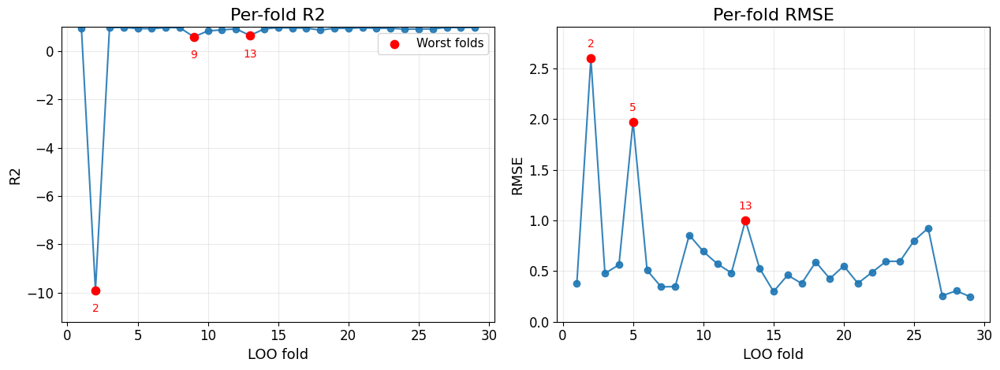


Compact HPO completed trials (top 10 by final inner-CV loss)


,trial,value,mean_val_loss,std_val_loss,drop_rate,learning_rate,weight_decay,state,is_complete
0,45,0.293568,0.243480,0.200351,0.40,0.009167,2.972596e-05,TrialState.COMPLETE,True
1,27,0.296528,0.245965,0.202254,0.00,0.009011,4.437569e-05,TrialState.COMPLETE,True
2,37,0.296788,0.245163,0.206497,0.40,0.003417,3.509869e-04,TrialState.COMPLETE,True
3,28,0.297753,0.245925,0.207310,0.40,0.009455,6.009365e-04,TrialState.COMPLETE,True
4,14,0.298389,0.245726,0.210652,0.00,0.008949,7.831154e-04,TrialState.COMPLETE,True
5,41,0.298581,0.246612,0.207875,0.05,0.009954,4.792195e-04,TrialState.COMPLETE,True
6,2,0.299051,0.247948,0.204411,0.00,0.004450,9.334110e-04,TrialState.COMPLETE,True
7,34,0.299146,0.246786,0.209438,0.20,0.009628,6.118410e-05,TrialState.COMPLETE,True
8,1,0.300596,0.248344,0.209005,0.10,0.005657,2.295512e-04,TrialState.COMPLETE,True
9,17,0.301005,0.248678,0.209308,0.30,0.008689,1.989502e-07,TrialState.COMPLETE,True


Pruning/state counts:
state
TrialState.PRUNED      30
TrialState.COMPLETE    20
Name: count, dtype: int64

Context/cap diagnostics (true context magnitude vs c0 value handed to FluxTransformer/pFBA)
  glucose/O2 transformer context mode: measured
   R_EX_glc__D_e_rev (sign=-1) | true med/mean=3.135200/3.880190 | c0/cap med/mean=3.135200/3.880190
       R_EX_o2_e_rev (sign=-1) | true med/mean=7.953300/9.602582 | c0/cap med/mean=7.953300/9.602582
      R_EX_co2_e_fwd (sign=+1) | true med/mean=7.557200/7.989682 | c0/cap med/mean=7.766049/9.015881
         R_EX_etoh_e (sign=+1) | true med/mean=0.000000/0.011659 | c0/cap med/mean=0.000023/0.012054
           R_EX_ac_e (sign=+1) | true med/mean=0.000000/0.083952 | c0/cap med/mean=0.000274/0.014162


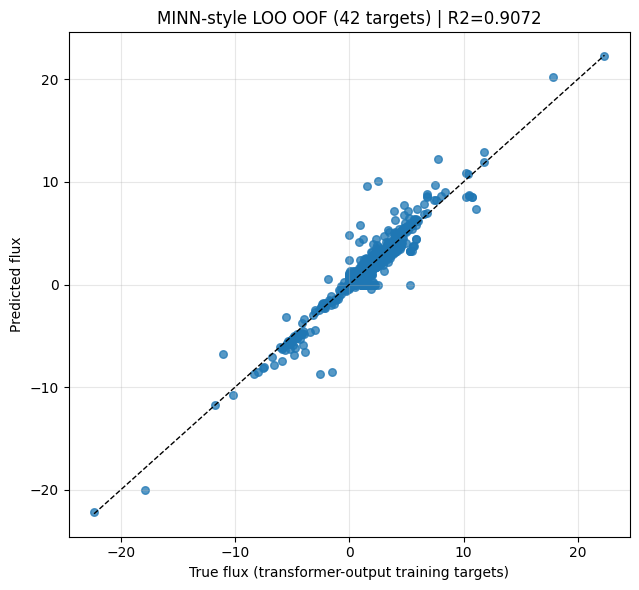

In [29]:
minn_measured_glc_o2_result = run_minn_context_mode_experiment(
    "measured",
    result_key="measured",
    make_canonical=True,
)


### FluxTransformer Reservoir Evaluation: Predicted Glucose/O2 Context

Run the same workflow with the MINN-reservoir-style internal setup where the front MLP predicts all 5 context channels, including glucose and oxygen. Downstream pFBA still uses measured glucose/O2.

In [ ]:
minn_predicted_glc_o2_result = run_minn_context_mode_experiment(
    "predicted",
    result_key="predicted",
    make_canonical=True,
)


### Glucose/O2 Reservoir Context Summary

Summarize the measured-vs-predicted reservoir training runs. The Table 4-style FluxTransformer-to-pFBA evaluation below runs both context modes with predicted CO2, ethanol, and acetate secretion caps.


In [ ]:
if "MINN_CONTEXT_MODE_RESULTS" not in globals() or len(MINN_CONTEXT_MODE_RESULTS) < 2:
    raise RuntimeError("Run both measured and predicted context-mode evaluation cells before comparing.")

comparison_rows = []
for mode_key, res in MINN_CONTEXT_MODE_RESULTS.items():
    best_res_mode = res["best_res"]
    comparison_rows.append({
        "mode": res["mode"],
        "context_measured_sources": ", ".join(res["context_measured_sources"]),
        "context_predicted_sources": ", ".join(res["context_predicted_sources"]),
        "pooled_R2": float(best_res_mode["pooled_R2"]),
        "pooled_MAE": float(best_res_mode["pooled_MAE"]),
        "pooled_RMSE": float(best_res_mode["pooled_RMSE"]),
        "pooled_NE": float(best_res_mode["pooled_NE"]),
        "loo_mean_R2": float(best_res_mode["loo_mean_R2"]),
        "loo_mean_MAE": float(best_res_mode["loo_mean_MAE"]),
        "loo_mean_RMSE": float(best_res_mode["loo_mean_RMSE"]),
        "loo_mean_NE": float(best_res_mode["loo_mean_NE"]),
    })

MINN_CONTEXT_MODE_COMPARISON_DF = pd.DataFrame(comparison_rows).sort_values(
    ["pooled_R2", "pooled_MAE", "pooled_RMSE"],
    ascending=[False, True, True],
).reset_index(drop=True)

print("=== Glucose/O2 FluxTransformer context-mode comparison ===")
print("Primary selection metric: pooled_R2")
display(MINN_CONTEXT_MODE_COMPARISON_DF)

MINN_SELECTED_GLC_O2_CONTEXT_MODE = str(MINN_CONTEXT_MODE_COMPARISON_DF.iloc[0]["mode"])
_apply_minn_context_mode_result(MINN_CONTEXT_MODE_RESULTS[MINN_SELECTED_GLC_O2_CONTEXT_MODE])
print(f"Reservoir summary selected context mode: {MINN_SELECTED_GLC_O2_CONTEXT_MODE} (FluxTransformer-to-pFBA cells below override this explicitly)")


### Baseline pFBA

This cell computes the baseline row for the MINN article Table 4-style comparison adapted to FluxTransformer. It runs pFBA on the unsplit, unpruned iML1515 model using only the measured medium inputs available for every sample: glucose uptake (`R_EX_glc__D_e_rev`) and oxygen uptake (`R_EX_o2_e_rev`).

No reservoir-predicted constraints are added here. The resulting metrics are the reference point for the next FluxTransformer + pFBA cell, where the current comparison variant adds predicted secretion upper caps.

Metrics are computed per sample across the mapped measured fluxes, then summarized as mean and standard deviation across samples: R2, MAE, RMSE, and NE.


In [32]:
# Baseline pFBA (paper-style metrics), without FluxTransformer to pFBA
# Uses ONLY measured glucose and oxygen uptake as inputs.

from pathlib import Path

try:
    from cobra.io import read_sbml_model
    from cobra.flux_analysis import pfba as cobra_pfba
except Exception as e:
    raise ImportError(
        "cobra is required for pFBA baseline evaluation. Install cobra in the notebook environment."
    ) from e

fluxomics_path = Path(MINN_DATA_DIR) / MINN_FLUXOMICS_FILE
if not fluxomics_path.exists():
    raise FileNotFoundError(f"Fluxomics file not found: {fluxomics_path}")

flux_df = pd.read_csv(fluxomics_path)

# pFBA objective is fixed to iML1515 core biomass for this notebook.
PFBA_OBJECTIVE_VARIANT = "core"
PFBA_OBJECTIVE_RXN = "BIOMASS_Ec_iML1515_core_75p37M"
PFBA_BIOMASS_METRIC_TOKEN = f"{PFBA_OBJECTIVE_RXN}_flux"

# Paper-style evaluation flux set: all measured fluxomics columns (exclude experiment id).
metric_source_cols = [c for c in flux_df.columns if c != "experiment"]

# Map MINN split-naming columns into iML1515 FluxTransformer token naming (+ sign conversion).
mapped_metrics = []  # (source_col, token_name, sign)
for src in metric_source_cols:
    tok, sign = _minn_to_flux_token(src, outputs)
    if src.startswith("R_BIOMASS") and PFBA_BIOMASS_METRIC_TOKEN in outputs:
        tok, sign = PFBA_BIOMASS_METRIC_TOKEN, 1.0
    if tok is not None:
        mapped_metrics.append((src, tok, float(sign)))

if not mapped_metrics:
    raise RuntimeError("No metric flux columns could be mapped to iML1515 token space.")
assert not any("WT_75p37M" in tok for _src, tok, _sign in mapped_metrics), "pFBA metric targets unexpectedly use WT biomass."

metric_map_df = pd.DataFrame(mapped_metrics, columns=["source_flux", "mapped_token", "sign_to_iML1515"])

BASELINE_PFBA_INPUT_COLS = ["R_EX_glc__D_e_rev", "R_EX_o2_e_rev"]
FLUXTRANSFORMER_PFBA_PRED_COLS = list(MINN_PFBA_PRED_COL_BY_SOURCE.values())

# Baseline pFBA uses only these two measured uptake columns as pFBA inputs.
for c in BASELINE_PFBA_INPUT_COLS:
    if c not in flux_df.columns:
        raise ValueError(f"Required pFBA input column missing in fluxomics file: {c}")
leaked_pred_cols = [c for c in FLUXTRANSFORMER_PFBA_PRED_COLS if c in flux_df.columns]
assert not leaked_pred_cols, "Baseline pFBA input table unexpectedly contains FluxTransformer prediction columns: " + ", ".join(leaked_pred_cols)

pfba_baseline_input_df = flux_df[["experiment"] + BASELINE_PFBA_INPUT_COLS].copy()
print("Baseline pFBA input columns:", BASELINE_PFBA_INPUT_COLS)
print("FluxTransformer predictions used in baseline pFBA: False")

model_path = Path("./models/iML1515.xml")
if not model_path.exists():
    raise FileNotFoundError(f"SBML model not found: {model_path}")

base_cobra_model = read_sbml_model(str(model_path))
try:
    base_cobra_model.objective = PFBA_OBJECTIVE_RXN
except KeyError as e:
    raise KeyError(f"Expected pFBA objective reaction in iML1515 model: {PFBA_OBJECTIVE_RXN}") from e
print(f"iML1515 pFBA objective: {PFBA_OBJECTIVE_RXN}")

def _metric_row(y_true, y_pred):
    y_true = np.asarray(y_true, dtype=np.float64)
    y_pred = np.asarray(y_pred, dtype=np.float64)

    # Same spirit as MINN paper implementation: per-sample r^2 across fluxes.
    if np.std(y_true) == 0 or np.std(y_pred) == 0:
        R2 = 0.0
    else:
        r = np.corrcoef(y_true, y_pred)[0, 1]
        R2 = 0.0 if np.isnan(r) else float(r * r)

    mae = float(np.mean(np.abs(y_true - y_pred)))
    rmse = float(np.sqrt(np.mean((y_true - y_pred) ** 2)))
    ne = float(np.nan_to_num(np.linalg.norm(y_true - y_pred) / np.linalg.norm(y_true), posinf=0.0, neginf=0.0, nan=0.0))
    return R2, mae, rmse, ne

pred_rows = []
metric_rows = []
failed_samples = []

for _, row in flux_df.iterrows():
    exp_name = row["experiment"]

    # Baseline pFBA: only measured glucose and oxygen uptake are injected.
    glc_uptake = float(row["R_EX_glc__D_e_rev"])  # positive uptake magnitude in MINN split data
    o2_uptake = float(row["R_EX_o2_e_rev"])

    m = base_cobra_model.copy()
    try:
        m.reactions.get_by_id("EX_glc__D_e").lower_bound = -glc_uptake
        m.reactions.get_by_id("EX_o2_e").lower_bound = -o2_uptake
    except KeyError as e:
        raise KeyError("Expected EX_glc__D_e and EX_o2_e reactions in iML1515 model.") from e

    try:
        sol = cobra_pfba(m)
        sol_status = getattr(sol, "status", "optimal")
        if sol_status != "optimal":
            raise RuntimeError(f"pFBA status={sol_status}")
    except Exception as e:
        failed_samples.append((exp_name, str(e)))
        continue

    y_true = []
    y_pred = []
    pred_row = {"experiment": exp_name}

    for src, tok, sign in mapped_metrics:
        rxn_id = tok[:-5] if tok.endswith("_flux") else tok
        pred_val = float(sol.fluxes.get(rxn_id, 0.0)) * sign
        true_val = float(row[src])

        y_true.append(true_val)
        y_pred.append(pred_val)
        pred_row[src] = pred_val

    R2, mae, rmse, ne = _metric_row(y_true, y_pred)
    metric_rows.append({
        "experiment": exp_name,
        "R2": R2,
        "MAE": mae,
        "RMSE": rmse,
        "NE": ne,
    })
    pred_rows.append(pred_row)

pfba_baseline_pred_df = pd.DataFrame(pred_rows)
pfba_baseline_metrics_per_sample_df = pd.DataFrame(metric_rows)

if pfba_baseline_metrics_per_sample_df.empty:
    raise RuntimeError("No successful pFBA samples. Check model feasibility and constraints.")

# Paper-style summary: mean +/- std across samples (population std, like np.std default).
pfba_baseline_summary_df = pd.DataFrame({
    "avg": [
        float(pfba_baseline_metrics_per_sample_df["R2"].mean()),
        float(pfba_baseline_metrics_per_sample_df["MAE"].mean()),
        float(pfba_baseline_metrics_per_sample_df["RMSE"].mean()),
        float(pfba_baseline_metrics_per_sample_df["NE"].mean()),
    ],
    "std": [
        float(pfba_baseline_metrics_per_sample_df["R2"].std(ddof=0)),
        float(pfba_baseline_metrics_per_sample_df["MAE"].std(ddof=0)),
        float(pfba_baseline_metrics_per_sample_df["RMSE"].std(ddof=0)),
        float(pfba_baseline_metrics_per_sample_df["NE"].std(ddof=0)),
    ],
}, index=["R2", "MAE", "RMSE", "NE"])

print("=== Baseline pFBA summary (without FluxTransformer to pFBA) ===")
print(f"Samples evaluated: {len(pfba_baseline_metrics_per_sample_df)}/{len(flux_df)}")
print(f"Metric fluxes mapped: {len(mapped_metrics)} / {len(metric_source_cols)}")
if failed_samples:
    print(f"Failed samples: {len(failed_samples)}")
    for exp_name, msg in failed_samples[:5]:
        print(f"  - {exp_name}: {msg}")

display(pfba_baseline_summary_df)
display(metric_map_df.head(10))



Baseline pFBA input columns: ['R_EX_glc__D_e_rev', 'R_EX_o2_e_rev']
FluxTransformer predictions used in baseline pFBA: False
iML1515 pFBA objective: BIOMASS_Ec_iML1515_core_75p37M
=== Baseline pFBA summary (without FluxTransformer to pFBA) ===
Samples evaluated: 29/29
Metric fluxes mapped: 47 / 47


,avg,std
R2,0.892825,0.132254
MAE,0.495038,0.365933
RMSE,0.832498,0.633807
NE,0.309400,0.373326


,source_flux,mapped_token,sign_to_iML1515
0,R_GLCptspp,GLCptspp_flux,1.0
1,R_PGI_fwd,PGI_flux,1.0
2,R_PFK,PFK_flux,1.0
3,R_FBA_fwd,FBA_flux,1.0
4,R_TPI_fwd,TPI_flux,1.0
5,R_PGK_rev,PGK_flux,-1.0
6,R_GAPD_fwd,GAPD_flux,1.0
7,R_ENO_fwd,ENO_flux,1.0
8,R_PGM_rev,PGM_flux,-1.0
9,R_PYK,PYK_flux,1.0


### FluxTransformer to pFBA: Measured vs Predicted Context

This section adapts the MINN article Table 4 comparison to the FluxTransformer reservoir setup. The actual FluxTransformer-to-pFBA evaluation is split into two run cells:

- measured glucose/O2 FluxTransformer context
- predicted glucose/O2 FluxTransformer context

Both pFBA run cells keep glucose and oxygen as measured uptake lower-bound caps. The predicted CO2, ethanol, and acetate channels are added as secretion upper caps.


In [ ]:
# FluxTransformer to pFBA reusable evaluator.
# The run cells below evaluate measured and predicted glucose/O2 context separately.

from pathlib import Path

def _get_minn_pfba_extra_constraint_sources(extra_constraint_mode):
    if extra_constraint_mode not in MINN_PFBA_EXTRA_CONSTRAINTS_BY_MODE:
        raise ValueError(
            f"Unknown pFBA extra-constraint mode {extra_constraint_mode!r}. "
            f"Expected one of {sorted(MINN_PFBA_EXTRA_CONSTRAINTS_BY_MODE)}."
        )
    return list(MINN_PFBA_EXTRA_CONSTRAINTS_BY_MODE[extra_constraint_mode])


def _apply_minn_fluxtransformer_pfba_result(run_result):
    """Restore one FluxTransformer-to-pFBA run as the canonical downstream state."""
    context_mode = str(run_result["context_mode"]).lower().strip()
    context_result_key = str(run_result.get("context_result_key", context_mode)).lower().strip()
    if "MINN_CONTEXT_MODE_RESULTS" in globals():
        if context_result_key in MINN_CONTEXT_MODE_RESULTS:
            _apply_minn_context_mode_result(MINN_CONTEXT_MODE_RESULTS[context_result_key])
        elif context_mode in MINN_CONTEXT_MODE_RESULTS:
            _apply_minn_context_mode_result(MINN_CONTEXT_MODE_RESULTS[context_mode])

    globals().update({
        "MINN_PFBA_EXTRA_CONSTRAINT_MODE": run_result["extra_constraint_mode"],
        "MINN_PFBA_EXTRA_CONSTRAINT_SOURCE": list(run_result["extra_constraint_sources"]),
        "pred_vin_df": run_result["pred_vin_df"],
        "flux_df_eval": run_result["flux_df_eval"],
        "pfba_extra_constraint_diagnostics_df": run_result["pfba_extra_constraint_diagnostics_df"],
        "pfba_cap_binding_diagnostics_df": run_result.get("pfba_cap_binding_diagnostics_df"),
        "pfba_cap_binding_sample_summary_df": run_result.get("pfba_cap_binding_sample_summary_df"),
        "pfba_cap_binding_result_summary_df": run_result.get("pfba_cap_binding_result_summary_df"),
        "minn_pfba_pred_df": run_result["minn_pfba_pred_df"],
        "minn_pfba_metrics_per_sample_df": run_result["minn_pfba_metrics_per_sample_df"],
        "minn_pfba_summary_df": run_result["minn_pfba_summary_df"],
        "failed_samples_minn_pfba": run_result["failed_samples_minn_pfba"],
        "pfba_prediction_diff_df": run_result["pfba_prediction_diff_df"],
        "max_abs_pfba_prediction_diff": run_result["max_abs_pfba_prediction_diff"],
        "comparison_df": run_result["comparison_df"],
        "MINN_SELECTED_FLUXTRANSFORMER_PFBA_CONTEXT_MODE": context_mode,
        "MINN_SELECTED_FLUXTRANSFORMER_PFBA_RESULT_KEY": run_result["result_key"],
    })
    return run_result


def _build_pfba_cap_binding_diagnostics(
    result_key,
    context_mode,
    extra_constraint_mode,
    extra_sources,
    pred_vin_df,
    flux_df_eval,
    minn_pfba_pred_df,
    minn_pfba_metrics_per_sample_df,
    baseline_pred_df=None,
    tol=None,
):
    """Build cap-level and sample-level diagnostics for FluxTransformer-to-pFBA runs."""
    tol = float(PFBA_EXTRA_CONSTRAINT_TOL if tol is None else tol)
    label_by_source = {
        "R_EX_co2_e_fwd": "CO2",
        "R_EX_etoh_e": "ethanol",
        "R_EX_ac_e": "acetate",
    }
    extra_sources = list(extra_sources)
    if not extra_sources:
        empty = pd.DataFrame()
        return empty, empty, empty

    required_pred_cols = [MINN_PFBA_PRED_COL_BY_SOURCE[src] for src in extra_sources]
    missing_pred_cols = [c for c in required_pred_cols if c not in pred_vin_df.columns]
    missing_target_cols = [src for src in extra_sources if src not in flux_df_eval.columns]
    missing_pfba_cols = [src for src in extra_sources if src not in minn_pfba_pred_df.columns]
    if missing_pred_cols or missing_target_cols or missing_pfba_cols:
        raise KeyError(
            "Cannot build cap-binding diagnostics. Missing columns: "
            f"pred={missing_pred_cols}, target={missing_target_cols}, pfba={missing_pfba_cols}"
        )

    target_df = flux_df_eval[["experiment"] + extra_sources].rename(
        columns={src: f"{src}__target" for src in extra_sources}
    )
    solved_df = minn_pfba_pred_df[["experiment"] + extra_sources].rename(
        columns={src: f"{src}__pfba" for src in extra_sources}
    )
    merged = pred_vin_df[["experiment"] + required_pred_cols].merge(target_df, on="experiment", how="inner")
    merged = merged.merge(solved_df, on="experiment", how="inner")

    baseline_available = (
        baseline_pred_df is not None
        and all(src in baseline_pred_df.columns for src in extra_sources)
        and "experiment" in baseline_pred_df.columns
    )
    if baseline_available:
        baseline_df = baseline_pred_df[["experiment"] + extra_sources].rename(
            columns={src: f"{src}__baseline" for src in extra_sources}
        )
        merged = merged.merge(baseline_df, on="experiment", how="left")

    cap_rows = []
    for src in extra_sources:
        pred_col = MINN_PFBA_PRED_COL_BY_SOURCE[src]
        for _, row in merged.iterrows():
            cap_pred = float(row[pred_col])
            target_flux = float(row[f"{src}__target"])
            pfba_flux = float(row[f"{src}__pfba"])
            baseline_flux = (
                float(row[f"{src}__baseline"])
                if baseline_available and pd.notna(row.get(f"{src}__baseline", np.nan))
                else np.nan
            )
            cap_error = cap_pred - target_flux
            final_error = pfba_flux - target_flux
            baseline_error = baseline_flux - target_flux if np.isfinite(baseline_flux) else np.nan
            cap_slack = cap_pred - pfba_flux
            cap_binding = bool(abs(cap_slack) <= tol)
            cap_too_low = bool(cap_pred < target_flux - tol)
            cap_too_high = bool(cap_pred > target_flux + tol)
            binding_low_cap = bool(cap_binding and cap_too_low)
            binding_high_cap = bool(cap_binding and cap_too_high)
            nonbinding_bad_final = bool((not cap_binding) and abs(final_error) > tol)
            cap_improvement_abs_delta = (
                abs(baseline_error) - abs(final_error)
                if np.isfinite(baseline_error)
                else np.nan
            )
            cap_helped_vs_baseline = bool(np.isfinite(cap_improvement_abs_delta) and cap_improvement_abs_delta > tol)
            cap_worsened_vs_baseline = bool(np.isfinite(cap_improvement_abs_delta) and cap_improvement_abs_delta < -tol)

            if binding_low_cap:
                diagnosis = "binding low cap: possible overconstraint"
            elif binding_high_cap and abs(final_error) > tol:
                diagnosis = "binding high cap: cap permits high secretion"
            elif nonbinding_bad_final:
                diagnosis = "nonbinding: pFBA/objective or other constraints"
            elif abs(cap_error) > tol and not cap_binding:
                diagnosis = "cap prediction off but nonbinding"
            elif abs(final_error) <= tol:
                diagnosis = "cap target matched"
            else:
                diagnosis = "mixed"

            cap_rows.append({
                "result_key": result_key,
                "context_mode": context_mode,
                "extra_constraint_mode": extra_constraint_mode,
                "experiment": row["experiment"],
                "source": src,
                "source_label": label_by_source.get(src, src),
                "cap_pred": cap_pred,
                "target_flux": target_flux,
                "pfba_flux": pfba_flux,
                "baseline_flux": baseline_flux,
                "cap_error": cap_error,
                "abs_cap_error": abs(cap_error),
                "final_error": final_error,
                "abs_final_error": abs(final_error),
                "baseline_error": baseline_error,
                "abs_baseline_error": abs(baseline_error) if np.isfinite(baseline_error) else np.nan,
                "cap_slack": cap_slack,
                "abs_cap_slack": abs(cap_slack),
                "cap_binding": cap_binding,
                "cap_too_low": cap_too_low,
                "cap_too_high": cap_too_high,
                "binding_low_cap": binding_low_cap,
                "binding_high_cap": binding_high_cap,
                "nonbinding_bad_final": nonbinding_bad_final,
                "cap_improvement_abs_delta": cap_improvement_abs_delta,
                "cap_worsening_abs_delta": -cap_improvement_abs_delta if np.isfinite(cap_improvement_abs_delta) else np.nan,
                "cap_helped_vs_baseline": cap_helped_vs_baseline,
                "cap_worsened_vs_baseline": cap_worsened_vs_baseline,
                "diagnosis": diagnosis,
            })

    cap_df = pd.DataFrame(cap_rows)
    if cap_df.empty:
        empty = pd.DataFrame()
        return cap_df, empty, empty

    grouped = cap_df.groupby(["result_key", "context_mode", "extra_constraint_mode", "experiment"], as_index=False)
    sample_summary = grouped.agg(
        n_caps=("source", "size"),
        cap_binding_count=("cap_binding", "sum"),
        binding_low_cap_count=("binding_low_cap", "sum"),
        binding_high_cap_count=("binding_high_cap", "sum"),
        nonbinding_bad_final_count=("nonbinding_bad_final", "sum"),
        cap_helped_count=("cap_helped_vs_baseline", "sum"),
        cap_worsened_count=("cap_worsened_vs_baseline", "sum"),
        mean_abs_cap_error=("abs_cap_error", "mean"),
        max_abs_cap_error=("abs_cap_error", "max"),
        mean_abs_final_cap_error=("abs_final_error", "mean"),
        max_abs_final_cap_error=("abs_final_error", "max"),
        mean_abs_baseline_cap_error=("abs_baseline_error", "mean"),
        max_abs_baseline_cap_error=("abs_baseline_error", "max"),
        mean_abs_cap_slack=("abs_cap_slack", "mean"),
    )

    if minn_pfba_metrics_per_sample_df is not None and not minn_pfba_metrics_per_sample_df.empty:
        metric_cols = [c for c in ["experiment", "R2", "MAE", "RMSE", "NE"] if c in minn_pfba_metrics_per_sample_df.columns]
        sample_summary = sample_summary.merge(
            minn_pfba_metrics_per_sample_df[metric_cols],
            on="experiment",
            how="left",
        )

    def _sample_diagnosis(row):
        if int(row.get("binding_low_cap_count", 0)) > 0:
            return "cap overconstraint possible"
        if int(row.get("cap_worsened_count", 0)) > int(row.get("cap_helped_count", 0)):
            return "caps worsened versus baseline"
        if int(row.get("nonbinding_bad_final_count", 0)) > 0:
            return "bad cap-target error is nonbinding"
        if float(row.get("max_abs_cap_error", 0.0)) > tol:
            return "reservoir cap prediction differs"
        return "no obvious cap issue"

    sample_summary["cap_binding_diagnosis"] = sample_summary.apply(_sample_diagnosis, axis=1)

    result_summary = cap_df.groupby(["result_key", "context_mode", "extra_constraint_mode"], as_index=False).agg(
        cap_rows=("source", "size"),
        binding_rows=("cap_binding", "sum"),
        binding_low_cap_rows=("binding_low_cap", "sum"),
        binding_high_cap_rows=("binding_high_cap", "sum"),
        nonbinding_bad_final_rows=("nonbinding_bad_final", "sum"),
        cap_helped_rows=("cap_helped_vs_baseline", "sum"),
        cap_worsened_rows=("cap_worsened_vs_baseline", "sum"),
        mean_abs_cap_error=("abs_cap_error", "mean"),
        mean_abs_final_cap_error=("abs_final_error", "mean"),
        mean_abs_baseline_cap_error=("abs_baseline_error", "mean"),
    )

    return cap_df, sample_summary, result_summary


def run_fluxtransformer_to_pfba_context_mode(
    context_mode,
    extra_constraint_mode=None,
    result_key=None,
    make_canonical=True,
    context_result_key=None,
):
    """Run Table 4-style FluxTransformer-to-pFBA for one glucose/O2 context mode."""
    context_mode = str(context_mode).lower().strip()
    if extra_constraint_mode is None:
        extra_constraint_mode = MINN_PFBA_EXTRA_CONSTRAINT_MODE
    extra_constraint_mode = str(extra_constraint_mode).lower().strip()
    extra_sources = _get_minn_pfba_extra_constraint_sources(extra_constraint_mode)
    result_key = str(result_key or f"{context_mode}_{extra_constraint_mode}")
    context_result_key = str(context_result_key or context_mode).lower().strip()

    if "MINN_CONTEXT_MODE_RESULTS" not in globals() or context_result_key not in MINN_CONTEXT_MODE_RESULTS:
        raise RuntimeError(
            f"Run the stored reservoir evaluation {context_result_key!r} before FluxTransformer-to-pFBA."
        )
    if "_apply_minn_context_mode_result" not in globals():
        raise RuntimeError("Missing _apply_minn_context_mode_result. Re-run the reservoir training setup cells.")
    if "base_cobra_model" not in globals() or "cobra_pfba" not in globals():
        raise RuntimeError("Run the baseline pFBA cell before FluxTransformer-to-pFBA.")
    if "oof_pred_constraints" not in MINN_CONTEXT_MODE_RESULTS[context_result_key].get("canonical", {}):
        raise RuntimeError(f"Stored context-mode result {context_result_key!r} has no OOF constraints.")

    _apply_minn_context_mode_result(MINN_CONTEXT_MODE_RESULTS[context_result_key])

    print(
        f"Running FluxTransformer-to-pFBA with glucose/O2 context mode={context_mode!r} "
        f"and extra_constraint_mode={extra_constraint_mode!r}"
    )
    print("pFBA glucose/O2 source: measured uptake columns")
    print("pFBA extra predicted constraints:", extra_sources)

    tr_df = pd.read_csv(Path(MINN_DATA_DIR) / "transcriptomics.csv")
    pr_df = pd.read_csv(Path(MINN_DATA_DIR) / "proteomics.csv")
    fl_df = pd.read_csv(Path(MINN_DATA_DIR) / MINN_FLUXOMICS_FILE)

    if "PFBA_EXTRA_CONSTRAINT_TOL" not in globals():
        globals()["PFBA_EXTRA_CONSTRAINT_TOL"] = 1e-6

    x_df_tmp = tr_df.merge(pr_df, on="experiment", how="left")
    x_df_tmp = x_df_tmp.merge(fl_df[["experiment"] + MINN_INPUT_FLUX_COLS], on="experiment", how="left")
    x_df_tmp = x_df_tmp[x_df_tmp["experiment"].isin(fl_df["experiment"])].reset_index(drop=True)
    exp_order_oof = x_df_tmp["experiment"].tolist()

    if len(exp_order_oof) != oof_pred_constraints.shape[0]:
        raise RuntimeError(
            f"Experiment/OOF length mismatch: {len(exp_order_oof)} vs {oof_pred_constraints.shape[0]}."
        )
    if oof_pred_constraints.shape[1] != len(MINN_RESERVOIR_CONTEXT_SOURCE):
        raise RuntimeError(
            f"Expected {len(MINN_RESERVOIR_CONTEXT_SOURCE)} reservoir-context predictions in oof_pred_constraints, "
            f"got {oof_pred_constraints.shape[1]}. Re-run the MINN training cell after updating the reservoir setup."
        )

    src_to_idx = {s: i for i, s in enumerate(MINN_RESERVOIR_CONTEXT_SOURCE)}
    for s in extra_sources:
        if s not in src_to_idx:
            raise ValueError(f"Missing expected learned source in MINN_RESERVOIR_CONTEXT_SOURCE: {s}")

    pred_vin_data = {"experiment": exp_order_oof}
    for src in extra_sources:
        pred_col = MINN_PFBA_PRED_COL_BY_SOURCE[src]
        pred_vin_data[pred_col] = np.maximum(0.0, oof_pred_constraints[:, src_to_idx[src]])
    pred_vin_df = pd.DataFrame(pred_vin_data)

    pfba_extra_constraint_diagnostics_df = None
    if "pfba_baseline_pred_df" in globals():
        baseline_extra_cols = list(extra_sources)
        baseline_extra_available = [c for c in baseline_extra_cols if c in pfba_baseline_pred_df.columns]
        if len(baseline_extra_available) == len(baseline_extra_cols):
            pfba_extra_constraint_diagnostics_df = pred_vin_df.merge(
                pfba_baseline_pred_df[["experiment"] + baseline_extra_cols],
                on="experiment",
                how="left",
            )
            print(f"FluxTransformer pFBA extra-constraint mode: {extra_constraint_mode}")
            print("Predicted pFBA extra constraints vs baseline pFBA solution:")
            label_by_source = {
                "R_EX_co2_e_fwd": "CO2",
                "R_EX_etoh_e": "ethanol",
                "R_EX_ac_e": "acetate",
            }
            for src in baseline_extra_cols:
                pred_col = MINN_PFBA_PRED_COL_BY_SOURCE[src]
                diff_col = f"{src}_pred_minus_baseline"
                pfba_extra_constraint_diagnostics_df[diff_col] = (
                    pfba_extra_constraint_diagnostics_df[pred_col] - pfba_extra_constraint_diagnostics_df[src]
                )
                abs_delta = pfba_extra_constraint_diagnostics_df[diff_col].abs()
                n_changed = int((abs_delta > PFBA_EXTRA_CONSTRAINT_TOL).sum())
                print(
                    f"  {label_by_source[src]}: {n_changed}/{len(pfba_extra_constraint_diagnostics_df)} "
                    f"predicted values differ from baseline pFBA flux; max abs delta={float(abs_delta.max()):.6g}"
                )

    flux_df_eval = fl_df.merge(pred_vin_df, on="experiment", how="inner")
    if flux_df_eval.empty:
        raise RuntimeError("Empty merged dataframe for FluxTransformer to pFBA evaluation.")

    if "mapped_metrics" not in globals() or not mapped_metrics:
        metric_source_cols = [c for c in fl_df.columns if c != "experiment"]
        mapped_metrics_local = []
        for src in metric_source_cols:
            tok, sign = _minn_to_flux_token(src, outputs)
            if src.startswith("R_BIOMASS") and "PFBA_BIOMASS_METRIC_TOKEN" in globals() and PFBA_BIOMASS_METRIC_TOKEN in outputs:
                tok, sign = PFBA_BIOMASS_METRIC_TOKEN, 1.0
            if tok is not None:
                mapped_metrics_local.append((src, tok, float(sign)))
        globals()["mapped_metrics"] = mapped_metrics_local

    if not mapped_metrics:
        raise RuntimeError("No mapped metrics available for FluxTransformer to pFBA evaluation.")

    metric_row_fn = globals().get("_metric_row")
    if metric_row_fn is None:
        def metric_row_fn(y_true, y_pred):
            y_true = np.asarray(y_true, dtype=np.float64)
            y_pred = np.asarray(y_pred, dtype=np.float64)
            if np.std(y_true) == 0 or np.std(y_pred) == 0:
                R2 = 0.0
            else:
                r = np.corrcoef(y_true, y_pred)[0, 1]
                R2 = 0.0 if np.isnan(r) else float(r * r)
            mae = float(np.mean(np.abs(y_true - y_pred)))
            rmse = float(np.sqrt(np.mean((y_true - y_pred) ** 2)))
            ne = float(np.nan_to_num(np.linalg.norm(y_true - y_pred) / np.linalg.norm(y_true), posinf=0.0, neginf=0.0, nan=0.0))
            return R2, mae, rmse, ne
        globals()["_metric_row"] = metric_row_fn

    def _set_nonnegative_exchange_upper_cap(rxn, value):
        cap = max(0.0, float(value))
        rxn.lower_bound = max(0.0, min(float(rxn.lower_bound), cap))
        rxn.upper_bound = cap

    pred_rows_minn_pfba = []
    metric_rows_minn_pfba = []
    failed_samples_minn_pfba = []

    for _, row in flux_df_eval.iterrows():
        exp_name = row["experiment"]

        glc_uptake_meas = float(row["R_EX_glc__D_e_rev"])
        o2_uptake_meas = float(row["R_EX_o2_e_rev"])

        m = base_cobra_model.copy()
        try:
            m.reactions.get_by_id("EX_glc__D_e").lower_bound = -glc_uptake_meas
            m.reactions.get_by_id("EX_o2_e").lower_bound = -o2_uptake_meas

            for src in extra_sources:
                pred_value = float(row[MINN_PFBA_PRED_COL_BY_SOURCE[src]])
                rxn = m.reactions.get_by_id(MINN_PFBA_RXN_BY_SOURCE[src])
                _set_nonnegative_exchange_upper_cap(rxn, pred_value)
        except KeyError as e:
            raise KeyError("Expected measured-input and selected extra-constraint reactions in iML1515 model.") from e

        try:
            sol = cobra_pfba(m)
            sol_status = getattr(sol, "status", "optimal")
            if sol_status != "optimal":
                raise RuntimeError(f"pFBA status={sol_status}")
        except Exception as e:
            failed_samples_minn_pfba.append((exp_name, str(e)))
            continue

        y_true = []
        y_pred = []
        pred_row = {"experiment": exp_name}
        for src, tok, sign in mapped_metrics:
            rxn_id = tok[:-5] if tok.endswith("_flux") else tok
            pred_val = float(sol.fluxes.get(rxn_id, 0.0)) * sign
            true_val = float(row[src])
            y_true.append(true_val)
            y_pred.append(pred_val)
            pred_row[src] = pred_val

        R2, mae, rmse, ne = metric_row_fn(y_true, y_pred)
        metric_rows_minn_pfba.append({
            "experiment": exp_name,
            "R2": R2,
            "MAE": mae,
            "RMSE": rmse,
            "NE": ne,
        })
        pred_rows_minn_pfba.append(pred_row)

    minn_pfba_pred_df = pd.DataFrame(pred_rows_minn_pfba)
    minn_pfba_metrics_per_sample_df = pd.DataFrame(metric_rows_minn_pfba)

    if minn_pfba_metrics_per_sample_df.empty:
        raise RuntimeError("No successful FluxTransformer to pFBA samples. Check constraint feasibility.")

    minn_pfba_summary_df = pd.DataFrame({
        "avg": [
            float(minn_pfba_metrics_per_sample_df["R2"].mean()),
            float(minn_pfba_metrics_per_sample_df["MAE"].mean()),
            float(minn_pfba_metrics_per_sample_df["RMSE"].mean()),
            float(minn_pfba_metrics_per_sample_df["NE"].mean()),
        ],
        "std": [
            float(minn_pfba_metrics_per_sample_df["R2"].std(ddof=0)),
            float(minn_pfba_metrics_per_sample_df["MAE"].std(ddof=0)),
            float(minn_pfba_metrics_per_sample_df["RMSE"].std(ddof=0)),
            float(minn_pfba_metrics_per_sample_df["NE"].std(ddof=0)),
        ],
    }, index=["R2", "MAE", "RMSE", "NE"])

    pfba_prediction_diff_df = None
    max_abs_pfba_prediction_diff = None
    if "pfba_baseline_pred_df" in globals():
        common_experiments = sorted(set(pfba_baseline_pred_df["experiment"]).intersection(minn_pfba_pred_df["experiment"]))
        common_pred_cols = [
            c for c in minn_pfba_pred_df.columns
            if c != "experiment" and c in pfba_baseline_pred_df.columns
        ]
        if common_experiments and common_pred_cols:
            base_cmp_pred = pfba_baseline_pred_df.set_index("experiment").loc[common_experiments, common_pred_cols]
            ft_cmp_pred = minn_pfba_pred_df.set_index("experiment").loc[common_experiments, common_pred_cols]
            pfba_prediction_diff_df = (ft_cmp_pred - base_cmp_pred).reset_index()
            max_abs_pfba_prediction_diff = float((ft_cmp_pred - base_cmp_pred).abs().to_numpy().max())
            print(f"Max abs prediction difference vs baseline pFBA: {max_abs_pfba_prediction_diff:.6g}")

    pfba_cap_binding_diagnostics_df, pfba_cap_binding_sample_summary_df, pfba_cap_binding_result_summary_df = (
        _build_pfba_cap_binding_diagnostics(
            result_key=result_key,
            context_mode=context_mode,
            extra_constraint_mode=extra_constraint_mode,
            extra_sources=extra_sources,
            pred_vin_df=pred_vin_df,
            flux_df_eval=flux_df_eval,
            minn_pfba_pred_df=minn_pfba_pred_df,
            minn_pfba_metrics_per_sample_df=minn_pfba_metrics_per_sample_df,
            baseline_pred_df=globals().get("pfba_baseline_pred_df"),
            tol=PFBA_EXTRA_CONSTRAINT_TOL,
        )
    )
    if not pfba_cap_binding_result_summary_df.empty:
        print("=== Cap-binding diagnostics summary ===")
        display(pfba_cap_binding_result_summary_df)

    print(f"=== FluxTransformer to pFBA summary ({context_mode}, {extra_constraint_mode}) ===")
    print(f"Samples evaluated: {len(minn_pfba_metrics_per_sample_df)}/{len(flux_df_eval)}")
    if failed_samples_minn_pfba:
        print(f"Failed samples: {len(failed_samples_minn_pfba)}")
        for exp_name, msg in failed_samples_minn_pfba[:5]:
            print(f"  - {exp_name}: {msg}")

    display(minn_pfba_summary_df)
    display(pred_vin_df.head(10))

    comparison_df = None
    if "pfba_baseline_summary_df" in globals():
        metric_order = ["R2", "MAE", "RMSE", "NE"]
        comparison_df = pd.DataFrame(
            {
                "pFBA": [
                    f"{float(pfba_baseline_summary_df.loc[m, 'avg']):.6f} +/- {float(pfba_baseline_summary_df.loc[m, 'std']):.6f}"
                    for m in metric_order
                ],
                f"FluxTransformer to pFBA ({context_mode}, {extra_constraint_mode})": [
                    f"{float(minn_pfba_summary_df.loc[m, 'avg']):.6f} +/- {float(minn_pfba_summary_df.loc[m, 'std']):.6f}"
                    for m in metric_order
                ],
            },
            index=metric_order,
        )
        print("=== Average metric comparison ===")
        display(comparison_df)

    run_result = {
        "result_key": result_key,
        "context_mode": context_mode,
        "context_result_key": context_result_key,
        "extra_constraint_mode": extra_constraint_mode,
        "extra_constraint_sources": list(extra_sources),
        "pred_vin_df": pred_vin_df,
        "flux_df_eval": flux_df_eval,
        "pfba_extra_constraint_diagnostics_df": pfba_extra_constraint_diagnostics_df,
        "pfba_cap_binding_diagnostics_df": pfba_cap_binding_diagnostics_df,
        "pfba_cap_binding_sample_summary_df": pfba_cap_binding_sample_summary_df,
        "pfba_cap_binding_result_summary_df": pfba_cap_binding_result_summary_df,
        "minn_pfba_pred_df": minn_pfba_pred_df,
        "minn_pfba_metrics_per_sample_df": minn_pfba_metrics_per_sample_df,
        "minn_pfba_summary_df": minn_pfba_summary_df,
        "failed_samples_minn_pfba": failed_samples_minn_pfba,
        "pfba_prediction_diff_df": pfba_prediction_diff_df,
        "max_abs_pfba_prediction_diff": max_abs_pfba_prediction_diff,
        "comparison_df": comparison_df,
    }

    if "MINN_FLUXTRANSFORMER_PFBA_RESULTS" not in globals():
        globals()["MINN_FLUXTRANSFORMER_PFBA_RESULTS"] = {}
    MINN_FLUXTRANSFORMER_PFBA_RESULTS[result_key] = run_result

    if make_canonical:
        _apply_minn_fluxtransformer_pfba_result(run_result)

    return run_result


### FluxTransformer to pFBA: Measured Context + CO2/Ethanol/Acetate Caps

Run the Table 4-style FluxTransformer-to-pFBA evaluation using the measured glucose/O2 context-mode reservoir result. pFBA still uses measured glucose/O2 uptake bounds and adds predicted CO2, ethanol, and acetate secretion caps.


In [34]:
minn_pfba_measured_result_key = f"measured_{MINN_PFBA_EXTRA_CONSTRAINT_MODE}"
minn_pfba_measured_capmode_result = run_fluxtransformer_to_pfba_context_mode(
    "measured",
    extra_constraint_mode=MINN_PFBA_EXTRA_CONSTRAINT_MODE,
    result_key=minn_pfba_measured_result_key,
    make_canonical=True,
)


Running FluxTransformer-to-pFBA with glucose/O2 context mode='measured' and extra_constraint_mode='co2_etoh_ac_cap'
pFBA glucose/O2 source: measured uptake columns
pFBA extra predicted constraints: ['R_EX_co2_e_fwd', 'R_EX_etoh_e', 'R_EX_ac_e']
FluxTransformer pFBA extra-constraint mode: co2_etoh_ac_cap
Predicted pFBA extra constraints vs baseline pFBA solution:
  CO2: 29/29 predicted values differ from baseline pFBA flux; max abs delta=3.7515
  ethanol: 21/29 predicted values differ from baseline pFBA flux; max abs delta=0.292596
  acetate: 26/29 predicted values differ from baseline pFBA flux; max abs delta=6.44231
Max abs prediction difference vs baseline pFBA: 6.44231
=== Cap-binding diagnostics summary ===


,result_key,context_mode,extra_constraint_mode,cap_rows,binding_rows,binding_low_cap_rows,binding_high_cap_rows,nonbinding_bad_final_rows,cap_helped_rows,cap_worsened_rows,mean_abs_cap_error,mean_abs_final_cap_error,mean_abs_baseline_cap_error
0,measured_co2_etoh_ac_cap,measured,co2_etoh_ac_cap,87,38,12,18,15,28,8,0.499037,0.382458,0.724639


=== FluxTransformer to pFBA summary (measured, co2_etoh_ac_cap) ===
Samples evaluated: 29/29


,avg,std
R2,0.870880,0.135621
MAE,0.520665,0.347119
RMSE,0.859572,0.566047
NE,0.319484,0.318528


,experiment,R_EX_co2_e_fwd_pred,R_EX_etoh_e_pred,R_EX_ac_e_pred
0,REF,7.196062,3.911382e-09,2.135542e-07
1,WT_0.1h-1,2.735060,2.925956e-01,2.671041e-01
2,WT_0.4h-1,10.976580,1.191109e-06,9.461711e-05
3,WT_0.5h-1,15.398438,6.227860e-07,2.111270e-05
4,WT_0.7h-1,29.984375,6.172021e-15,1.555840e-09
5,galM,7.672341,1.183980e-03,7.488613e-03
6,glk,10.031294,3.225592e-04,1.783786e-03
7,pgm,8.836083,2.350368e-06,3.555991e-06
8,pgi,4.801222,1.038186e-02,3.570871e-02
9,pfkA,5.916760,8.030107e-05,4.272992e-04


=== Average metric comparison ===


,pFBA,"FluxTransformer to pFBA (measured, co2_etoh_ac_cap)"
R2,0.892825 +/- 0.132254,0.870880 +/- 0.135621
MAE,0.495038 +/- 0.365933,0.520665 +/- 0.347119
RMSE,0.832498 +/- 0.633807,0.859572 +/- 0.566047
NE,0.309400 +/- 0.373326,0.319484 +/- 0.318528


### FluxTransformer to pFBA: Predicted Context + CO2/Ethanol/Acetate Caps

Run the same Table 4-style FluxTransformer-to-pFBA evaluation using the predicted glucose/O2 context-mode reservoir result. pFBA glucose/O2 bounds remain measured, and predicted CO2, ethanol, and acetate are added as secretion caps.


In [ ]:
minn_pfba_predicted_result_key = f"predicted_{MINN_PFBA_EXTRA_CONSTRAINT_MODE}"
minn_pfba_predicted_capmode_result = run_fluxtransformer_to_pfba_context_mode(
    "predicted",
    extra_constraint_mode=MINN_PFBA_EXTRA_CONSTRAINT_MODE,
    result_key=minn_pfba_predicted_result_key,
    make_canonical=True,
)


### FluxTransformer to pFBA Context-Mode Comparison

Compare baseline pFBA against the measured-context and predicted-context FluxTransformer-to-pFBA runs for the currently selected extra-cap mode.


In [ ]:
required_pfba_result_keys = [
    f"measured_{MINN_PFBA_EXTRA_CONSTRAINT_MODE}",
    f"predicted_{MINN_PFBA_EXTRA_CONSTRAINT_MODE}",
]

if "MINN_FLUXTRANSFORMER_PFBA_RESULTS" not in globals():
    raise RuntimeError("Run both FluxTransformer-to-pFBA context-mode cells before comparing.")

missing = [k for k in required_pfba_result_keys if k not in MINN_FLUXTRANSFORMER_PFBA_RESULTS]
if missing:
    raise RuntimeError(f"Missing FluxTransformer-to-pFBA result(s): {missing}. Run those cells first.")

metric_order = ["R2", "MAE", "RMSE", "NE"]
rows = []
for key in required_pfba_result_keys:
    res = MINN_FLUXTRANSFORMER_PFBA_RESULTS[key]
    summary = res["minn_pfba_summary_df"]
    metrics_df = res["minn_pfba_metrics_per_sample_df"]
    flux_df_eval = res["flux_df_eval"]
    row = {
        "result_key": key,
        "context_mode": res["context_mode"],
        "extra_constraint_mode": res["extra_constraint_mode"],
        "extra_constraints": ", ".join(res["extra_constraint_sources"]),
        "samples": f"{len(metrics_df)}/{len(flux_df_eval)}",
        "failed_samples": len(res["failed_samples_minn_pfba"]),
    }
    for metric in metric_order:
        row[f"{metric}_avg"] = float(summary.loc[metric, "avg"])
        row[f"{metric}_std"] = float(summary.loc[metric, "std"])
    rows.append(row)

MINN_FLUXTRANSFORMER_PFBA_COMPARISON_DF = pd.DataFrame(rows)
MINN_FLUXTRANSFORMER_PFBA_COMPARISON_DF = MINN_FLUXTRANSFORMER_PFBA_COMPARISON_DF.sort_values(
    ["R2_avg", "MAE_avg"],
    ascending=[False, True],
).reset_index(drop=True)

print(f"=== FluxTransformer to pFBA context-mode comparison ({MINN_PFBA_EXTRA_CONSTRAINT_MODE}) ===")
display(MINN_FLUXTRANSFORMER_PFBA_COMPARISON_DF)

if "pfba_baseline_summary_df" in globals():
    avg_comparison_cols = {
        "pFBA": [
            f"{float(pfba_baseline_summary_df.loc[m, 'avg']):.6f} +/- {float(pfba_baseline_summary_df.loc[m, 'std']):.6f}"
            for m in metric_order
        ],
    }
    for key in required_pfba_result_keys:
        res = MINN_FLUXTRANSFORMER_PFBA_RESULTS[key]
        summary = res["minn_pfba_summary_df"]
        label = f"FluxTransformer to pFBA ({res['context_mode']}, {res['extra_constraint_mode']})"
        avg_comparison_cols[label] = [
            f"{float(summary.loc[m, 'avg']):.6f} +/- {float(summary.loc[m, 'std']):.6f}"
            for m in metric_order
        ]

    fluxtransformer_pfba_average_comparison_df = pd.DataFrame(avg_comparison_cols, index=metric_order)
    print("=== Average metric comparison ===")
    display(fluxtransformer_pfba_average_comparison_df)

MINN_SELECTED_FLUXTRANSFORMER_PFBA_RESULT_KEY = str(MINN_FLUXTRANSFORMER_PFBA_COMPARISON_DF.iloc[0]["result_key"])
_apply_minn_fluxtransformer_pfba_result(
    MINN_FLUXTRANSFORMER_PFBA_RESULTS[MINN_SELECTED_FLUXTRANSFORMER_PFBA_RESULT_KEY]
)
print(
    "Selected FluxTransformer-to-pFBA context mode for downstream cells: "
    f"{MINN_SELECTED_FLUXTRANSFORMER_PFBA_CONTEXT_MODE}"
)


### FluxTransformer to pFBA: Final Comparison

Compare baseline pFBA with the measured-context and predicted-context FluxTransformer-to-pFBA variants.


In [ ]:
required_final_pfba_keys = {
    "FluxTransformer to pFBA (measured co2_etoh_ac_cap)": "measured_co2_etoh_ac_cap",
    "FluxTransformer to pFBA (predicted co2_etoh_ac_cap)": "predicted_co2_etoh_ac_cap",
}

if "pfba_baseline_summary_df" not in globals():
    raise RuntimeError("Run the baseline pFBA cell before the final comparison.")
if "MINN_FLUXTRANSFORMER_PFBA_RESULTS" not in globals():
    raise RuntimeError("Run the FluxTransformer-to-pFBA cells before the final comparison.")

missing_final = [key for key in required_final_pfba_keys.values() if key not in MINN_FLUXTRANSFORMER_PFBA_RESULTS]
if missing_final:
    raise RuntimeError(f"Missing final FluxTransformer-to-pFBA result(s): {missing_final}")

metric_order = ["R2", "MAE", "RMSE", "NE"]
final_average_cols = {
    "pFBA": [
        f"{float(pfba_baseline_summary_df.loc[m, 'avg']):.6f} +/- {float(pfba_baseline_summary_df.loc[m, 'std']):.6f}"
        for m in metric_order
    ],
}

for label, key in required_final_pfba_keys.items():
    summary = MINN_FLUXTRANSFORMER_PFBA_RESULTS[key]["minn_pfba_summary_df"]
    final_average_cols[label] = [
        f"{float(summary.loc[m, 'avg']):.6f} +/- {float(summary.loc[m, 'std']):.6f}"
        for m in metric_order
    ]

MINN_FINAL_PFBA_AVERAGE_COMPARISON_DF = pd.DataFrame(final_average_cols, index=metric_order)
print("=== Final average metric comparison ===")
display(MINN_FINAL_PFBA_AVERAGE_COMPARISON_DF)

final_rows = []
for label, key in required_final_pfba_keys.items():
    res = MINN_FLUXTRANSFORMER_PFBA_RESULTS[key]
    summary = res["minn_pfba_summary_df"]
    final_rows.append({
        "label": label,
        "result_key": key,
        "context_mode": res["context_mode"],
        "context_result_key": res.get("context_result_key", res["context_mode"]),
        "extra_constraint_mode": res["extra_constraint_mode"],
        "extra_constraints": ", ".join(res["extra_constraint_sources"]),
        "R2_avg": float(summary.loc["R2", "avg"]),
        "MAE_avg": float(summary.loc["MAE", "avg"]),
        "RMSE_avg": float(summary.loc["RMSE", "avg"]),
        "NE_avg": float(summary.loc["NE", "avg"]),
        "failed_samples": len(res["failed_samples_minn_pfba"]),
    })

MINN_FINAL_PFBA_RESULT_SUMMARY_DF = pd.DataFrame(final_rows).sort_values(
    ["R2_avg", "MAE_avg", "RMSE_avg", "NE_avg"],
    ascending=[False, True, True, True],
).reset_index(drop=True)
display(MINN_FINAL_PFBA_RESULT_SUMMARY_DF)


### FluxTransformer to pFBA: Per-Sample Cap-Binding Diagnostics

Inspect whether poor samples are caused by reservoir cap predictions or by the downstream pFBA solve. A cap is marked as binding when the solved secretion flux reaches the predicted upper cap. `binding_low_cap` is the main overconstraint signal: the predicted cap is below the fitted target and pFBA is forced to that cap.

In [ ]:
MINN_CAP_BINDING_TOP_N = 12
MINN_CAP_BINDING_WORSENED_TOP_N = 20

if "_build_pfba_cap_binding_diagnostics" not in globals():
    raise RuntimeError("Run the FluxTransformer-to-pFBA reusable evaluator cell before cap-binding diagnostics.")
if "MINN_FLUXTRANSFORMER_PFBA_RESULTS" not in globals():
    raise RuntimeError("Run the FluxTransformer-to-pFBA cells before cap-binding diagnostics.")

if "required_final_pfba_keys" not in globals():
    required_final_pfba_keys = {
        "FluxTransformer to pFBA (measured co2_etoh_ac_cap)": "measured_co2_etoh_ac_cap",
        "FluxTransformer to pFBA (predicted co2_etoh_ac_cap)": "predicted_co2_etoh_ac_cap",
    }
missing_cap_binding_inputs = [
    key for key in required_final_pfba_keys.values()
    if key not in MINN_FLUXTRANSFORMER_PFBA_RESULTS
]
if missing_cap_binding_inputs:
    raise RuntimeError(f"Missing FluxTransformer-to-pFBA result(s): {missing_cap_binding_inputs}")

cap_binding_long_frames = []
cap_binding_sample_frames = []
cap_binding_result_frames = []

for label, key in required_final_pfba_keys.items():
    res = MINN_FLUXTRANSFORMER_PFBA_RESULTS[key]
    if (
        res.get("pfba_cap_binding_diagnostics_df") is None
        or res.get("pfba_cap_binding_sample_summary_df") is None
        or res.get("pfba_cap_binding_result_summary_df") is None
    ):
        cap_df, sample_df, result_df = _build_pfba_cap_binding_diagnostics(
            result_key=key,
            context_mode=res["context_mode"],
            extra_constraint_mode=res["extra_constraint_mode"],
            extra_sources=res["extra_constraint_sources"],
            pred_vin_df=res["pred_vin_df"],
            flux_df_eval=res["flux_df_eval"],
            minn_pfba_pred_df=res["minn_pfba_pred_df"],
            minn_pfba_metrics_per_sample_df=res["minn_pfba_metrics_per_sample_df"],
            baseline_pred_df=globals().get("pfba_baseline_pred_df"),
            tol=globals().get("PFBA_EXTRA_CONSTRAINT_TOL", 1e-6),
        )
        res["pfba_cap_binding_diagnostics_df"] = cap_df
        res["pfba_cap_binding_sample_summary_df"] = sample_df
        res["pfba_cap_binding_result_summary_df"] = result_df

    cap_df = res["pfba_cap_binding_diagnostics_df"].copy()
    sample_df = res["pfba_cap_binding_sample_summary_df"].copy()
    result_df = res["pfba_cap_binding_result_summary_df"].copy()
    cap_df.insert(0, "label", label)
    sample_df.insert(0, "label", label)
    result_df.insert(0, "label", label)
    cap_binding_long_frames.append(cap_df)
    cap_binding_sample_frames.append(sample_df)
    cap_binding_result_frames.append(result_df)

MINN_CAP_BINDING_DIAGNOSTICS_DF = pd.concat(cap_binding_long_frames, ignore_index=True)
MINN_CAP_BINDING_SAMPLE_SUMMARY_DF = pd.concat(cap_binding_sample_frames, ignore_index=True)
MINN_CAP_BINDING_RESULT_SUMMARY_DF = pd.concat(cap_binding_result_frames, ignore_index=True)

print("=== Cap-binding summary by FluxTransformer-to-pFBA result ===")
display_cols = [
    "label", "result_key", "context_mode", "extra_constraint_mode", "cap_rows",
    "binding_rows", "binding_low_cap_rows", "binding_high_cap_rows",
    "nonbinding_bad_final_rows", "cap_helped_rows", "cap_worsened_rows",
    "mean_abs_cap_error", "mean_abs_final_cap_error", "mean_abs_baseline_cap_error",
]
display(MINN_CAP_BINDING_RESULT_SUMMARY_DF[[c for c in display_cols if c in MINN_CAP_BINDING_RESULT_SUMMARY_DF.columns]])

print(f"=== Worst {MINN_CAP_BINDING_TOP_N} samples with cap-binding diagnostics ===")
sample_display_cols = [
    "label", "result_key", "experiment", "R2", "MAE", "RMSE", "NE",
    "n_caps", "cap_binding_count", "binding_low_cap_count", "binding_high_cap_count",
    "nonbinding_bad_final_count", "cap_helped_count", "cap_worsened_count",
    "max_abs_cap_error", "max_abs_final_cap_error", "mean_abs_cap_slack",
    "cap_binding_diagnosis",
]
MINN_CAP_BINDING_WORST_SAMPLE_DF = (
    MINN_CAP_BINDING_SAMPLE_SUMMARY_DF
    .sort_values(
        ["RMSE", "NE", "binding_low_cap_count", "max_abs_final_cap_error"],
        ascending=[False, False, False, False],
    )
    .head(MINN_CAP_BINDING_TOP_N)
    .reset_index(drop=True)
)
display(MINN_CAP_BINDING_WORST_SAMPLE_DF[[c for c in sample_display_cols if c in MINN_CAP_BINDING_WORST_SAMPLE_DF.columns]])

print("=== Cap-level rows for the worst samples above ===")
focus_pairs = MINN_CAP_BINDING_WORST_SAMPLE_DF[["result_key", "experiment"]].drop_duplicates()
MINN_CAP_BINDING_WORST_CAP_ROWS_DF = (
    MINN_CAP_BINDING_DIAGNOSTICS_DF
    .merge(focus_pairs, on=["result_key", "experiment"], how="inner")
    .sort_values(["result_key", "experiment", "abs_final_error"], ascending=[True, True, False])
    .reset_index(drop=True)
)
cap_display_cols = [
    "label", "result_key", "experiment", "source_label",
    "target_flux", "cap_pred", "pfba_flux", "baseline_flux",
    "cap_error", "final_error", "baseline_error", "cap_slack",
    "cap_binding", "binding_low_cap", "binding_high_cap",
    "cap_helped_vs_baseline", "cap_worsened_vs_baseline", "diagnosis",
]
display(MINN_CAP_BINDING_WORST_CAP_ROWS_DF[[c for c in cap_display_cols if c in MINN_CAP_BINDING_WORST_CAP_ROWS_DF.columns]])

print(f"=== Largest cap-induced degradations vs baseline pFBA (top {MINN_CAP_BINDING_WORSENED_TOP_N}) ===")
MINN_CAP_BINDING_WORSENED_CAPS_DF = (
    MINN_CAP_BINDING_DIAGNOSTICS_DF[MINN_CAP_BINDING_DIAGNOSTICS_DF["cap_worsened_vs_baseline"]]
    .sort_values("cap_worsening_abs_delta", ascending=False)
    .head(MINN_CAP_BINDING_WORSENED_TOP_N)
    .reset_index(drop=True)
)
display(MINN_CAP_BINDING_WORSENED_CAPS_DF[[c for c in cap_display_cols + ["cap_worsening_abs_delta"] if c in MINN_CAP_BINDING_WORSENED_CAPS_DF.columns]])


### Reservoir Context Diagnostics

Summarize the five reservoir-context channels. Glucose and oxygen may be measured copies or MLP predictions depending on the selected context mode; CO2, ethanol, and acetate are MLP-predicted channels.


5 reservoir-context channels: context/cap stats and diagnostic comparison to observed magnitudes
Glucose/O2 transformer context mode: predicted
Measured-copy context sources: []
MLP-predicted context sources: ['R_EX_ac_e', 'R_EX_o2_e_rev', 'R_EX_etoh_e', 'R_EX_glc__D_e_rev', 'R_EX_co2_e_fwd']


,source_flux,mapped_token,vocab_idx,context_source,c0_mean,c0_std,c0_min,c0_max,true_mean,true_min,true_max,prediction_r2,prediction_mae,prediction_rmse,diagnostic_note
0,R_EX_glc__D_e_rev,EX_glc__D_e_flux,180,MLP predicted,3.167373,1.915089,1.837485e+00,12.031256,3.880190,2.7630,12.890100,0.723422,0.712816,1.027750,MLP prediction vs observed context magnitude
1,R_EX_o2_e_rev,EX_o2_e_flux,1981,MLP predicted,11.626018,6.249776,1.107890e+00,35.750000,9.602582,6.0204,26.241699,-0.228870,3.504789,4.581632,MLP prediction vs observed context magnitude
2,R_EX_co2_e_fwd,EX_co2_e_flux,45,MLP predicted,9.381994,4.919036,1.054655e+00,31.359375,7.989682,0.8565,19.616899,0.253809,1.610036,2.659392,MLP prediction vs observed context magnitude
3,R_EX_etoh_e,EX_etoh_e_flux,1525,MLP predicted,0.072831,0.187155,2.516284e-07,1.035031,0.011659,0.0000,0.140700,-29.193039,0.080504,0.200900,MLP prediction vs observed context magnitude
4,R_EX_ac_e,EX_ac_e_flux,106,MLP predicted,0.211871,0.207840,2.997152e-03,0.687240,0.083952,0.0000,1.935000,-0.708852,0.293781,0.471931,MLP prediction vs observed context magnitude


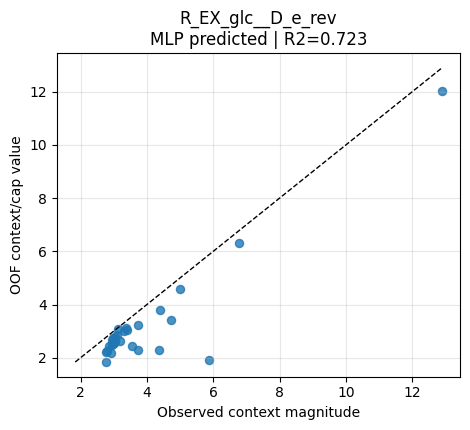

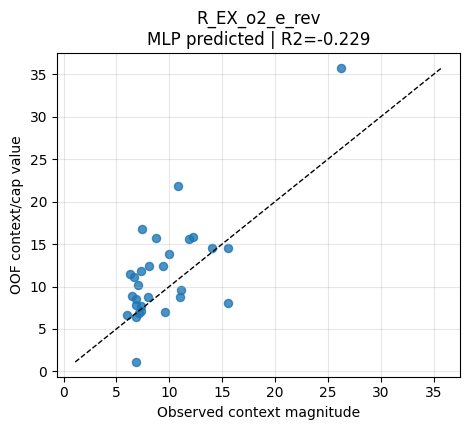

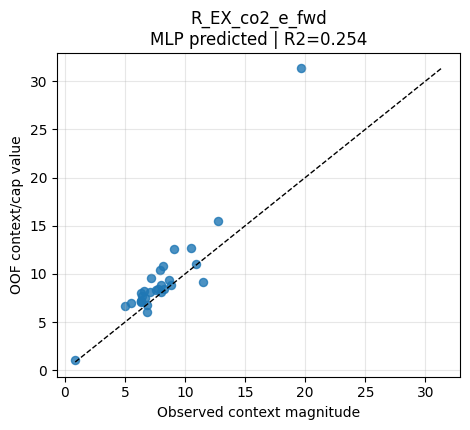

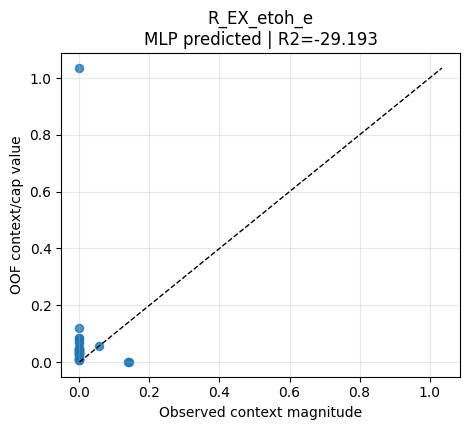

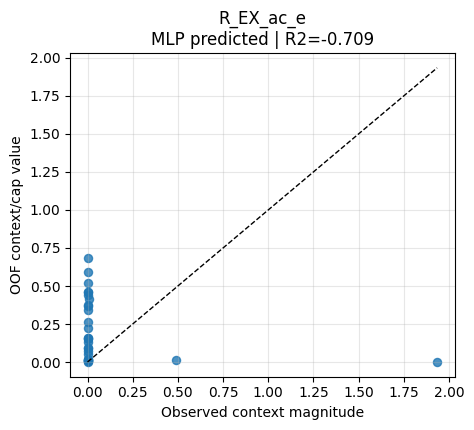

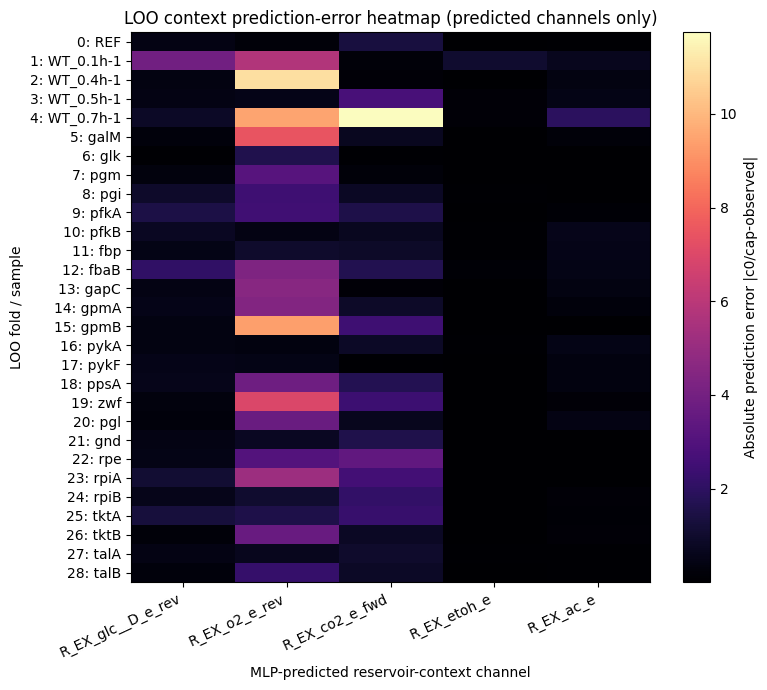

Top 5 folds by mean |predicted context-observed| across predicted context channels:
  1. fold=4 exp=WT_0.7h-1 mean_abs_pred_diff=4.836438
  2. fold=15 exp=gpmB mean_abs_pred_diff=2.447722
  3. fold=2 exp=WT_0.4h-1 mean_abs_pred_diff=2.398171
  4. fold=1 exp=WT_0.1h-1 mean_abs_pred_diff=2.318916
  5. fold=19 exp=zwf mean_abs_pred_diff=1.967784


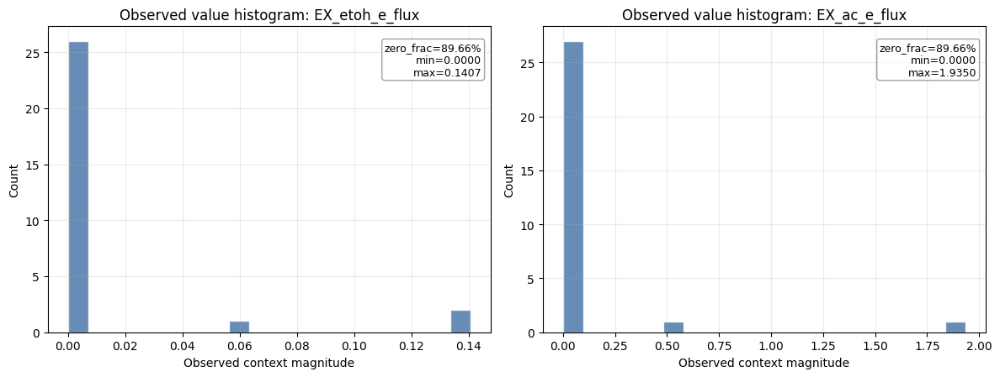

In [39]:
# Investigate the 5 reservoir-context channels in a dedicated cell
# - glucose/O2 are measured context by default (or predicted when MINN_GLC_O2_CONTEXT_MODE="predicted")
# - CO2/ethanol/acetate are latent context/cap values predicted by the front MLP
# - oof_pred_constraints stores the full 5-column context handed to FluxTransformer/pFBA
# - oof_true_constraints stores observed positive context magnitudes for diagnostics only
# Important: measured-copy channels are not predictions, so their identity R2 is not reported.

inspect_fluxes = list(minn_context_token_names)
inspect_sources = list(MINN_RESERVOIR_CONTEXT_SOURCE)

if len(inspect_fluxes) != 5:
    raise ValueError(f"Expected exactly 5 reservoir-context fluxes, got {len(inspect_fluxes)}: {inspect_fluxes}")
if len(inspect_sources) != len(inspect_fluxes):
    raise ValueError(
        f"Context source/token mismatch: {len(inspect_sources)} sources vs {len(inspect_fluxes)} tokens"
    )

# indices in vocabulary
token_to_idx = {tok: i for i, tok in enumerate(outputs)}
inspect_indices = [token_to_idx[f] for f in inspect_fluxes]

predicted_context_sources = set(globals().get("MINN_TRANSFORMER_PREDICTED_CONTEXT_SOURCE", []))
measured_context_sources = set(globals().get("MINN_TRANSFORMER_MEASURED_CONTEXT_SOURCE", []))
context_source_kind = [
    "MLP predicted" if src in predicted_context_sources else "measured copy"
    for src in inspect_sources
]
predicted_col_indices = [i for i, kind in enumerate(context_source_kind) if kind == "MLP predicted"]
copied_col_indices = [i for i, kind in enumerate(context_source_kind) if kind == "measured copy"]

if "oof_pred_constraints" in globals():
    pre_context = np.asarray(oof_pred_constraints, dtype=np.float32)
    context_value_label = "OOF context/cap value"
else:
    # Fallback sanity path using the setup model. This is not a trained OOF estimate.
    X_all_t = torch.tensor(X_minn_np, dtype=torch.float32, device=device)
    context_all_t = torch.tensor(y_minn_context_np, dtype=torch.float32, device=device)
    context_mag_all_t = torch.clamp(context_all_t * minn_context_signs_t.unsqueeze(0), min=0.0)
    measured_context_all = (
        context_mag_all_t.index_select(1, minn_measured_context_positions_t)
        if minn_measured_context_positions_t.numel() > 0
        else None
    )
    minn_model.eval()
    with torch.no_grad():
        c0_all = minn_model.build_full_input_vector(
            X_all_t,
            measured_context_values=measured_context_all,
        ).detach().cpu().numpy()
    pre_context = c0_all[:, inspect_indices]
    context_value_label = "setup-model context/cap value"

if pre_context.shape[1] != len(inspect_fluxes):
    raise ValueError(
        f"Expected {len(inspect_fluxes)} context columns, got {pre_context.shape[1]}"
    )

true_context = None
if "oof_true_constraints" in globals() and oof_true_constraints is not None:
    true_context = np.asarray(oof_true_constraints, dtype=np.float32)
elif "y_minn_context_np" in globals():
    true_context = np.maximum(0.0, y_minn_context_np * minn_context_signs.reshape(1, -1)).astype(np.float32)

if true_context is not None and true_context.shape != pre_context.shape:
    raise ValueError(
        f"Observed context shape {true_context.shape} does not match context value shape {pre_context.shape}"
    )

# summary
rows = []
for col, (flux, source, idx, kind) in enumerate(
    zip(inspect_fluxes, inspect_sources, inspect_indices, context_source_kind)
):
    cvals = pre_context[:, col]
    is_predicted_channel = kind == "MLP predicted"

    row = {
        "source_flux": source,
        "mapped_token": flux,
        "vocab_idx": idx,
        "context_source": kind,
        "c0_mean": float(np.mean(cvals)),
        "c0_std": float(np.std(cvals, ddof=1)) if len(cvals) > 1 else 0.0,
        "c0_min": float(np.min(cvals)),
        "c0_max": float(np.max(cvals)),
    }
    if true_context is not None:
        tvals = true_context[:, col]
        row.update({
            "true_mean": float(np.mean(tvals)),
            "true_min": float(np.min(tvals)),
            "true_max": float(np.max(tvals)),
            "prediction_r2": (
                float(r2_score(tvals, cvals))
                if is_predicted_channel and np.std(tvals) > 0 and np.std(cvals) > 0
                else np.nan
            ),
            "prediction_mae": (
                float(mean_absolute_error(tvals, cvals))
                if is_predicted_channel
                else np.nan
            ),
            "prediction_rmse": (
                float(root_mean_squared_error(tvals, cvals))
                if is_predicted_channel
                else np.nan
            ),
            "diagnostic_note": (
                "MLP prediction vs observed context magnitude"
                if is_predicted_channel
                else "measured value copied into context; identity is expected"
            ),
        })
    rows.append(row)

inspect_df = pd.DataFrame(rows)
print("5 reservoir-context channels: context/cap stats and diagnostic comparison to observed magnitudes")
print(f"Glucose/O2 transformer context mode: {MINN_GLC_O2_CONTEXT_MODE}")
print("Measured-copy context sources:", list(measured_context_sources))
print("MLP-predicted context sources:", list(predicted_context_sources))
display(inspect_df)

if copied_col_indices:
    copied_names = [inspect_sources[i] for i in copied_col_indices]
    print(
        "Note: prediction metrics are intentionally NaN for measured-copy channels "
        f"({copied_names}); plotting R2=1 for those would only confirm that the measured value was copied."
    )

# one scatter per context channel
if true_context is not None:
    for i, (flux, source, kind) in enumerate(zip(inspect_fluxes, inspect_sources, context_source_kind)):
        y_t = true_context[:, i]
        y_p = pre_context[:, i]

        is_predicted_channel = kind == "MLP predicted"
        r2_val = (
            r2_score(y_t, y_p)
            if is_predicted_channel and np.std(y_t) > 0 and np.std(y_p) > 0
            else np.nan
        )

        plt.figure(figsize=(4.8, 4.4))
        plt.scatter(y_t, y_p, alpha=0.8, s=34)
        lo = float(min(y_t.min(), y_p.min()))
        hi = float(max(y_t.max(), y_p.max()))
        plt.plot([lo, hi], [lo, hi], "k--", lw=1)
        plt.xlabel("Observed context magnitude")
        plt.ylabel(context_value_label)
        if is_predicted_channel:
            title_suffix = f"MLP predicted | R2={r2_val:.3f}"
        else:
            title_suffix = "measured copy, not a prediction"
        plt.title(f"{source}\n{title_suffix}")
        plt.grid(alpha=0.3)
        plt.tight_layout()
        plt.show()

    # fold x context absolute-difference heatmap for actually predicted context channels only
    if predicted_col_indices:
        predicted_abs_err = np.abs(pre_context[:, predicted_col_indices] - true_context[:, predicted_col_indices])
        predicted_fold_mean_err = predicted_abs_err.mean(axis=1)
        predicted_flux_labels = [inspect_sources[i] for i in predicted_col_indices]

        # Keep native LOO order by default. Optionally switch to worst-first order.
        sort_worst_first = False
        if sort_worst_first:
            row_order = np.argsort(-predicted_fold_mean_err)
        else:
            row_order = np.arange(predicted_abs_err.shape[0])

        abs_err_plot = predicted_abs_err[row_order]

        plt.figure(figsize=(8.0, 7.0))
        im = plt.imshow(abs_err_plot, aspect="auto", interpolation="nearest", cmap="magma")
        cbar = plt.colorbar(im)
        cbar.set_label("Absolute prediction error |c0/cap-observed|")

        plt.xticks(np.arange(len(predicted_flux_labels)), predicted_flux_labels, rotation=25, ha="right")

        # y-axis labels: fold index (+ experiment when available)
        if "minn_experiments" in globals() and len(minn_experiments) == predicted_abs_err.shape[0]:
            y_labels = [f"{int(i)}: {minn_experiments[i]}" for i in row_order]
        else:
            y_labels = [str(int(i)) for i in row_order]
        plt.yticks(np.arange(abs_err_plot.shape[0]), y_labels)

        plt.xlabel("MLP-predicted reservoir-context channel")
        plt.ylabel("LOO fold / sample")
        plt.title("LOO context prediction-error heatmap (predicted channels only)")
        plt.tight_layout()
        plt.show()

        # Print worst folds by mean absolute prediction error across predicted context channels
        k = min(5, predicted_abs_err.shape[0])
        worst = np.argsort(-predicted_fold_mean_err)[:k]
        print(f"Top {k} folds by mean |predicted context-observed| across predicted context channels:")
        for rank, i in enumerate(worst, start=1):
            exp_name = (
                minn_experiments[i]
                if "minn_experiments" in globals() and i < len(minn_experiments)
                else f"idx_{i}"
            )
            print(f"  {rank}. fold={int(i)} exp={exp_name} mean_abs_pred_diff={float(predicted_fold_mean_err[i]):.6f}")
    else:
        print("No MLP-predicted context channels are available for prediction-error heatmap.")

    # Histograms for ethanol and acetate observed context values
    etoh_idx = next((ii for ii, ff in enumerate(inspect_fluxes) if "etoh" in ff.lower()), None)
    ac_idx = next((ii for ii, ff in enumerate(inspect_fluxes) if "ac_e" in ff.lower() or "_ac_" in ff.lower()), None)

    hist_specs = []
    if etoh_idx is not None:
        hist_specs.append((etoh_idx, inspect_fluxes[etoh_idx]))
    if ac_idx is not None:
        hist_specs.append((ac_idx, inspect_fluxes[ac_idx]))

    if len(hist_specs) > 0:
        fig, axes = plt.subplots(1, len(hist_specs), figsize=(6.0 * len(hist_specs), 4.6), squeeze=False)
        axes = axes.ravel()

        for ax, (col_idx, flux_name) in zip(axes, hist_specs):
            vals = true_context[:, col_idx].astype(float)
            ax.hist(vals, bins=20, alpha=0.85, color="#4c78a8", edgecolor="white")
            ax.set_title(f"Observed value histogram: {flux_name}")
            ax.set_xlabel("Observed context magnitude")
            ax.set_ylabel("Count")
            ax.grid(alpha=0.25)

            zero_frac = float(np.mean(np.isclose(vals, 0.0)))
            ax.text(
                0.98,
                0.95,
                f"zero_frac={zero_frac:.2%}\nmin={vals.min():.4f}\nmax={vals.max():.4f}",
                transform=ax.transAxes,
                ha="right",
                va="top",
                fontsize=9,
                bbox=dict(boxstyle="round,pad=0.25", facecolor="white", alpha=0.75, edgecolor="gray"),
            )

        plt.tight_layout()
        plt.show()
    else:
        print("Could not find etoh/ac context columns in inspect_fluxes.")
else:
    print("Run the nested CV training cell first to generate OOF context diagnostics.")
